In [1]:
import os
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import time

%matplotlib inline

In [2]:
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

In [3]:
#### Data ####

BATCH_SIZE = 64
DATASET = "CIFAR100"
NUM_CLASSES = 100

def normalize_data(X_train, X_test):
    _mean = X_train.mean(axis=(0, 1, 2), keepdims=True)
    _std = X_train.std(axis=(0, 1, 2), keepdims=True)
    X_train = (X_train - _mean) / _std
    X_test = (X_test - _mean) / _std
    return X_train, X_test
    
def get_tf_dataset_iter(data):
    dataset = tf.data.Dataset.from_tensor_slices(data)
    dataset = dataset.repeat(None)    # Repeat Indefinitely
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(1)
    dataiter = iter(dataset)
    return dataiter

In [4]:
def get_data(dataset):
    if dataset == "CIFAR100":
        data = tf.keras.datasets.cifar100.load_data()
    elif dataset == "CIFAR10":
        data = tf.keras.datasets.cifar10.load_data()
    else:
        print ("Invalid Dataset!!")
        exit(-1)

    (X_train, y_train), (X_test, y_test) = data
    X_train = np.asarray(X_train, dtype=np.float32)
    y_train = np.asarray(y_train, dtype=np.int32).flatten()
    X_test = np.asarray(X_test, dtype=np.float32)
    y_test = np.asarray(y_test, dtype=np.int32).flatten()

    X_train, X_test = normalize_data(X_train, X_test)
    
    X_train, X_val = np.split(X_train, [int(0.98*len(X_train))])
    y_train, y_val = np.split(y_train, [int(0.98*len(y_train))])

    return X_train, y_train, X_val, y_val, X_test, y_test


X_train, y_train, X_val, y_val, X_test, y_test = get_data(DATASET)
X_train_iter = get_tf_dataset_iter(X_train)
y_train_iter = get_tf_dataset_iter(y_train)
X_val_iter = get_tf_dataset_iter(X_val)
y_val_iter = get_tf_dataset_iter(y_val)
X_test_iter = get_tf_dataset_iter(X_test)
y_test_iter = get_tf_dataset_iter(y_test)

In [5]:
def timeme(method):
    def wrapper(*args, **kw):
        startTime = int(round(time.time() * 1000))
        result = method(*args, **kw)
        endTime = int(round(time.time() * 1000))

        print("Execution Time:", endTime - startTime,'ms')
        return result

    return wrapper

In [6]:
def get_accuracy(model, Xset, yset, Xiter, yiter):
    total_batches = (Xset.shape[0] // BATCH_SIZE) + 1
    num_correct, num_samples = 0, 0
    for batch_num in range(total_batches):
        batch_X = next(Xiter)
        batch_y = next(yiter).numpy()
        scores = model(batch_X, is_training = False)
        scores = scores.numpy()
        pred_y = scores.argmax(axis=1)
        num_samples += batch_X.shape[0]
        num_correct += (pred_y == batch_y).sum()
    accuracy = float(num_correct) / num_samples
    return 100*accuracy

In [7]:
EPOCH_ITERATIONS = 700
LEARNING_RATE = 3e-4
EXPERIMENT_ROOT = './experiment'
PRINT_FREQUENCY = 100

@timeme
# def train(CNN_class, num_epochs = 10, resume = False, plot_losses = True):
def train(model, num_epochs = 10, resume = False, plot_losses = True):
#     model = CNN_class(NUM_CLASSES)
    decay_start_iteration = 0.6 * (num_epochs * EPOCH_ITERATIONS)
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(LEARNING_RATE, (num_epochs * EPOCH_ITERATIONS) - decay_start_iteration, 0.001)
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

    writer = tf.summary.create_file_writer(EXPERIMENT_ROOT)
    ckpt = tf.train.Checkpoint(step=tf.Variable(0), optimizer=optimizer, net=model)
    manager = tf.train.CheckpointManager(ckpt, EXPERIMENT_ROOT, max_to_keep=10)

    if resume:
        ckpt.restore(manager.latest_checkpoint)

    stop_training = False
    for epc in range(1, num_epochs + 1):
        print ("[Epoch {}]".format(epc))
        loss_list = []
        validation_accuracies = []
        for iter_num in range(EPOCH_ITERATIONS):
            batch_X = next(X_train_iter)
            batch_y = next(y_train_iter)
            with tf.GradientTape() as tape:
                scores = model(batch_X, is_training = True)
                losses = tf.nn.sparse_softmax_cross_entropy_with_logits(labels=batch_y, logits=scores)
                meanloss = tf.reduce_mean(losses)
                loss_list.append(meanloss)
                lossnp = losses.numpy()

            if iter_num % PRINT_FREQUENCY == 0:

                with writer.as_default():
                    tf.summary.scalar("loss", meanloss, step=iter_num)
                    tf.summary.histogram('losses',losses,step=iter_num)

                print('iter:{:6d}, loss min|avg|max: {:.3f}|{:.3f}|{:6.3f}, '
                      .format(iter_num,
                              float(np.min(lossnp)),
                              float(np.mean(lossnp)),
                              float(np.max(lossnp))), end="")
                validation_acc = get_accuracy(model, X_val, y_val, X_val_iter, y_val_iter)
                validation_accuracies.append(validation_acc)
                print ('val acc: {:.2f} %'.format(validation_acc))
                
                if epc >= 3 and validation_acc <= 20.0:
                    print ("Circuit Breaker!! Validation accuracy too low")
                    stop_training = True
                    break

            grad = tape.gradient(meanloss, model.trainable_variables)
            optimizer.apply_gradients(zip(grad, model.trainable_variables))
            ckpt.step.assign_add(1)
            
        manager.save()
        
        if stop_training:
            break
            
        if plot_losses:
            plt.plot(loss_list, 'r')
            plt.grid(True)
            plt.title('Epoch {} Loss'.format(epc))
            plt.xlabel('MiniBatch number')
            plt.ylabel('MiniBatch loss')
            plt.show()
            
            plt.plot(validation_accuracies)
            plt.grid(True)
            plt.title('Epoch {} Validation Accuracies'.format(epc))
            plt.xlabel('MiniBatch number (100s)')
            plt.ylabel('Validation Accuracy')
            plt.show()
#     return model

### CNN1

In [8]:
class CNN1(tf.keras.Model):
    def __init__(self, num_classes, input_shape = (32, 32, 3)):
        super().__init__()
        self.conv1 = tf.keras.layers.Conv2D(input_shape = input_shape, filters = 16, kernel_size = [5,5],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv1')
        self.conv2 = tf.keras.layers.Conv2D(filters = 32, kernel_size = [5,5],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv2')
        self.flatten1 = tf.keras.layers.Flatten()
        self.fc1 = tf.keras.layers.Dense(512, name = 'fc1')
        self.fc2 = tf.keras.layers.Dense(num_classes, name = 'fc2')

    def call(self, batch_input, is_training):
        x = self.conv1(batch_input)
        x = self.conv2(x)
        x = self.flatten1(x)
        x = self.fc1(x)
        x = self.fc2(x)
        return x

### CNN2

In [9]:
class CNN2(tf.keras.Model):
    def __init__(self, num_classes, input_shape = (32, 32, 3)):
        super().__init__()
        self.conv1 = tf.keras.layers.Conv2D(input_shape = input_shape, filters = 16, kernel_size = [3,3],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv1')
        self.conv2 = tf.keras.layers.Conv2D(filters = 32, kernel_size = [3,3],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv2')
        self.flatten1 = tf.keras.layers.Flatten()
        self.fc1 = tf.keras.layers.Dense(512, name = 'fc1')
        self.fc2 = tf.keras.layers.Dense(num_classes, name = 'fc2')

    def call(self, batch_input, is_training):
        x = self.conv1(batch_input)
        x = self.conv2(x)
        x = self.flatten1(x)
        x = self.fc1(x)
        x = self.fc2(x)
        return x

### CNN3

In [10]:
class CNN3(tf.keras.Model):
    def __init__(self, num_classes, input_shape = (32, 32, 3)):
        super().__init__()
        self.conv1 = tf.keras.layers.Conv2D(input_shape = input_shape, filters = 32, kernel_size = [5,5],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv1')
        self.conv2 = tf.keras.layers.Conv2D(filters = 64, kernel_size = [5,5],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv2')
        self.flatten1 = tf.keras.layers.Flatten()
        self.fc1 = tf.keras.layers.Dense(512, name = 'fc1')
        self.fc2 = tf.keras.layers.Dense(num_classes, name = 'fc2')

    def call(self, batch_input, is_training):
        x = self.conv1(batch_input)
        x = self.conv2(x)
        x = self.flatten1(x)
        x = self.fc1(x)
        x = self.fc2(x)
        return x

### CNN4

In [11]:
class CNN4(tf.keras.Model):
    def __init__(self, num_classes, input_shape = (32, 32, 3)):
        super().__init__()
        self.conv1 = tf.keras.layers.Conv2D(input_shape = input_shape, filters = 32, kernel_size = [3,3],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv1')
        self.max_pool1 = tf.keras.layers.MaxPooling2D(pool_size = [2,2], strides = [2,2], name = 'max_pool1')
        self.conv2 = tf.keras.layers.Conv2D(filters = 64, kernel_size = [3,3],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv2')
        self.max_pool2 = tf.keras.layers.MaxPooling2D(pool_size = [2,2], strides = [2,2], name = 'max_pool2')
        self.flatten1 = tf.keras.layers.Flatten()
        self.fc1 = tf.keras.layers.Dense(512, name = 'fc1')
        self.bnorm1 = tf.keras.layers.BatchNormalization(axis=1,momentum=0.9,epsilon=1e-5, name = 'bnorm1')
        self.fc2 = tf.keras.layers.Dense(num_classes, name = 'fc2')

    def call(self, batch_input, is_training):
        x = self.conv1(batch_input)
        x = self.max_pool1(x)
        x = self.conv2(x)
        x = self.max_pool2(x)
        x = self.flatten1(x)
        x = self.fc1(x)
        x = self.bnorm1(x)
        x = self.fc2(x)
        return x

### CNN5

In [12]:
class CNN5(tf.keras.Model):
    def __init__(self, num_classes, input_shape = (32, 32, 3)):
        super().__init__()
        self.conv1 = tf.keras.layers.Conv2D(input_shape = input_shape, filters = 32, kernel_size = [3,3],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv1')
        self.max_pool1 = tf.keras.layers.MaxPooling2D(pool_size = [2,2], strides = [2,2], name = 'max_pool1')
        self.conv2 = tf.keras.layers.Conv2D(filters = 64, kernel_size = [3,3],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv2')
        self.max_pool2 = tf.keras.layers.MaxPooling2D(pool_size = [2,2], strides = [2,2], name = 'max_pool2')
        self.flatten1 = tf.keras.layers.Flatten()
        self.fc1 = tf.keras.layers.Dense(512, name = 'fc1')
        self.bnorm1 = tf.keras.layers.BatchNormalization(axis=1,momentum=0.9,epsilon=1e-5, name = 'bnorm1')
        self.fc2 = tf.keras.layers.Dense(num_classes, name = 'fc2')

    def call(self, batch_input, is_training):
        x = self.conv1(batch_input)
        x = self.max_pool1(x)
        x = self.conv2(x)
        x = self.max_pool2(x)
        x = self.flatten1(x)
        x = self.fc1(x)
        x = self.bnorm1(x, is_training)
        x = self.fc2(x)
        return x

### CNN6

In [13]:
class CNN6(tf.keras.Model):
    def __init__(self, num_classes, input_shape = (32, 32, 3)):
        super().__init__()
        self.conv1 = tf.keras.layers.Conv2D(input_shape = input_shape, filters = 32, kernel_size = [3,3],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv1')
        self.bnorm1 = tf.keras.layers.BatchNormalization(axis = 1, momentum = 0.9, epsilon = 1e-5, name = 'bnorm1')
        
        self.conv2 = tf.keras.layers.Conv2D(filters = 64, kernel_size = [3,3],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv2')
        self.bnorm2 = tf.keras.layers.BatchNormalization(axis = 1, momentum = 0.9, epsilon = 1e-5, name = 'bnorm2')
        
        self.max_pool1 = tf.keras.layers.MaxPooling2D(pool_size = [2,2], strides = [2,2], name = 'max_pool1')

        self.flatten1 = tf.keras.layers.Flatten()
        self.fc1 = tf.keras.layers.Dense(512, name = 'fc1')
        self.bnorm3 = tf.keras.layers.BatchNormalization(axis = 1, momentum = 0.9, epsilon = 1e-5, name = 'bnorm3')
        self.fc2 = tf.keras.layers.Dense(num_classes, name = 'fc2')

    def call(self, batch_input, is_training):
        x = self.conv1(batch_input)
        x = self.bnorm1(x, is_training)
        x = self.conv2(x)
        x = self.bnorm2(x, is_training)
        x = self.max_pool1(x)
        x = self.flatten1(x)
        x = self.fc1(x)
        x = self.bnorm3(x, is_training)
        x = self.fc2(x)
        return x

### CNN7

In [14]:
class CNN7(tf.keras.Model):
    def __init__(self, num_classes, input_shape = (32, 32, 3)):
        super().__init__()
        self.conv1 = tf.keras.layers.Conv2D(input_shape = input_shape, filters = 64, kernel_size = [3,3],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv1')
        self.max_pool1 = tf.keras.layers.MaxPooling2D(pool_size = [2,2], strides = [2,2], name = 'max_pool1')
        self.conv2 = tf.keras.layers.Conv2D(filters = 128, kernel_size = [3,3],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv2')
        self.max_pool2 = tf.keras.layers.MaxPooling2D(pool_size = [2,2], strides = [2,2], name = 'max_pool2')
        self.conv3 = tf.keras.layers.Conv2D(filters = 256, kernel_size = [3,3],
                            padding = 'SAME', activation = tf.nn.relu, name = 'conv3')
        self.gpool1 = tf.keras.layers.GlobalAveragePooling2D()
        self.fc1 = tf.keras.layers.Dense(512, name = 'fc1')
        self.bnorm1 = tf.keras.layers.BatchNormalization(axis = 1, momentum = 0.9,epsilon = 1e-5, name='bnorm1')
        self.fc2 = tf.keras.layers.Dense(num_classes, name = 'fc2')

    def call(self, batch_input, is_training):
        x = self.conv1(batch_input)
        x = self.max_pool1(x)
        x = self.conv2(x)
        x = self.max_pool2(x)
        x = self.conv3(x)
        x = self.gpool1(x)
        x = self.fc1(x)
        x = self.bnorm1(x, is_training)
        x = self.fc2(x)
        return x

# Experiments

### Experiment #1 - CNN1

[Epoch 1]
iter:     0, loss min|avg|max: 3.786|4.729| 5.648, val acc: 1.46 %
iter:   100, loss min|avg|max: 1.506|3.742| 6.257, val acc: 10.55 %
iter:   200, loss min|avg|max: 0.268|3.571| 9.090, val acc: 16.11 %
iter:   300, loss min|avg|max: 0.527|3.343| 5.757, val acc: 19.34 %
iter:   400, loss min|avg|max: 0.146|3.025| 8.455, val acc: 22.85 %
iter:   500, loss min|avg|max: 0.004|3.027| 6.837, val acc: 26.86 %
iter:   600, loss min|avg|max: 0.267|3.179| 6.813, val acc: 26.86 %


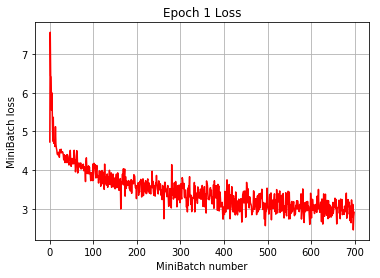

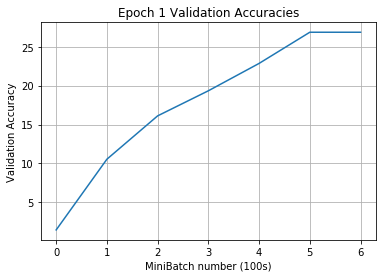

[Epoch 2]
iter:     0, loss min|avg|max: 0.025|2.786| 5.971, val acc: 29.79 %
iter:   100, loss min|avg|max: 0.004|2.737| 8.654, val acc: 30.47 %
iter:   200, loss min|avg|max: 0.016|2.794|11.370, val acc: 30.57 %
iter:   300, loss min|avg|max: 0.038|2.535| 9.952, val acc: 28.61 %
iter:   400, loss min|avg|max: 0.060|2.249| 6.492, val acc: 30.08 %
iter:   500, loss min|avg|max: 0.017|2.045| 6.026, val acc: 32.23 %
iter:   600, loss min|avg|max: 0.006|1.681| 6.321, val acc: 31.54 %


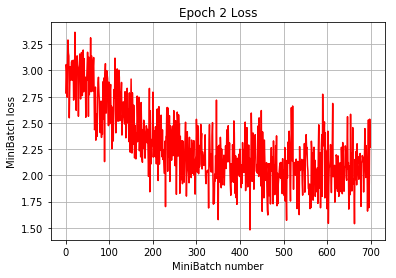

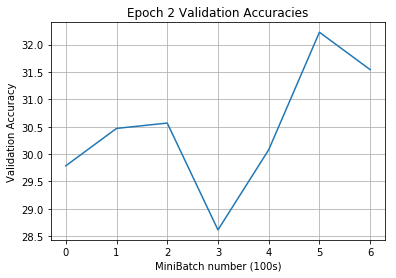

[Epoch 3]
iter:     0, loss min|avg|max: 0.013|1.995| 5.411, val acc: 31.45 %
iter:   100, loss min|avg|max: 0.017|2.095| 6.565, val acc: 33.69 %
iter:   200, loss min|avg|max: 0.009|1.912| 8.536, val acc: 32.23 %
iter:   300, loss min|avg|max: 0.016|1.672| 5.350, val acc: 33.01 %
iter:   400, loss min|avg|max: 0.018|1.638| 7.755, val acc: 32.91 %
iter:   500, loss min|avg|max: 0.003|1.546| 7.723, val acc: 32.71 %
iter:   600, loss min|avg|max: 0.001|1.349| 4.826, val acc: 33.11 %


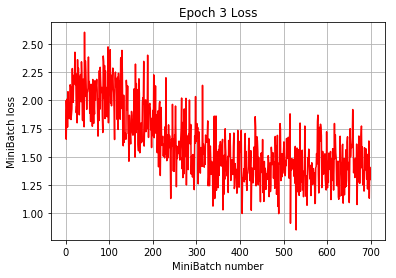

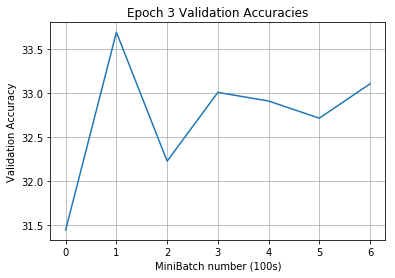

[Epoch 4]
iter:     0, loss min|avg|max: 0.004|1.731| 6.982, val acc: 32.91 %
iter:   100, loss min|avg|max: 0.005|1.613| 6.252, val acc: 31.25 %
iter:   200, loss min|avg|max: 0.001|0.943| 7.915, val acc: 34.08 %
iter:   300, loss min|avg|max: 0.004|0.930| 5.093, val acc: 33.20 %
iter:   400, loss min|avg|max: 0.003|0.988| 7.118, val acc: 33.20 %
iter:   500, loss min|avg|max: 0.001|1.122| 9.150, val acc: 32.13 %
iter:   600, loss min|avg|max: 0.000|0.963| 4.455, val acc: 32.32 %


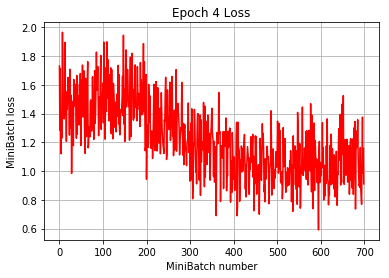

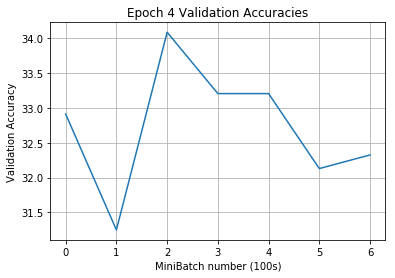

[Epoch 5]
iter:     0, loss min|avg|max: 0.000|0.849| 5.361, val acc: 33.50 %
iter:   100, loss min|avg|max: 0.021|1.189| 7.491, val acc: 33.40 %
iter:   200, loss min|avg|max: 0.000|1.289| 7.096, val acc: 33.89 %
iter:   300, loss min|avg|max: 0.001|1.395| 5.364, val acc: 33.50 %
iter:   400, loss min|avg|max: 0.001|0.931| 9.414, val acc: 33.40 %
iter:   500, loss min|avg|max: 0.001|0.858| 5.028, val acc: 33.89 %
iter:   600, loss min|avg|max: 0.001|0.837| 3.587, val acc: 34.57 %


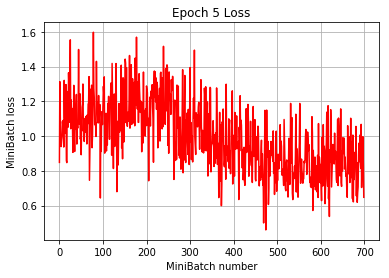

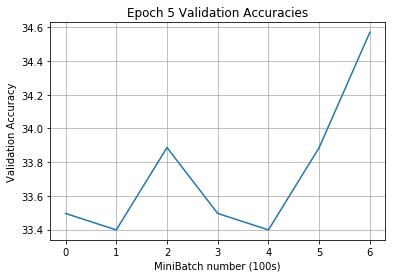

[Epoch 6]
iter:     0, loss min|avg|max: 0.000|0.892| 6.525, val acc: 34.38 %
iter:   100, loss min|avg|max: 0.003|0.685| 5.281, val acc: 34.67 %
iter:   200, loss min|avg|max: 0.002|0.859| 5.133, val acc: 34.57 %
iter:   300, loss min|avg|max: 0.006|1.092|10.112, val acc: 33.98 %
iter:   400, loss min|avg|max: 0.000|0.816| 4.228, val acc: 33.98 %
iter:   500, loss min|avg|max: 0.000|0.831| 5.610, val acc: 33.98 %
iter:   600, loss min|avg|max: 0.001|0.937| 4.648, val acc: 33.69 %


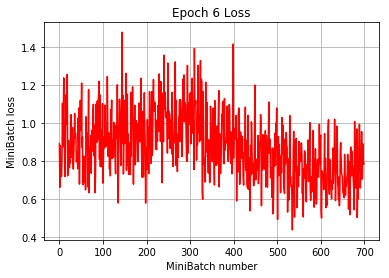

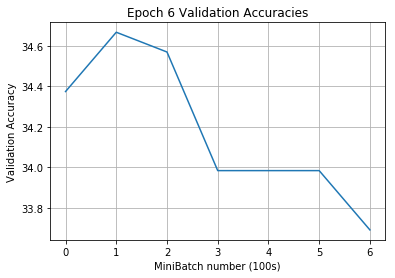

[Epoch 7]
iter:     0, loss min|avg|max: 0.000|0.830| 8.044, val acc: 34.86 %
iter:   100, loss min|avg|max: 0.000|0.796| 7.896, val acc: 33.59 %
iter:   200, loss min|avg|max: 0.001|0.686| 4.199, val acc: 35.06 %
iter:   300, loss min|avg|max: 0.001|0.918| 4.887, val acc: 34.47 %
iter:   400, loss min|avg|max: 0.000|0.691| 2.894, val acc: 34.08 %
iter:   500, loss min|avg|max: 0.000|0.604| 4.073, val acc: 33.59 %
iter:   600, loss min|avg|max: 0.002|0.501| 3.711, val acc: 33.89 %


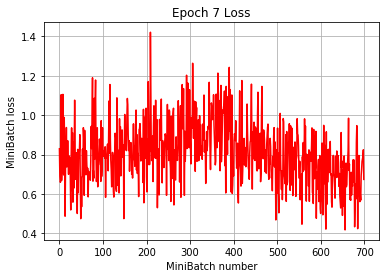

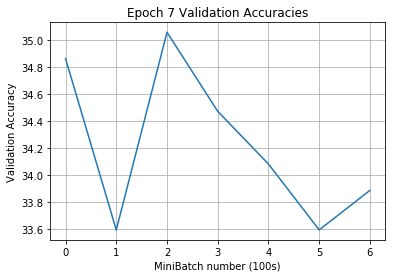

[Epoch 8]
iter:     0, loss min|avg|max: 0.002|0.622| 3.224, val acc: 34.08 %
iter:   100, loss min|avg|max: 0.000|0.718| 3.408, val acc: 33.50 %
iter:   200, loss min|avg|max: 0.003|0.593| 3.867, val acc: 33.11 %
iter:   300, loss min|avg|max: 0.001|0.917| 5.880, val acc: 33.79 %
iter:   400, loss min|avg|max: 0.013|0.860| 6.193, val acc: 34.28 %
iter:   500, loss min|avg|max: 0.001|0.694| 4.804, val acc: 34.18 %
iter:   600, loss min|avg|max: 0.001|0.810| 3.962, val acc: 33.50 %


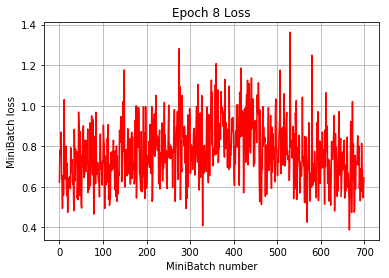

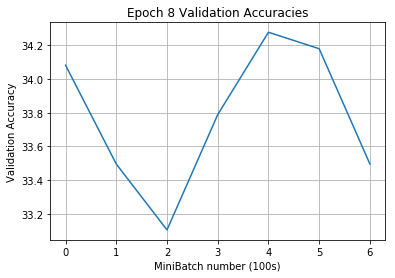

[Epoch 9]
iter:     0, loss min|avg|max: 0.005|0.701| 4.746, val acc: 33.59 %
iter:   100, loss min|avg|max: 0.000|0.813| 3.683, val acc: 34.08 %
iter:   200, loss min|avg|max: 0.000|0.589| 3.696, val acc: 34.47 %
iter:   300, loss min|avg|max: 0.000|0.710| 3.001, val acc: 34.47 %
iter:   400, loss min|avg|max: 0.000|0.696| 5.596, val acc: 34.38 %
iter:   500, loss min|avg|max: 0.001|0.728| 4.305, val acc: 34.18 %
iter:   600, loss min|avg|max: 0.000|0.909| 5.088, val acc: 33.89 %


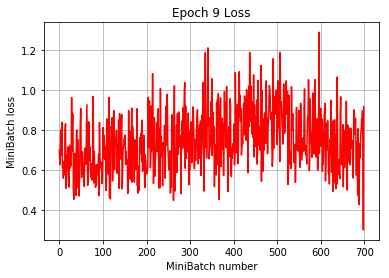

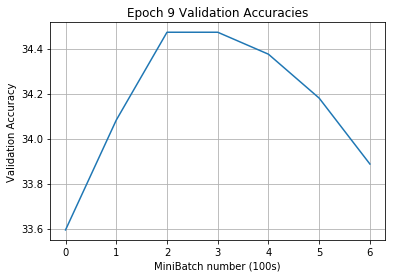

[Epoch 10]
iter:     0, loss min|avg|max: 0.000|0.722| 4.377, val acc: 33.69 %
iter:   100, loss min|avg|max: 0.002|0.582| 3.766, val acc: 33.89 %
iter:   200, loss min|avg|max: 0.000|0.519| 3.675, val acc: 34.38 %
iter:   300, loss min|avg|max: 0.000|0.602| 2.780, val acc: 34.47 %
iter:   400, loss min|avg|max: 0.000|0.735| 4.828, val acc: 34.18 %
iter:   500, loss min|avg|max: 0.004|0.863| 6.320, val acc: 33.89 %
iter:   600, loss min|avg|max: 0.000|0.852| 4.003, val acc: 34.08 %


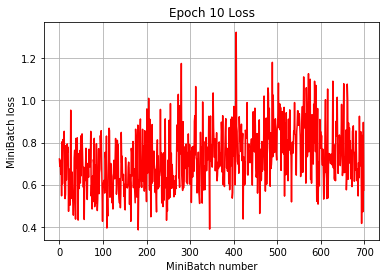

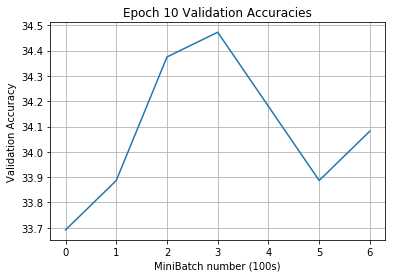

[Epoch 11]
iter:     0, loss min|avg|max: 0.001|0.523| 4.477, val acc: 33.98 %
iter:   100, loss min|avg|max: 0.002|0.804| 4.162, val acc: 33.79 %
iter:   200, loss min|avg|max: 0.002|0.713| 5.843, val acc: 34.08 %
iter:   300, loss min|avg|max: 0.001|0.763| 9.905, val acc: 33.89 %
iter:   400, loss min|avg|max: 0.002|0.695| 3.861, val acc: 33.98 %
iter:   500, loss min|avg|max: 0.006|0.764| 4.424, val acc: 33.98 %
iter:   600, loss min|avg|max: 0.000|0.788| 4.380, val acc: 34.08 %


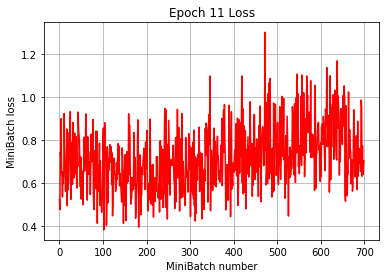

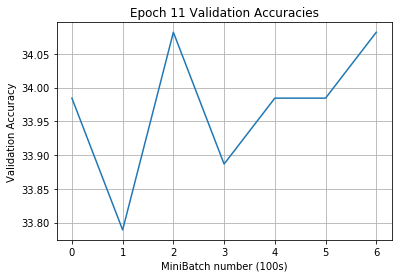

[Epoch 12]
iter:     0, loss min|avg|max: 0.001|0.752| 5.538, val acc: 34.18 %
iter:   100, loss min|avg|max: 0.002|0.672| 6.867, val acc: 33.59 %
iter:   200, loss min|avg|max: 0.000|0.767| 4.416, val acc: 33.59 %
iter:   300, loss min|avg|max: 0.000|0.747| 5.404, val acc: 33.30 %
iter:   400, loss min|avg|max: 0.000|0.656| 5.492, val acc: 33.89 %
iter:   500, loss min|avg|max: 0.001|0.720| 6.641, val acc: 34.28 %
iter:   600, loss min|avg|max: 0.001|0.698| 5.670, val acc: 33.89 %


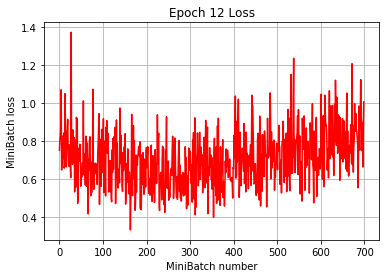

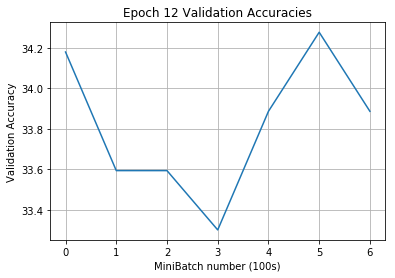

[Epoch 13]
iter:     0, loss min|avg|max: 0.000|0.857| 7.580, val acc: 33.98 %
iter:   100, loss min|avg|max: 0.000|0.692| 4.086, val acc: 33.89 %
iter:   200, loss min|avg|max: 0.001|0.660| 4.518, val acc: 33.89 %
iter:   300, loss min|avg|max: 0.000|0.577| 4.256, val acc: 33.89 %
iter:   400, loss min|avg|max: 0.000|0.762| 5.935, val acc: 33.98 %
iter:   500, loss min|avg|max: 0.000|0.556| 3.791, val acc: 33.69 %
iter:   600, loss min|avg|max: 0.004|0.628| 4.234, val acc: 34.08 %


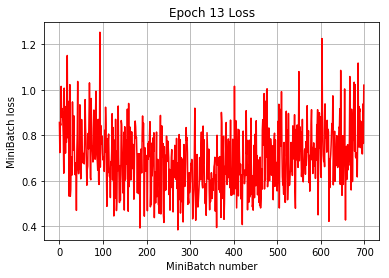

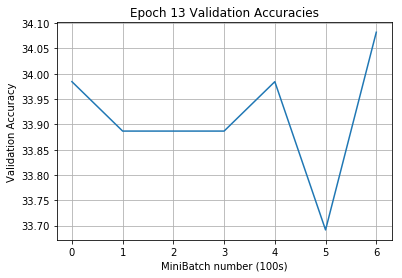

[Epoch 14]
iter:     0, loss min|avg|max: 0.000|0.999| 7.290, val acc: 33.40 %
iter:   100, loss min|avg|max: 0.000|0.740| 5.676, val acc: 33.79 %
iter:   200, loss min|avg|max: 0.000|0.722| 5.619, val acc: 33.69 %
iter:   300, loss min|avg|max: 0.000|0.588| 3.992, val acc: 33.89 %
iter:   400, loss min|avg|max: 0.003|0.541| 3.051, val acc: 33.79 %
iter:   500, loss min|avg|max: 0.000|0.451| 3.071, val acc: 33.89 %
iter:   600, loss min|avg|max: 0.000|0.697| 4.360, val acc: 33.98 %


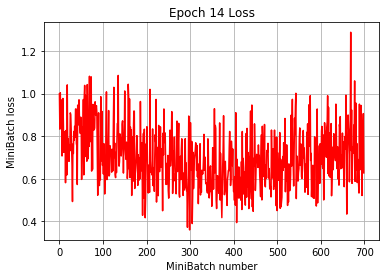

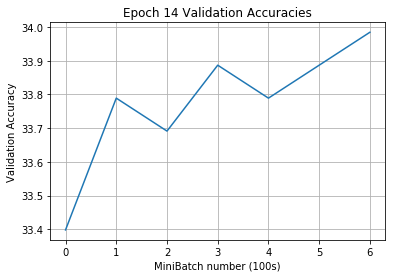

[Epoch 15]
iter:     0, loss min|avg|max: 0.000|0.634| 4.975, val acc: 33.59 %
iter:   100, loss min|avg|max: 0.000|0.864| 6.493, val acc: 33.59 %
iter:   200, loss min|avg|max: 0.000|0.952| 6.718, val acc: 34.57 %
iter:   300, loss min|avg|max: 0.000|0.794| 5.193, val acc: 33.98 %
iter:   400, loss min|avg|max: 0.000|0.826| 4.925, val acc: 34.08 %
iter:   500, loss min|avg|max: 0.000|0.596| 4.585, val acc: 34.28 %
iter:   600, loss min|avg|max: 0.006|0.848| 7.493, val acc: 33.98 %


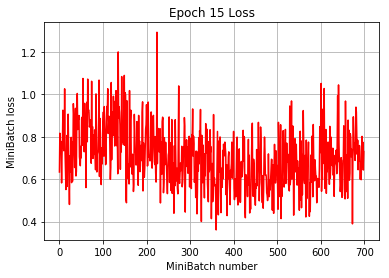

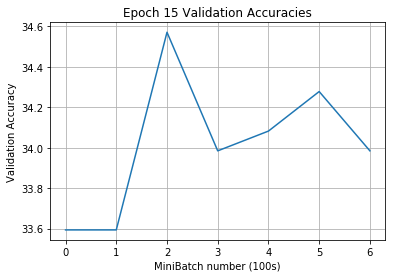

[Epoch 16]
iter:     0, loss min|avg|max: 0.000|0.810| 4.225, val acc: 33.79 %
iter:   100, loss min|avg|max: 0.000|0.822| 3.976, val acc: 33.89 %
iter:   200, loss min|avg|max: 0.000|0.932| 6.816, val acc: 34.18 %
iter:   300, loss min|avg|max: 0.002|0.627| 3.932, val acc: 33.98 %
iter:   400, loss min|avg|max: 0.000|0.710| 5.452, val acc: 33.98 %
iter:   500, loss min|avg|max: 0.000|0.597| 3.829, val acc: 33.79 %
iter:   600, loss min|avg|max: 0.000|0.683| 4.009, val acc: 33.98 %


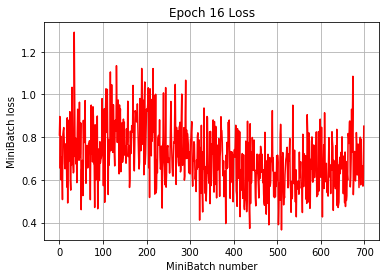

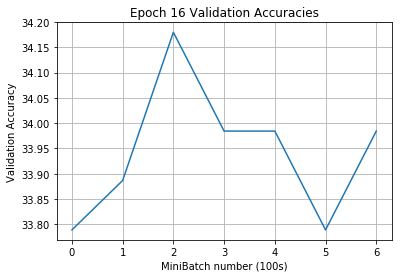

[Epoch 17]
iter:     0, loss min|avg|max: 0.001|0.615| 6.001, val acc: 34.08 %
iter:   100, loss min|avg|max: 0.001|1.218|14.903, val acc: 34.08 %
iter:   200, loss min|avg|max: 0.000|0.926| 7.898, val acc: 34.08 %
iter:   300, loss min|avg|max: 0.000|0.649| 3.230, val acc: 34.08 %
iter:   400, loss min|avg|max: 0.000|0.502| 3.754, val acc: 33.69 %
iter:   500, loss min|avg|max: 0.000|0.774| 8.232, val acc: 34.18 %
iter:   600, loss min|avg|max: 0.000|0.525| 3.580, val acc: 33.98 %


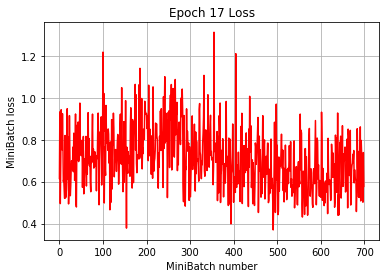

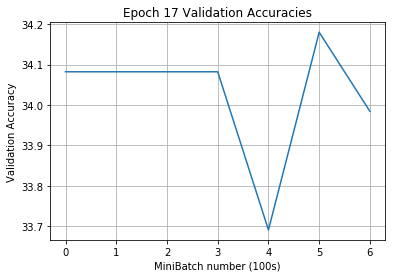

[Epoch 18]
iter:     0, loss min|avg|max: 0.000|0.567| 3.504, val acc: 33.89 %
iter:   100, loss min|avg|max: 0.002|0.810| 4.732, val acc: 34.08 %
iter:   200, loss min|avg|max: 0.007|0.683| 3.205, val acc: 33.40 %
iter:   300, loss min|avg|max: 0.001|1.013| 9.277, val acc: 33.79 %
iter:   400, loss min|avg|max: 0.004|0.649| 4.059, val acc: 34.18 %
iter:   500, loss min|avg|max: 0.000|0.600| 5.259, val acc: 34.28 %
iter:   600, loss min|avg|max: 0.003|0.469| 3.076, val acc: 33.89 %


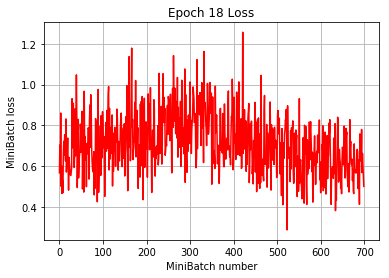

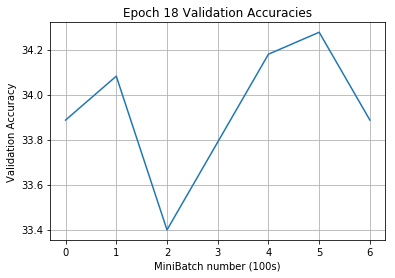

[Epoch 19]
iter:     0, loss min|avg|max: 0.000|0.846| 5.158, val acc: 34.18 %
iter:   100, loss min|avg|max: 0.001|0.642| 5.286, val acc: 34.08 %
iter:   200, loss min|avg|max: 0.000|0.913| 5.878, val acc: 33.98 %
iter:   300, loss min|avg|max: 0.001|0.899| 3.952, val acc: 33.69 %
iter:   400, loss min|avg|max: 0.000|1.040| 5.201, val acc: 34.28 %
iter:   500, loss min|avg|max: 0.002|0.867| 6.277, val acc: 33.98 %
iter:   600, loss min|avg|max: 0.000|0.737| 6.289, val acc: 33.98 %


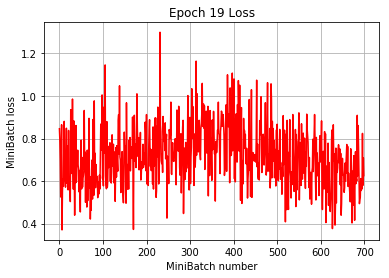

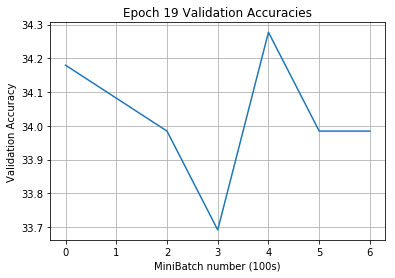

[Epoch 20]
iter:     0, loss min|avg|max: 0.002|0.427| 2.571, val acc: 33.59 %
iter:   100, loss min|avg|max: 0.000|0.629| 7.266, val acc: 33.69 %
iter:   200, loss min|avg|max: 0.001|0.713| 3.936, val acc: 33.69 %
iter:   300, loss min|avg|max: 0.001|0.584| 5.840, val acc: 33.98 %
iter:   400, loss min|avg|max: 0.000|0.802| 4.816, val acc: 33.98 %
iter:   500, loss min|avg|max: 0.000|0.776| 3.297, val acc: 34.28 %
iter:   600, loss min|avg|max: 0.000|0.585| 3.537, val acc: 33.79 %


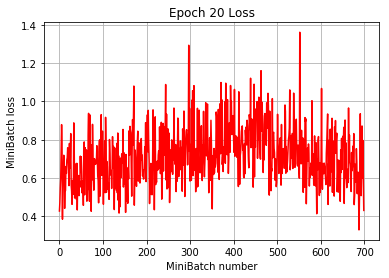

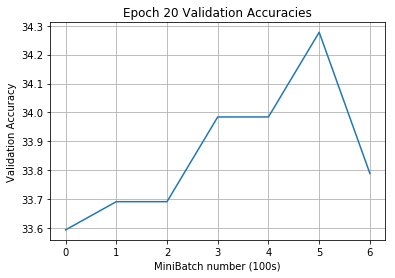

[Epoch 21]
iter:     0, loss min|avg|max: 0.000|0.492| 4.767, val acc: 33.69 %
iter:   100, loss min|avg|max: 0.000|0.798| 5.292, val acc: 33.89 %
iter:   200, loss min|avg|max: 0.000|0.800| 9.004, val acc: 34.67 %
iter:   300, loss min|avg|max: 0.002|0.724| 6.081, val acc: 33.89 %
iter:   400, loss min|avg|max: 0.000|0.751| 4.569, val acc: 34.47 %
iter:   500, loss min|avg|max: 0.000|0.635| 3.438, val acc: 34.08 %
iter:   600, loss min|avg|max: 0.001|0.749| 4.978, val acc: 33.98 %


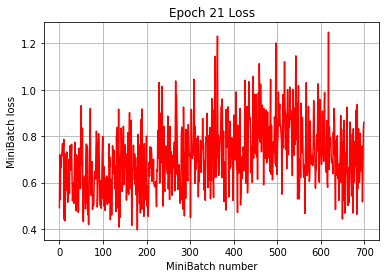

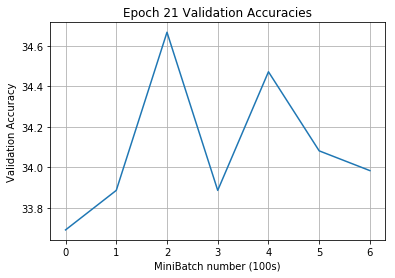

[Epoch 22]
iter:     0, loss min|avg|max: 0.000|0.836| 5.019, val acc: 33.89 %
iter:   100, loss min|avg|max: 0.000|0.801| 4.799, val acc: 34.18 %
iter:   200, loss min|avg|max: 0.002|0.521| 3.622, val acc: 34.38 %
iter:   300, loss min|avg|max: 0.003|0.702| 4.230, val acc: 34.08 %
iter:   400, loss min|avg|max: 0.002|0.553| 4.190, val acc: 33.59 %
iter:   500, loss min|avg|max: 0.000|0.791| 5.064, val acc: 34.08 %
iter:   600, loss min|avg|max: 0.001|0.848| 5.621, val acc: 33.98 %


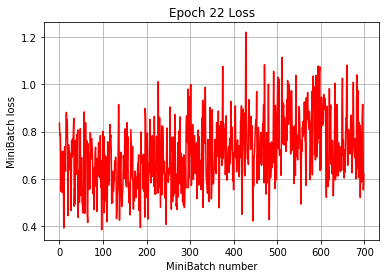

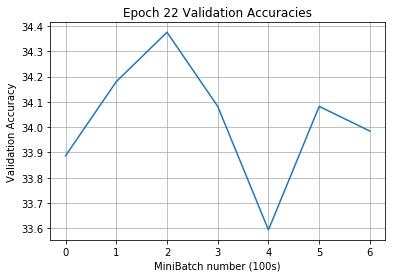

[Epoch 23]
iter:     0, loss min|avg|max: 0.000|0.643| 3.398, val acc: 34.08 %
iter:   100, loss min|avg|max: 0.000|0.530| 2.887, val acc: 34.08 %
iter:   200, loss min|avg|max: 0.000|0.656| 4.375, val acc: 34.28 %
iter:   300, loss min|avg|max: 0.003|0.602| 3.999, val acc: 33.89 %
iter:   400, loss min|avg|max: 0.001|0.800| 3.942, val acc: 33.89 %
iter:   500, loss min|avg|max: 0.000|0.718| 5.640, val acc: 34.38 %
iter:   600, loss min|avg|max: 0.008|0.735| 3.918, val acc: 33.79 %


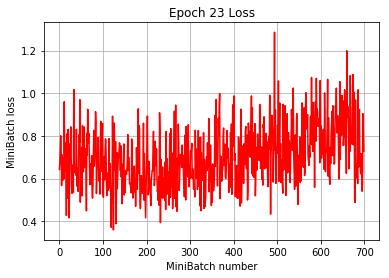

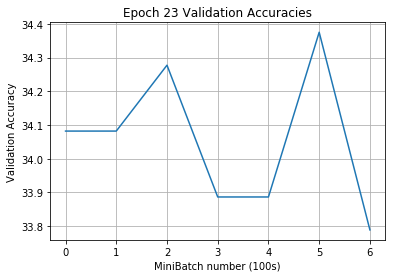

[Epoch 24]
iter:     0, loss min|avg|max: 0.000|0.729| 3.812, val acc: 33.79 %
iter:   100, loss min|avg|max: 0.000|0.605| 4.853, val acc: 34.08 %
iter:   200, loss min|avg|max: 0.000|0.734| 4.170, val acc: 33.40 %
iter:   300, loss min|avg|max: 0.000|0.611| 6.021, val acc: 33.89 %
iter:   400, loss min|avg|max: 0.002|0.580| 3.421, val acc: 34.18 %
iter:   500, loss min|avg|max: 0.000|0.894| 5.869, val acc: 34.38 %
iter:   600, loss min|avg|max: 0.000|0.895| 5.094, val acc: 34.08 %


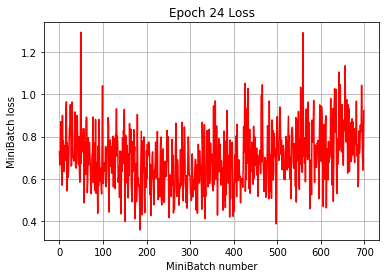

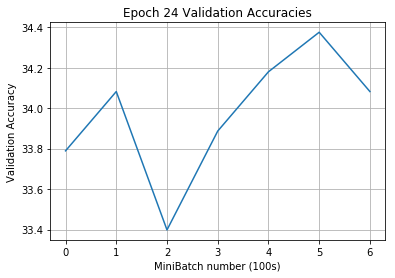

[Epoch 25]
iter:     0, loss min|avg|max: 0.000|0.915| 4.655, val acc: 33.69 %
iter:   100, loss min|avg|max: 0.001|0.846| 5.628, val acc: 34.28 %
iter:   200, loss min|avg|max: 0.000|0.654| 3.035, val acc: 34.08 %
iter:   300, loss min|avg|max: 0.000|0.439| 4.116, val acc: 33.79 %
iter:   400, loss min|avg|max: 0.000|0.466| 4.888, val acc: 34.18 %
iter:   500, loss min|avg|max: 0.002|0.530| 4.259, val acc: 33.98 %
iter:   600, loss min|avg|max: 0.000|0.822| 5.574, val acc: 33.79 %


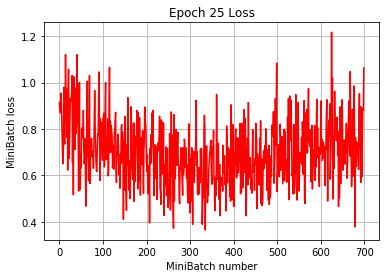

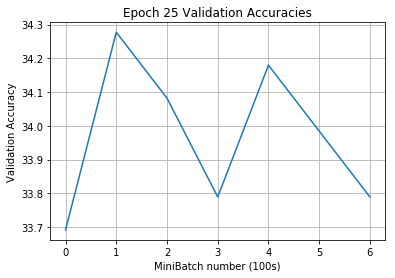

[Epoch 26]
iter:     0, loss min|avg|max: 0.000|0.750| 4.646, val acc: 33.50 %
iter:   100, loss min|avg|max: 0.003|0.884| 6.670, val acc: 33.79 %
iter:   200, loss min|avg|max: 0.003|0.805| 7.239, val acc: 33.89 %
iter:   300, loss min|avg|max: 0.000|0.721| 5.782, val acc: 33.89 %
iter:   400, loss min|avg|max: 0.001|0.640| 4.146, val acc: 34.18 %
iter:   500, loss min|avg|max: 0.002|0.706| 4.304, val acc: 34.08 %
iter:   600, loss min|avg|max: 0.000|0.627| 4.381, val acc: 33.79 %


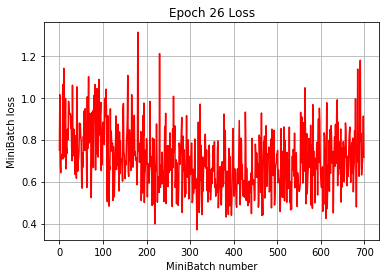

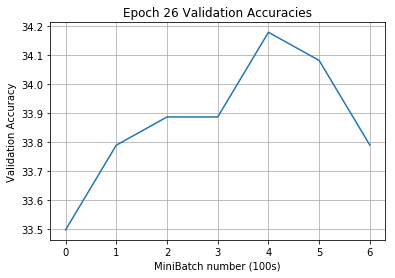

[Epoch 27]
iter:     0, loss min|avg|max: 0.000|1.019| 9.506, val acc: 33.69 %
iter:   100, loss min|avg|max: 0.001|0.837| 4.350, val acc: 34.08 %
iter:   200, loss min|avg|max: 0.000|0.858| 5.390, val acc: 34.57 %
iter:   300, loss min|avg|max: 0.000|0.608| 3.757, val acc: 33.89 %
iter:   400, loss min|avg|max: 0.001|0.630| 4.959, val acc: 34.47 %
iter:   500, loss min|avg|max: 0.000|0.474| 3.001, val acc: 33.98 %
iter:   600, loss min|avg|max: 0.000|0.699| 3.412, val acc: 34.08 %


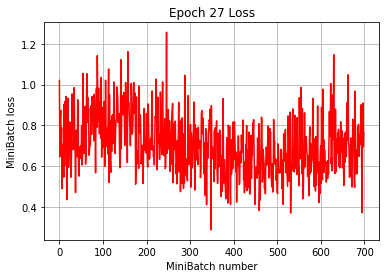

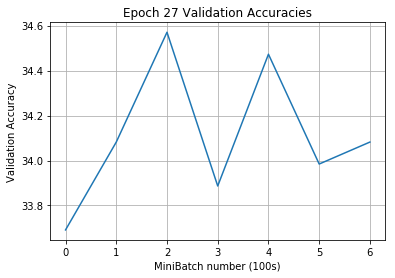

[Epoch 28]
iter:     0, loss min|avg|max: 0.000|0.773| 4.883, val acc: 33.98 %
iter:   100, loss min|avg|max: 0.000|0.859| 4.226, val acc: 34.08 %
iter:   200, loss min|avg|max: 0.004|0.874| 3.004, val acc: 34.18 %
iter:   300, loss min|avg|max: 0.001|0.628| 3.157, val acc: 34.18 %
iter:   400, loss min|avg|max: 0.002|0.515| 3.844, val acc: 33.79 %
iter:   500, loss min|avg|max: 0.001|0.486| 2.684, val acc: 33.98 %
iter:   600, loss min|avg|max: 0.000|0.590| 4.320, val acc: 34.08 %


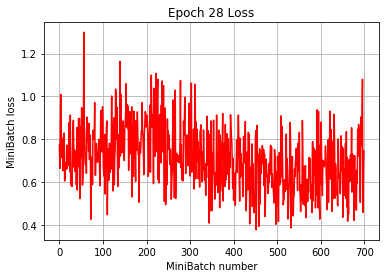

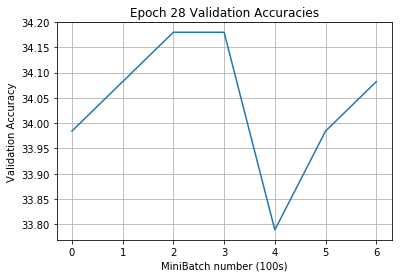

[Epoch 29]
iter:     0, loss min|avg|max: 0.000|0.665| 3.640, val acc: 34.08 %
iter:   100, loss min|avg|max: 0.000|0.755| 3.549, val acc: 34.18 %
iter:   200, loss min|avg|max: 0.000|0.711| 3.809, val acc: 34.08 %
iter:   300, loss min|avg|max: 0.002|0.771| 5.431, val acc: 33.79 %
iter:   400, loss min|avg|max: 0.001|0.652| 4.839, val acc: 33.98 %
iter:   500, loss min|avg|max: 0.000|0.675| 6.718, val acc: 34.18 %
iter:   600, loss min|avg|max: 0.000|0.690| 4.998, val acc: 34.08 %


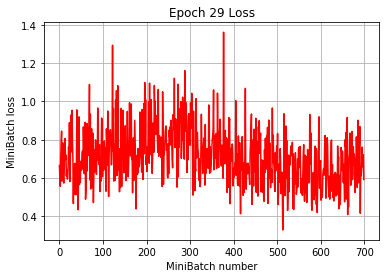

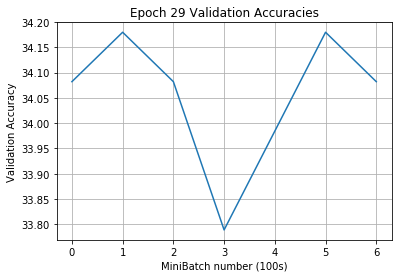

[Epoch 30]
iter:     0, loss min|avg|max: 0.000|0.708| 5.006, val acc: 33.69 %
iter:   100, loss min|avg|max: 0.001|0.677| 3.468, val acc: 33.79 %
iter:   200, loss min|avg|max: 0.000|0.747| 6.216, val acc: 33.50 %
iter:   300, loss min|avg|max: 0.000|0.912| 5.494, val acc: 34.28 %
iter:   400, loss min|avg|max: 0.000|0.630| 6.545, val acc: 34.28 %
iter:   500, loss min|avg|max: 0.000|0.832| 5.560, val acc: 33.89 %
iter:   600, loss min|avg|max: 0.001|0.740| 3.818, val acc: 34.08 %


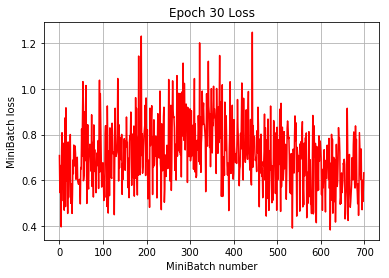

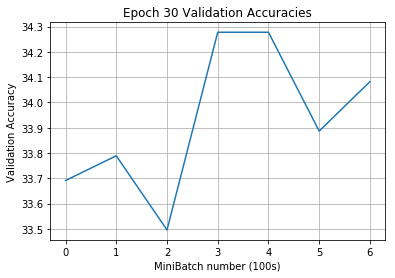

Execution Time: 5590976 ms


In [15]:
cnn1_model = CNN1(NUM_CLASSES)
train(cnn1_model, num_epochs = 30)

In [17]:
test_acc1 = get_accuracy(cnn1_model, X_test, y_test, X_test_iter, y_test_iter)
print ("CNN1 - Test Accuracy: {:.2f} %".format(test_acc1), end="\n\n")

cnn1_model.summary()

CNN1 - Test Accuracy: 34.32 %

Model: "cn_n1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1 (Conv2D)               multiple                  1216      
_________________________________________________________________
conv2 (Conv2D)               multiple                  12832     
_________________________________________________________________
flatten (Flatten)            multiple                  0         
_________________________________________________________________
fc1 (Dense)                  multiple                  16777728  
_________________________________________________________________
fc2 (Dense)                  multiple                  51300     
Total params: 16,843,076
Trainable params: 16,843,076
Non-trainable params: 0
_________________________________________________________________


### Experiment #2 - CNN2

[Epoch 1]
iter:     0, loss min|avg|max: 3.848|4.707| 5.591, val acc: 1.07 %
iter:   100, loss min|avg|max: 0.285|3.510| 6.427, val acc: 12.60 %
iter:   200, loss min|avg|max: 0.787|3.796|10.708, val acc: 15.92 %
iter:   300, loss min|avg|max: 0.337|3.411| 7.918, val acc: 21.88 %
iter:   400, loss min|avg|max: 0.088|3.375|11.951, val acc: 22.95 %
iter:   500, loss min|avg|max: 0.172|3.268| 7.608, val acc: 26.07 %
iter:   600, loss min|avg|max: 0.191|2.915| 7.105, val acc: 27.25 %


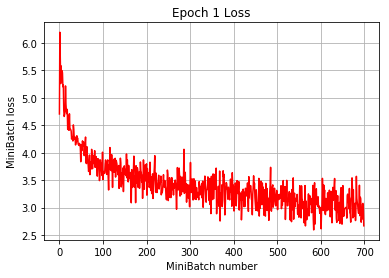

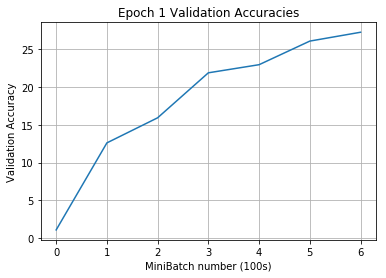

[Epoch 2]
iter:     0, loss min|avg|max: 0.005|2.795| 8.281, val acc: 28.32 %
iter:   100, loss min|avg|max: 0.010|2.481| 6.379, val acc: 28.32 %
iter:   200, loss min|avg|max: 0.020|1.919| 5.922, val acc: 28.71 %
iter:   300, loss min|avg|max: 0.021|1.948| 5.273, val acc: 30.18 %
iter:   400, loss min|avg|max: 0.152|2.385|10.047, val acc: 31.15 %
iter:   500, loss min|avg|max: 0.055|1.936| 7.615, val acc: 31.45 %
iter:   600, loss min|avg|max: 0.054|2.334| 6.700, val acc: 30.86 %


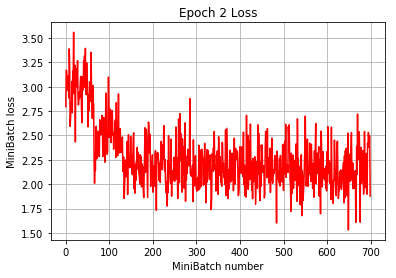

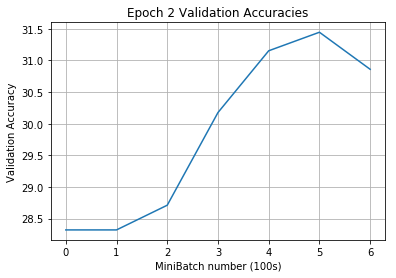

[Epoch 3]
iter:     0, loss min|avg|max: 0.160|2.181| 7.636, val acc: 31.25 %
iter:   100, loss min|avg|max: 0.092|2.214| 5.543, val acc: 33.50 %
iter:   200, loss min|avg|max: 0.000|1.242| 5.447, val acc: 33.20 %
iter:   300, loss min|avg|max: 0.002|1.258| 4.375, val acc: 33.79 %
iter:   400, loss min|avg|max: 0.000|0.954| 4.536, val acc: 32.42 %
iter:   500, loss min|avg|max: 0.015|1.397| 7.008, val acc: 31.93 %
iter:   600, loss min|avg|max: 0.001|1.508| 5.311, val acc: 34.28 %


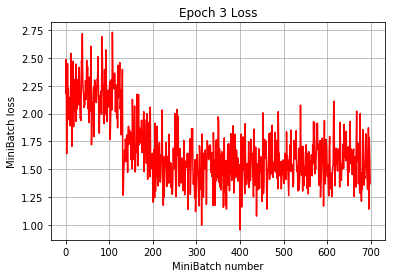

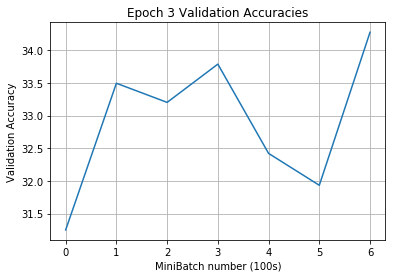

[Epoch 4]
iter:     0, loss min|avg|max: 0.003|1.571| 5.048, val acc: 33.20 %
iter:   100, loss min|avg|max: 0.000|1.326| 5.872, val acc: 34.57 %
iter:   200, loss min|avg|max: 0.001|1.151| 5.677, val acc: 33.79 %
iter:   300, loss min|avg|max: 0.000|1.076| 4.593, val acc: 34.28 %
iter:   400, loss min|avg|max: 0.002|1.160| 5.422, val acc: 33.01 %
iter:   500, loss min|avg|max: 0.001|1.190| 6.830, val acc: 32.71 %
iter:   600, loss min|avg|max: 0.002|1.218| 4.603, val acc: 34.08 %


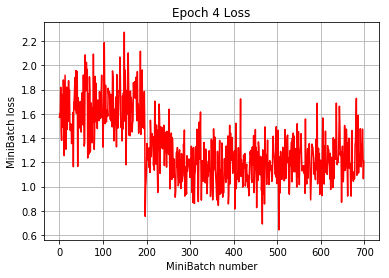

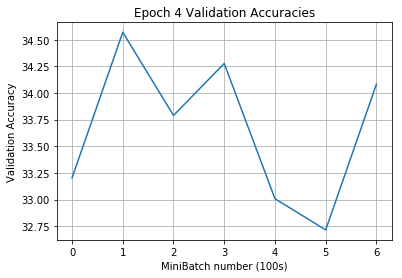

[Epoch 5]
iter:     0, loss min|avg|max: 0.000|1.236| 5.283, val acc: 33.89 %
iter:   100, loss min|avg|max: 0.022|1.399|13.745, val acc: 33.59 %
iter:   200, loss min|avg|max: 0.000|1.413| 5.457, val acc: 35.35 %
iter:   300, loss min|avg|max: 0.004|1.284| 7.019, val acc: 33.89 %
iter:   400, loss min|avg|max: 0.000|0.942| 5.408, val acc: 33.69 %
iter:   500, loss min|avg|max: 0.000|0.733| 4.849, val acc: 33.89 %
iter:   600, loss min|avg|max: 0.000|1.106| 6.459, val acc: 33.20 %


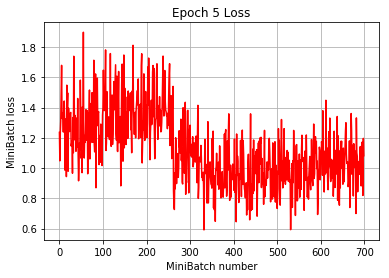

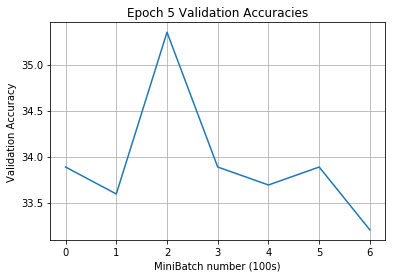

[Epoch 6]
iter:     0, loss min|avg|max: 0.004|1.272| 5.644, val acc: 33.89 %
iter:   100, loss min|avg|max: 0.010|1.137| 4.483, val acc: 34.67 %
iter:   200, loss min|avg|max: 0.001|1.097| 6.466, val acc: 33.40 %
iter:   300, loss min|avg|max: 0.000|1.221| 6.032, val acc: 34.77 %
iter:   400, loss min|avg|max: 0.000|0.915| 5.826, val acc: 33.69 %
iter:   500, loss min|avg|max: 0.000|0.932| 5.018, val acc: 34.47 %
iter:   600, loss min|avg|max: 0.000|0.933| 3.913, val acc: 34.57 %


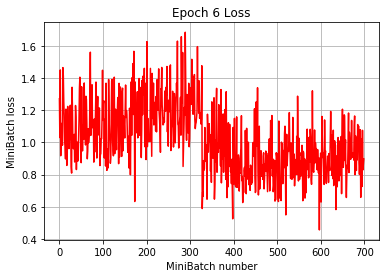

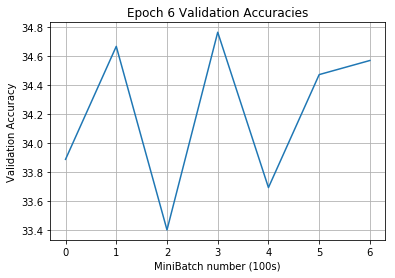

[Epoch 7]
iter:     0, loss min|avg|max: 0.005|0.866| 3.940, val acc: 33.20 %
iter:   100, loss min|avg|max: 0.014|0.867| 4.463, val acc: 34.18 %
iter:   200, loss min|avg|max: 0.001|1.248| 7.329, val acc: 34.67 %
iter:   300, loss min|avg|max: 0.003|1.459| 7.335, val acc: 34.67 %
iter:   400, loss min|avg|max: 0.003|0.846| 4.818, val acc: 34.57 %
iter:   500, loss min|avg|max: 0.000|0.892| 3.480, val acc: 34.18 %
iter:   600, loss min|avg|max: 0.002|0.587| 3.493, val acc: 33.50 %


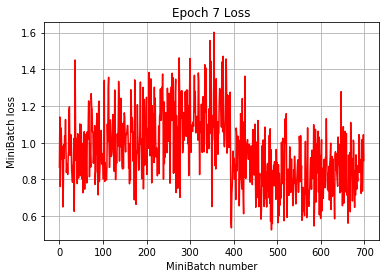

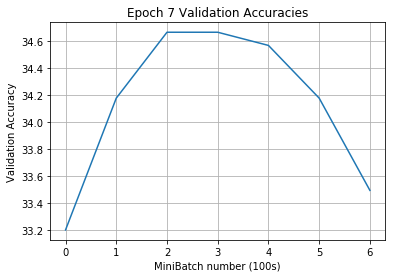

[Epoch 8]
iter:     0, loss min|avg|max: 0.002|0.724| 4.522, val acc: 34.57 %
iter:   100, loss min|avg|max: 0.009|0.697| 2.476, val acc: 33.59 %
iter:   200, loss min|avg|max: 0.001|1.018| 6.549, val acc: 34.96 %
iter:   300, loss min|avg|max: 0.010|1.227| 5.892, val acc: 35.06 %
iter:   400, loss min|avg|max: 0.002|1.356| 6.240, val acc: 34.57 %
iter:   500, loss min|avg|max: 0.002|0.960| 4.681, val acc: 33.98 %
iter:   600, loss min|avg|max: 0.000|0.773| 3.778, val acc: 33.59 %


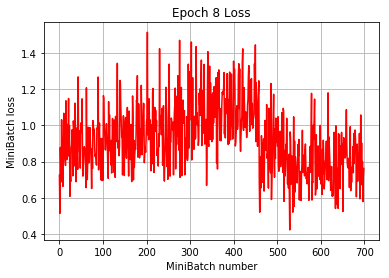

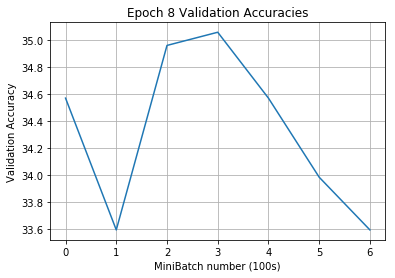

[Epoch 9]
iter:     0, loss min|avg|max: 0.015|1.095| 4.733, val acc: 34.08 %
iter:   100, loss min|avg|max: 0.003|0.934| 4.506, val acc: 35.06 %
iter:   200, loss min|avg|max: 0.002|0.795| 5.951, val acc: 33.98 %
iter:   300, loss min|avg|max: 0.004|0.818| 5.824, val acc: 35.06 %
iter:   400, loss min|avg|max: 0.002|0.951| 6.012, val acc: 34.96 %
iter:   500, loss min|avg|max: 0.003|1.177| 7.099, val acc: 34.47 %
iter:   600, loss min|avg|max: 0.000|0.667| 4.444, val acc: 33.79 %


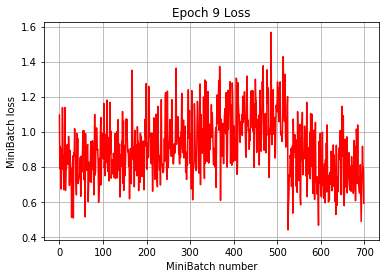

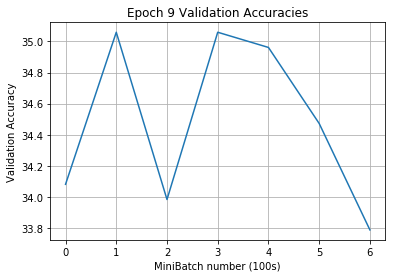

[Epoch 10]
iter:     0, loss min|avg|max: 0.000|0.703| 4.516, val acc: 34.57 %
iter:   100, loss min|avg|max: 0.004|1.076| 5.917, val acc: 34.96 %
iter:   200, loss min|avg|max: 0.000|0.889| 4.989, val acc: 34.96 %
iter:   300, loss min|avg|max: 0.001|1.124| 8.546, val acc: 33.89 %
iter:   400, loss min|avg|max: 0.006|0.986| 7.674, val acc: 34.57 %
iter:   500, loss min|avg|max: 0.005|0.937| 3.972, val acc: 34.57 %
iter:   600, loss min|avg|max: 0.002|0.896| 3.765, val acc: 34.47 %


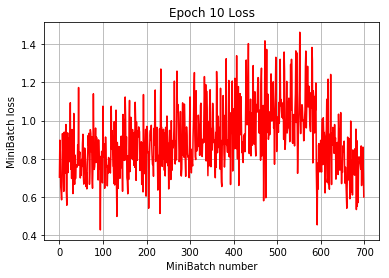

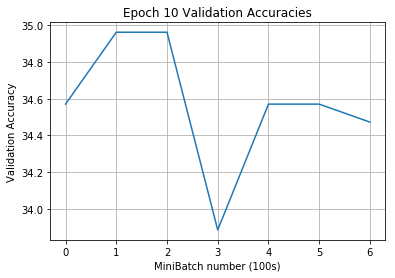

[Epoch 11]
iter:     0, loss min|avg|max: 0.000|0.737| 4.383, val acc: 34.57 %
iter:   100, loss min|avg|max: 0.005|0.636| 6.269, val acc: 34.57 %
iter:   200, loss min|avg|max: 0.007|0.711| 3.814, val acc: 34.38 %
iter:   300, loss min|avg|max: 0.010|0.855| 6.878, val acc: 34.57 %
iter:   400, loss min|avg|max: 0.001|0.852| 4.362, val acc: 34.86 %
iter:   500, loss min|avg|max: 0.000|1.125| 6.013, val acc: 34.67 %
iter:   600, loss min|avg|max: 0.001|1.072| 6.384, val acc: 34.57 %


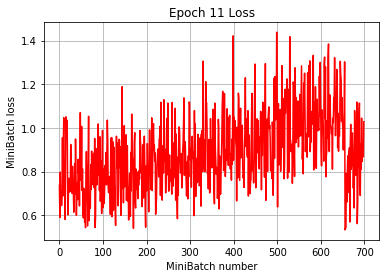

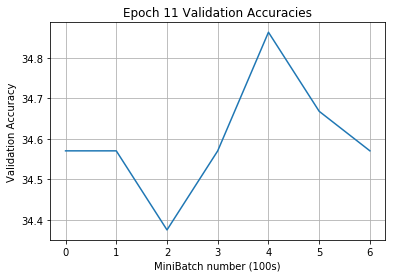

[Epoch 12]
iter:     0, loss min|avg|max: 0.000|0.745| 8.642, val acc: 34.57 %
iter:   100, loss min|avg|max: 0.001|0.717| 5.182, val acc: 34.18 %
iter:   200, loss min|avg|max: 0.004|0.743| 4.641, val acc: 34.28 %
iter:   300, loss min|avg|max: 0.000|0.857| 6.136, val acc: 34.86 %
iter:   400, loss min|avg|max: 0.000|0.880| 4.024, val acc: 35.06 %
iter:   500, loss min|avg|max: 0.000|0.639| 2.607, val acc: 34.86 %
iter:   600, loss min|avg|max: 0.004|0.714| 8.292, val acc: 34.28 %


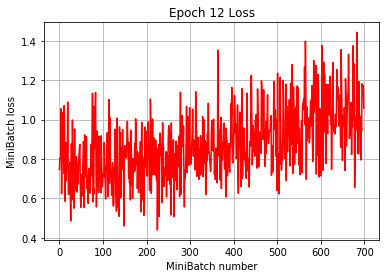

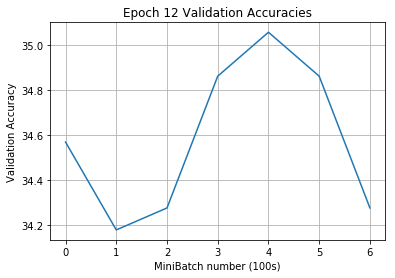

[Epoch 13]
iter:     0, loss min|avg|max: 0.004|1.063| 4.049, val acc: 34.86 %
iter:   100, loss min|avg|max: 0.002|0.839| 5.763, val acc: 34.47 %
iter:   200, loss min|avg|max: 0.002|0.565| 3.342, val acc: 34.38 %
iter:   300, loss min|avg|max: 0.003|0.818| 6.716, val acc: 34.77 %
iter:   400, loss min|avg|max: 0.002|0.825| 5.834, val acc: 34.28 %
iter:   500, loss min|avg|max: 0.001|0.760| 4.209, val acc: 34.47 %
iter:   600, loss min|avg|max: 0.002|1.181| 4.842, val acc: 34.18 %


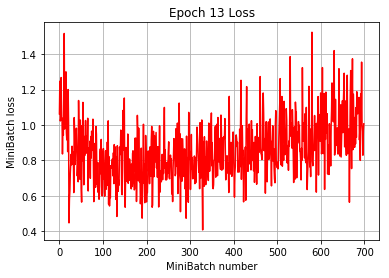

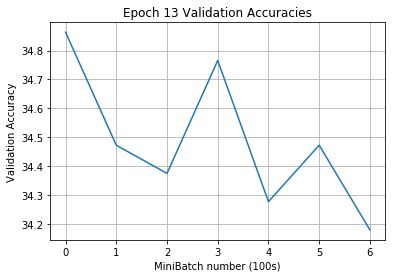

[Epoch 14]
iter:     0, loss min|avg|max: 0.021|0.889| 5.020, val acc: 34.47 %
iter:   100, loss min|avg|max: 0.001|0.992| 4.495, val acc: 34.57 %
iter:   200, loss min|avg|max: 0.000|0.668| 4.672, val acc: 34.57 %
iter:   300, loss min|avg|max: 0.000|0.668| 3.097, val acc: 34.77 %
iter:   400, loss min|avg|max: 0.000|0.847| 7.846, val acc: 34.47 %
iter:   500, loss min|avg|max: 0.001|0.659| 4.995, val acc: 34.57 %
iter:   600, loss min|avg|max: 0.000|1.168| 7.697, val acc: 34.38 %


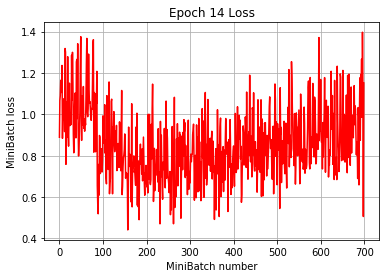

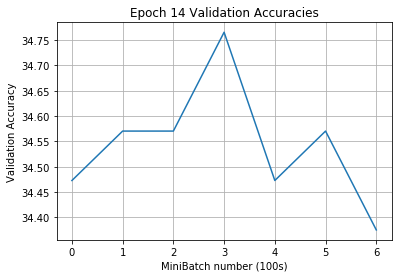

[Epoch 15]
iter:     0, loss min|avg|max: 0.000|1.007| 4.397, val acc: 34.67 %
iter:   100, loss min|avg|max: 0.019|0.972| 6.022, val acc: 34.96 %
iter:   200, loss min|avg|max: 0.000|0.752| 4.365, val acc: 34.47 %
iter:   300, loss min|avg|max: 0.000|0.724| 3.286, val acc: 34.96 %
iter:   400, loss min|avg|max: 0.002|0.796| 5.113, val acc: 34.57 %
iter:   500, loss min|avg|max: 0.004|0.832| 5.816, val acc: 34.57 %
iter:   600, loss min|avg|max: 0.006|1.066| 4.645, val acc: 34.67 %


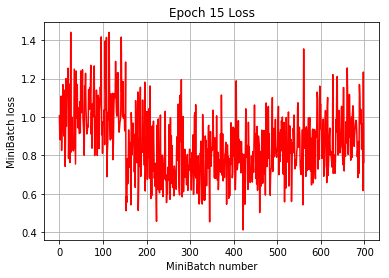

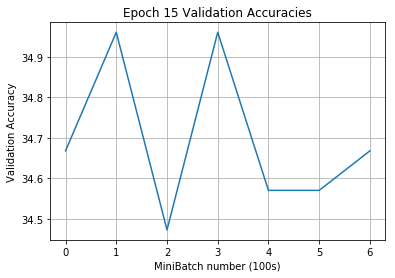

[Epoch 16]
iter:     0, loss min|avg|max: 0.001|0.736| 4.771, val acc: 34.96 %
iter:   100, loss min|avg|max: 0.009|1.352| 5.027, val acc: 34.86 %
iter:   200, loss min|avg|max: 0.021|0.978| 5.130, val acc: 34.96 %
iter:   300, loss min|avg|max: 0.000|0.791|10.686, val acc: 34.18 %
iter:   400, loss min|avg|max: 0.004|0.701| 4.889, val acc: 34.38 %
iter:   500, loss min|avg|max: 0.003|0.936| 6.402, val acc: 34.67 %
iter:   600, loss min|avg|max: 0.001|0.818| 5.123, val acc: 34.77 %


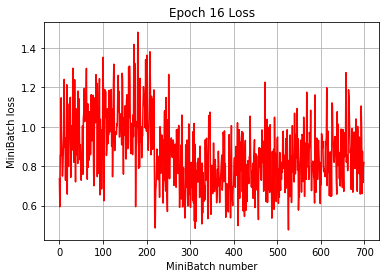

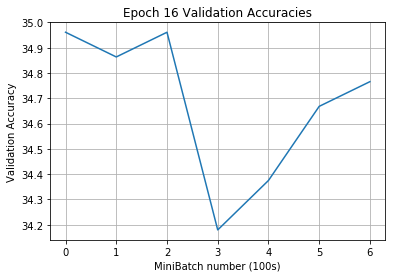

[Epoch 17]
iter:     0, loss min|avg|max: 0.001|0.823| 5.229, val acc: 34.47 %
iter:   100, loss min|avg|max: 0.002|0.901| 5.398, val acc: 34.67 %
iter:   200, loss min|avg|max: 0.006|1.133| 5.534, val acc: 34.28 %
iter:   300, loss min|avg|max: 0.001|0.826| 5.460, val acc: 34.77 %
iter:   400, loss min|avg|max: 0.001|0.759| 6.835, val acc: 34.67 %
iter:   500, loss min|avg|max: 0.000|0.717| 6.089, val acc: 34.67 %
iter:   600, loss min|avg|max: 0.000|0.754| 6.040, val acc: 34.77 %


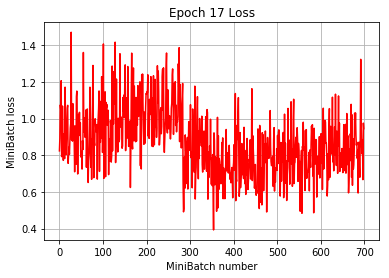

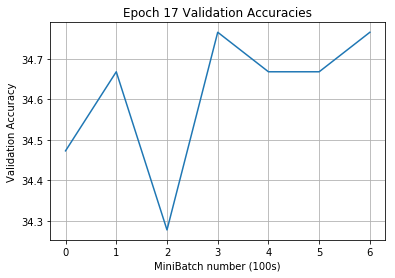

[Epoch 18]
iter:     0, loss min|avg|max: 0.001|0.753| 5.285, val acc: 34.38 %
iter:   100, loss min|avg|max: 0.004|0.835| 4.029, val acc: 34.18 %
iter:   200, loss min|avg|max: 0.014|1.026| 5.415, val acc: 34.86 %
iter:   300, loss min|avg|max: 0.018|1.019| 5.858, val acc: 34.67 %
iter:   400, loss min|avg|max: 0.002|0.962| 6.983, val acc: 34.96 %
iter:   500, loss min|avg|max: 0.000|0.636| 4.039, val acc: 34.77 %
iter:   600, loss min|avg|max: 0.016|0.685| 3.757, val acc: 34.57 %


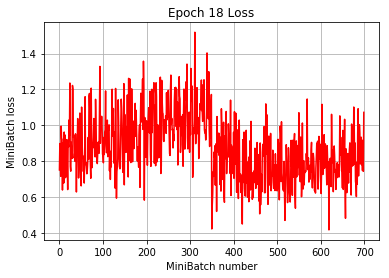

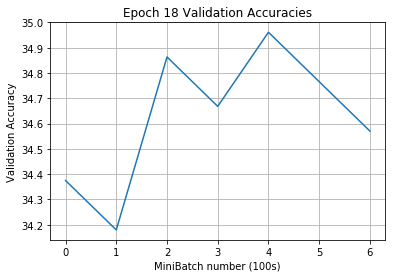

[Epoch 19]
iter:     0, loss min|avg|max: 0.002|0.982| 6.227, val acc: 34.67 %
iter:   100, loss min|avg|max: 0.002|0.768| 3.866, val acc: 34.38 %
iter:   200, loss min|avg|max: 0.000|0.861| 5.150, val acc: 34.77 %
iter:   300, loss min|avg|max: 0.002|1.067| 6.524, val acc: 34.47 %
iter:   400, loss min|avg|max: 0.002|0.960| 5.506, val acc: 34.38 %
iter:   500, loss min|avg|max: 0.000|0.730| 4.853, val acc: 34.28 %
iter:   600, loss min|avg|max: 0.000|0.729| 3.379, val acc: 34.18 %


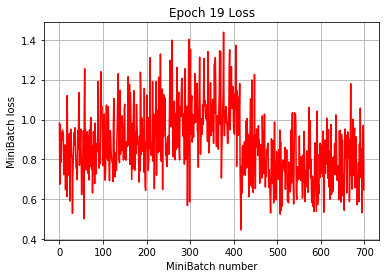

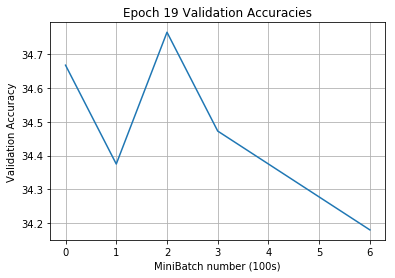

[Epoch 20]
iter:     0, loss min|avg|max: 0.000|0.626| 3.723, val acc: 34.47 %
iter:   100, loss min|avg|max: 0.001|0.996| 6.554, val acc: 34.77 %
iter:   200, loss min|avg|max: 0.001|1.156| 7.745, val acc: 34.57 %
iter:   300, loss min|avg|max: 0.002|1.015| 4.657, val acc: 34.86 %
iter:   400, loss min|avg|max: 0.003|1.299| 8.496, val acc: 34.47 %
iter:   500, loss min|avg|max: 0.000|0.719| 4.522, val acc: 34.57 %
iter:   600, loss min|avg|max: 0.003|0.896| 8.187, val acc: 34.38 %


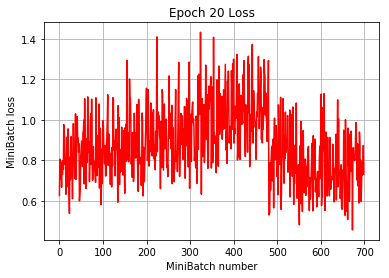

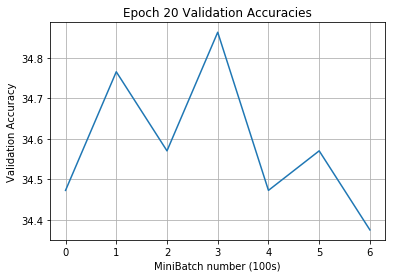

[Epoch 21]
iter:     0, loss min|avg|max: 0.000|0.999| 5.401, val acc: 34.67 %
iter:   100, loss min|avg|max: 0.008|0.912| 4.475, val acc: 34.77 %
iter:   200, loss min|avg|max: 0.000|0.839| 6.169, val acc: 34.67 %
iter:   300, loss min|avg|max: 0.010|0.825| 6.184, val acc: 34.86 %
iter:   400, loss min|avg|max: 0.000|0.901| 6.580, val acc: 34.57 %
iter:   500, loss min|avg|max: 0.004|0.993| 4.683, val acc: 34.47 %
iter:   600, loss min|avg|max: 0.000|0.852| 4.113, val acc: 34.57 %


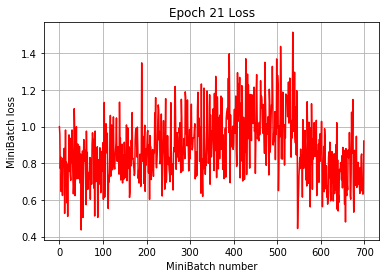

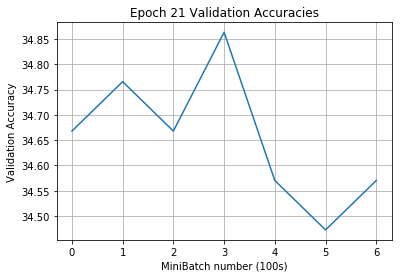

[Epoch 22]
iter:     0, loss min|avg|max: 0.001|0.736| 6.844, val acc: 35.35 %
iter:   100, loss min|avg|max: 0.001|1.121| 6.232, val acc: 34.57 %
iter:   200, loss min|avg|max: 0.000|0.821| 5.356, val acc: 34.67 %
iter:   300, loss min|avg|max: 0.001|1.016| 4.284, val acc: 34.28 %
iter:   400, loss min|avg|max: 0.000|0.762| 6.468, val acc: 34.47 %
iter:   500, loss min|avg|max: 0.000|1.172| 7.199, val acc: 34.57 %
iter:   600, loss min|avg|max: 0.000|1.022| 5.578, val acc: 34.86 %


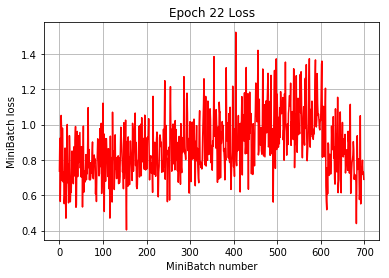

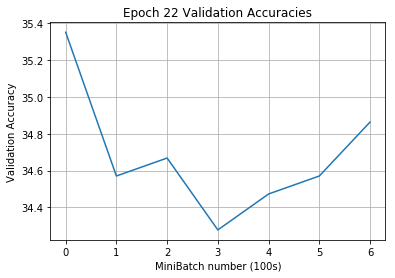

[Epoch 23]
iter:     0, loss min|avg|max: 0.000|0.655| 4.934, val acc: 34.28 %
iter:   100, loss min|avg|max: 0.005|0.768| 5.779, val acc: 34.77 %
iter:   200, loss min|avg|max: 0.010|0.672| 3.261, val acc: 34.28 %
iter:   300, loss min|avg|max: 0.001|0.876| 4.933, val acc: 34.86 %
iter:   400, loss min|avg|max: 0.006|0.735| 3.554, val acc: 34.67 %
iter:   500, loss min|avg|max: 0.003|0.886| 5.808, val acc: 34.57 %
iter:   600, loss min|avg|max: 0.001|0.837| 4.805, val acc: 34.77 %


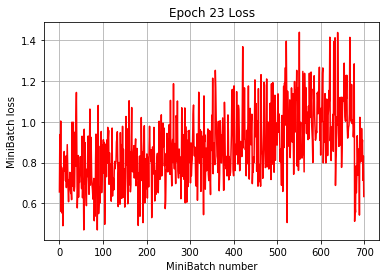

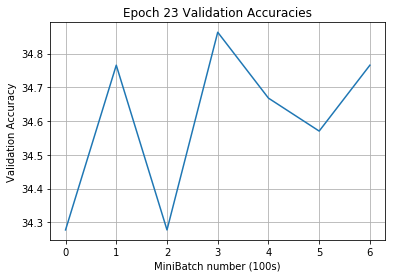

[Epoch 24]
iter:     0, loss min|avg|max: 0.001|1.084| 6.257, val acc: 34.28 %
iter:   100, loss min|avg|max: 0.004|0.614| 4.404, val acc: 34.38 %
iter:   200, loss min|avg|max: 0.000|0.912| 5.417, val acc: 34.96 %
iter:   300, loss min|avg|max: 0.000|1.072| 5.119, val acc: 34.67 %
iter:   400, loss min|avg|max: 0.000|0.996| 9.914, val acc: 34.86 %
iter:   500, loss min|avg|max: 0.019|1.034| 6.837, val acc: 34.86 %
iter:   600, loss min|avg|max: 0.002|0.928| 6.488, val acc: 34.67 %


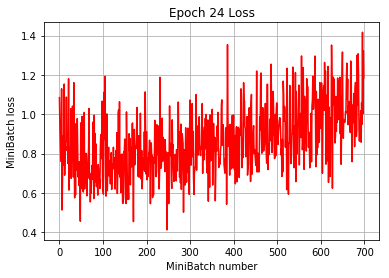

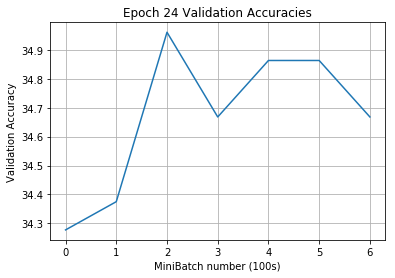

[Epoch 25]
iter:     0, loss min|avg|max: 0.006|0.594| 3.307, val acc: 34.47 %
iter:   100, loss min|avg|max: 0.000|0.814| 8.439, val acc: 34.28 %
iter:   200, loss min|avg|max: 0.001|0.723| 3.804, val acc: 34.86 %
iter:   300, loss min|avg|max: 0.001|0.618| 4.892, val acc: 34.47 %
iter:   400, loss min|avg|max: 0.000|0.956| 5.377, val acc: 34.28 %
iter:   500, loss min|avg|max: 0.000|0.940| 4.414, val acc: 34.18 %
iter:   600, loss min|avg|max: 0.009|0.978| 4.959, val acc: 34.38 %


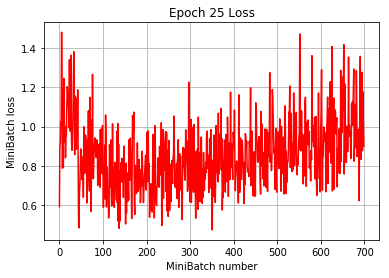

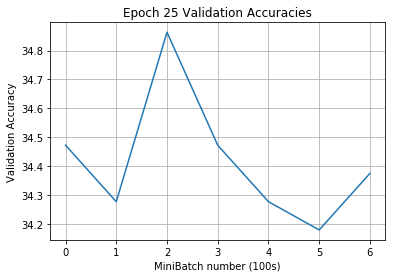

[Epoch 26]
iter:     0, loss min|avg|max: 0.000|0.873| 4.726, val acc: 34.38 %
iter:   100, loss min|avg|max: 0.001|1.386| 6.279, val acc: 34.77 %
iter:   200, loss min|avg|max: 0.000|0.894| 8.394, val acc: 34.67 %
iter:   300, loss min|avg|max: 0.001|0.863| 5.975, val acc: 34.86 %
iter:   400, loss min|avg|max: 0.000|0.828| 4.791, val acc: 34.47 %
iter:   500, loss min|avg|max: 0.000|0.725| 4.301, val acc: 34.38 %
iter:   600, loss min|avg|max: 0.000|0.765| 3.138, val acc: 34.38 %


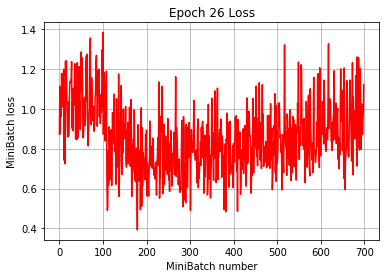

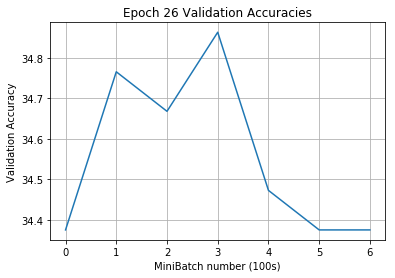

[Epoch 27]
iter:     0, loss min|avg|max: 0.001|0.940| 4.740, val acc: 34.96 %
iter:   100, loss min|avg|max: 0.010|1.271| 8.121, val acc: 34.47 %
iter:   200, loss min|avg|max: 0.004|0.700| 4.387, val acc: 35.06 %
iter:   300, loss min|avg|max: 0.004|0.840| 3.935, val acc: 34.67 %
iter:   400, loss min|avg|max: 0.001|0.700| 5.232, val acc: 34.47 %
iter:   500, loss min|avg|max: 0.001|0.780| 5.784, val acc: 34.47 %
iter:   600, loss min|avg|max: 0.003|0.866| 4.420, val acc: 34.86 %


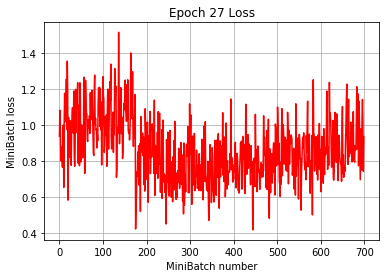

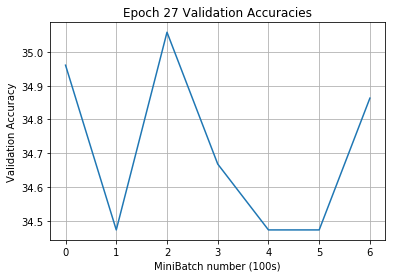

[Epoch 28]
iter:     0, loss min|avg|max: 0.000|0.886| 4.564, val acc: 35.16 %
iter:   100, loss min|avg|max: 0.000|0.852| 4.790, val acc: 34.86 %
iter:   200, loss min|avg|max: 0.002|1.020| 5.026, val acc: 34.08 %
iter:   300, loss min|avg|max: 0.004|0.715| 3.848, val acc: 34.38 %
iter:   400, loss min|avg|max: 0.009|0.769| 3.866, val acc: 34.57 %
iter:   500, loss min|avg|max: 0.001|0.720| 3.447, val acc: 34.77 %
iter:   600, loss min|avg|max: 0.020|0.839| 5.168, val acc: 34.57 %


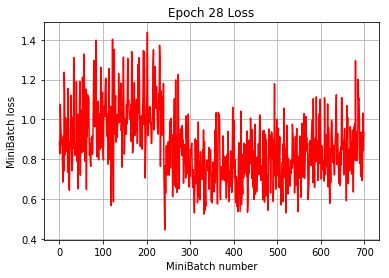

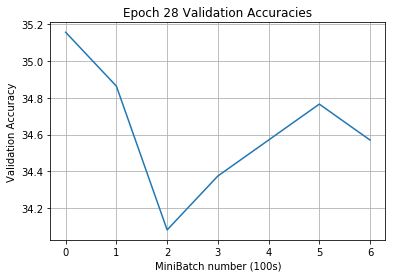

[Epoch 29]
iter:     0, loss min|avg|max: 0.001|0.811| 3.551, val acc: 34.67 %
iter:   100, loss min|avg|max: 0.000|0.852| 5.002, val acc: 34.38 %
iter:   200, loss min|avg|max: 0.002|1.090| 4.623, val acc: 34.57 %
iter:   300, loss min|avg|max: 0.001|1.017| 5.982, val acc: 34.86 %
iter:   400, loss min|avg|max: 0.002|0.715| 4.677, val acc: 34.67 %
iter:   500, loss min|avg|max: 0.000|0.862| 4.107, val acc: 34.47 %
iter:   600, loss min|avg|max: 0.000|0.902| 3.923, val acc: 34.67 %


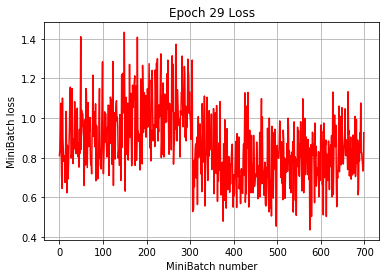

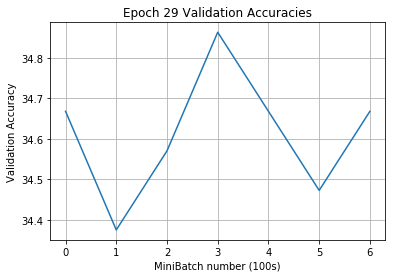

[Epoch 30]
iter:     0, loss min|avg|max: 0.000|0.976| 3.772, val acc: 34.28 %
iter:   100, loss min|avg|max: 0.001|0.993| 6.393, val acc: 34.47 %
iter:   200, loss min|avg|max: 0.004|0.766| 2.978, val acc: 34.86 %
iter:   300, loss min|avg|max: 0.000|0.788| 4.601, val acc: 35.06 %
iter:   400, loss min|avg|max: 0.002|0.640| 4.044, val acc: 34.86 %
iter:   500, loss min|avg|max: 0.000|0.677| 5.106, val acc: 34.28 %
iter:   600, loss min|avg|max: 0.000|0.838| 5.648, val acc: 34.86 %


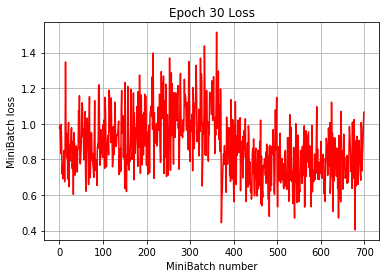

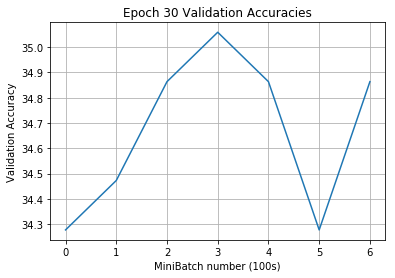

Execution Time: 3900336 ms


In [18]:
cnn2_model = CNN2(NUM_CLASSES)
train(cnn2_model, num_epochs = 30)

In [19]:
test_acc2 = get_accuracy(cnn2_model, X_test, y_test, X_test_iter, y_test_iter)
print ("CNN2 - Test Accuracy: {:.2f} %".format(test_acc2), end="\n\n")

cnn2_model.summary()

CNN2 - Test Accuracy: 33.10 %

Model: "cn_n2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1 (Conv2D)               multiple                  448       
_________________________________________________________________
conv2 (Conv2D)               multiple                  4640      
_________________________________________________________________
flatten_1 (Flatten)          multiple                  0         
_________________________________________________________________
fc1 (Dense)                  multiple                  16777728  
_________________________________________________________________
fc2 (Dense)                  multiple                  51300     
Total params: 16,834,116
Trainable params: 16,834,116
Non-trainable params: 0
_________________________________________________________________


### Experiment #3 - CNN3

[Epoch 1]
iter:     0, loss min|avg|max: 4.131|4.596| 4.920, val acc: 0.68 %
iter:   100, loss min|avg|max: 0.666|4.077| 7.069, val acc: 12.50 %
iter:   200, loss min|avg|max: 0.670|3.917| 9.804, val acc: 17.38 %
iter:   300, loss min|avg|max: 0.008|3.478| 7.363, val acc: 19.24 %
iter:   400, loss min|avg|max: 0.025|3.114| 9.155, val acc: 22.66 %
iter:   500, loss min|avg|max: 0.189|3.158| 7.084, val acc: 25.00 %
iter:   600, loss min|avg|max: 0.092|2.787| 7.323, val acc: 29.98 %


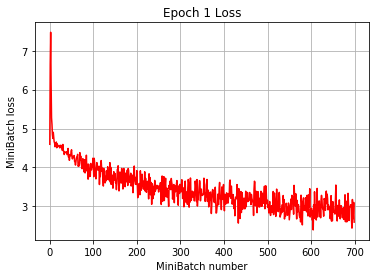

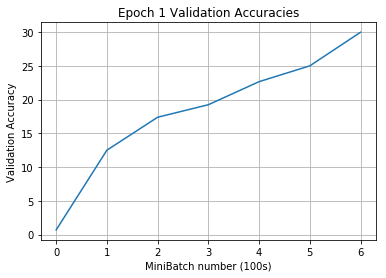

[Epoch 2]
iter:     0, loss min|avg|max: 0.008|3.077| 9.001, val acc: 29.69 %
iter:   100, loss min|avg|max: 0.060|2.633| 7.895, val acc: 33.20 %
iter:   200, loss min|avg|max: 0.001|2.304| 6.073, val acc: 32.03 %
iter:   300, loss min|avg|max: 0.002|1.874| 4.925, val acc: 33.69 %
iter:   400, loss min|avg|max: 0.001|2.243| 8.570, val acc: 33.59 %
iter:   500, loss min|avg|max: 0.007|1.781| 6.937, val acc: 32.62 %
iter:   600, loss min|avg|max: 0.000|1.824| 6.277, val acc: 34.67 %


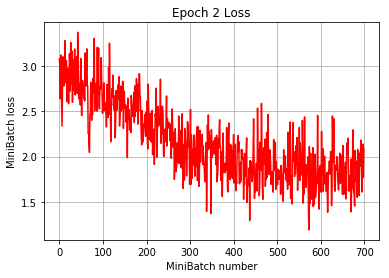

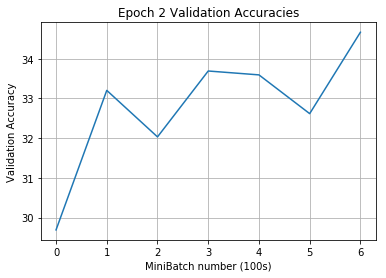

[Epoch 3]
iter:     0, loss min|avg|max: 0.003|1.896| 6.528, val acc: 35.94 %
iter:   100, loss min|avg|max: 0.003|2.081| 6.535, val acc: 34.08 %
iter:   200, loss min|avg|max: 0.004|1.795| 5.242, val acc: 34.77 %
iter:   300, loss min|avg|max: 0.010|1.394| 6.370, val acc: 35.16 %
iter:   400, loss min|avg|max: 0.000|0.862| 4.505, val acc: 36.04 %
iter:   500, loss min|avg|max: 0.001|0.718| 4.317, val acc: 34.57 %
iter:   600, loss min|avg|max: 0.002|0.892| 5.929, val acc: 34.67 %


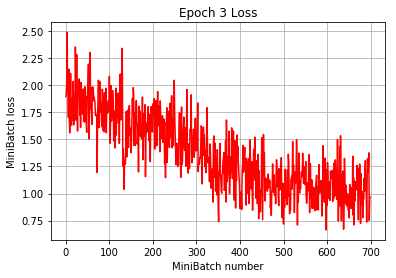

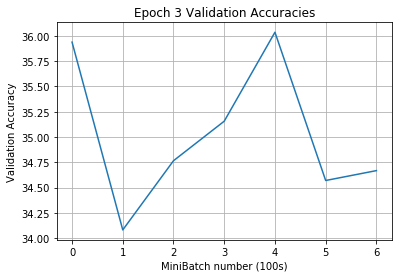

[Epoch 4]
iter:     0, loss min|avg|max: 0.001|1.062| 5.270, val acc: 36.04 %
iter:   100, loss min|avg|max: 0.000|1.071| 6.467, val acc: 35.94 %
iter:   200, loss min|avg|max: 0.000|0.641| 4.580, val acc: 33.40 %
iter:   300, loss min|avg|max: 0.002|0.815| 6.954, val acc: 34.67 %
iter:   400, loss min|avg|max: 0.000|0.634| 5.258, val acc: 35.74 %
iter:   500, loss min|avg|max: 0.001|0.732| 5.638, val acc: 35.74 %
iter:   600, loss min|avg|max: 0.000|0.649| 4.848, val acc: 36.33 %


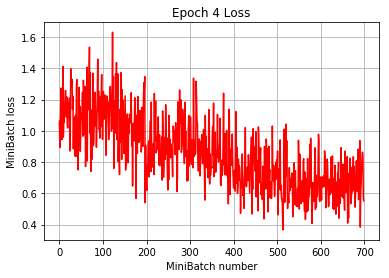

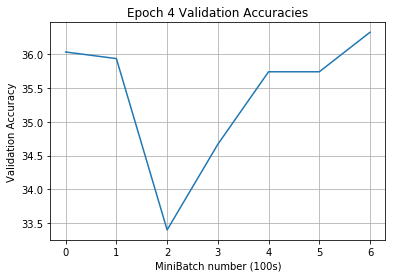

[Epoch 5]
iter:     0, loss min|avg|max: 0.000|0.690| 4.227, val acc: 34.96 %
iter:   100, loss min|avg|max: 0.000|0.682| 5.029, val acc: 34.47 %
iter:   200, loss min|avg|max: 0.000|0.667| 4.953, val acc: 35.35 %
iter:   300, loss min|avg|max: 0.000|0.654| 3.850, val acc: 35.25 %
iter:   400, loss min|avg|max: 0.000|0.429| 4.301, val acc: 35.55 %
iter:   500, loss min|avg|max: 0.000|0.652| 5.008, val acc: 34.28 %
iter:   600, loss min|avg|max: 0.000|0.499| 4.218, val acc: 34.96 %


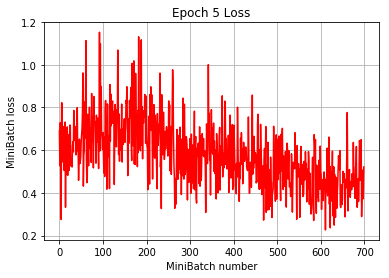

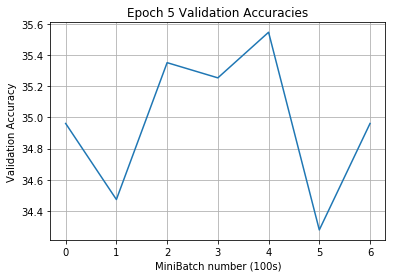

[Epoch 6]
iter:     0, loss min|avg|max: 0.000|0.380| 3.818, val acc: 34.77 %
iter:   100, loss min|avg|max: 0.000|0.551| 4.687, val acc: 35.25 %
iter:   200, loss min|avg|max: 0.000|0.819| 6.803, val acc: 35.64 %
iter:   300, loss min|avg|max: 0.001|0.402| 3.988, val acc: 35.84 %
iter:   400, loss min|avg|max: 0.000|0.463| 3.808, val acc: 36.13 %
iter:   500, loss min|avg|max: 0.000|0.704| 6.103, val acc: 35.55 %
iter:   600, loss min|avg|max: 0.000|0.353| 2.910, val acc: 34.47 %


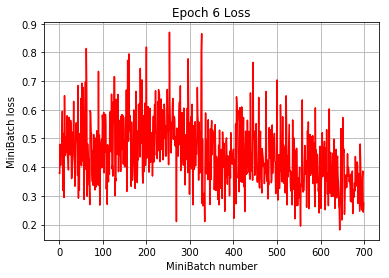

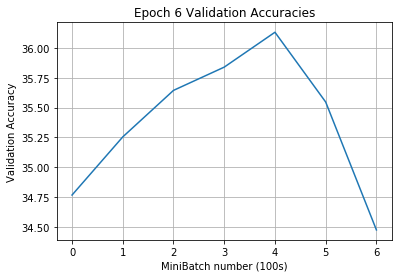

[Epoch 7]
iter:     0, loss min|avg|max: 0.000|0.287| 2.494, val acc: 34.77 %
iter:   100, loss min|avg|max: 0.001|0.305| 1.807, val acc: 35.84 %
iter:   200, loss min|avg|max: 0.000|0.402| 2.746, val acc: 34.57 %
iter:   300, loss min|avg|max: 0.000|0.590| 4.172, val acc: 35.16 %
iter:   400, loss min|avg|max: 0.000|0.337| 5.572, val acc: 35.64 %
iter:   500, loss min|avg|max: 0.000|0.215| 1.388, val acc: 35.35 %
iter:   600, loss min|avg|max: 0.000|0.250| 1.994, val acc: 34.86 %


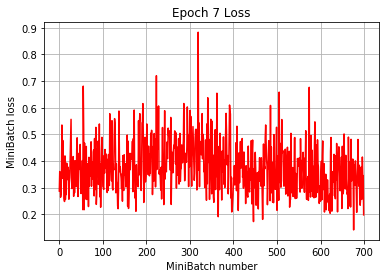

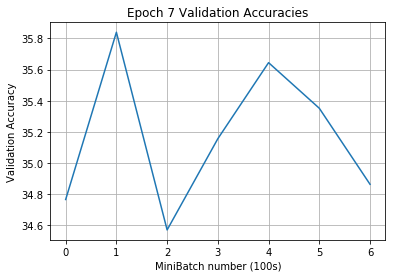

[Epoch 8]
iter:     0, loss min|avg|max: 0.002|0.385| 3.459, val acc: 35.45 %
iter:   100, loss min|avg|max: 0.004|0.292| 2.715, val acc: 35.94 %
iter:   200, loss min|avg|max: 0.000|0.211| 1.856, val acc: 35.45 %
iter:   300, loss min|avg|max: 0.000|0.272| 2.865, val acc: 35.45 %
iter:   400, loss min|avg|max: 0.000|0.188| 1.579, val acc: 35.74 %
iter:   500, loss min|avg|max: 0.000|0.266| 1.929, val acc: 35.55 %
iter:   600, loss min|avg|max: 0.000|0.285| 3.066, val acc: 35.64 %


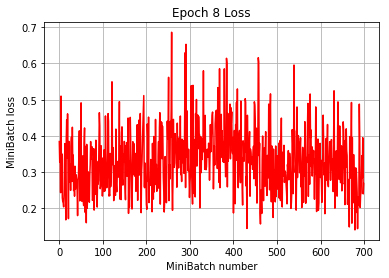

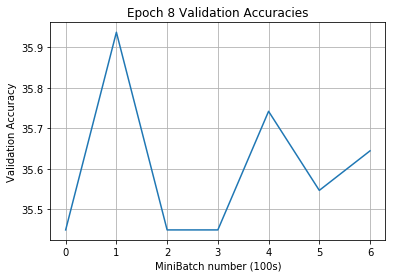

[Epoch 9]
iter:     0, loss min|avg|max: 0.000|0.299| 3.040, val acc: 35.35 %
iter:   100, loss min|avg|max: 0.000|0.244| 3.913, val acc: 35.06 %
iter:   200, loss min|avg|max: 0.000|0.260| 2.294, val acc: 35.84 %
iter:   300, loss min|avg|max: 0.000|0.264| 2.914, val acc: 35.06 %
iter:   400, loss min|avg|max: 0.000|0.274| 3.724, val acc: 35.35 %
iter:   500, loss min|avg|max: 0.000|0.436| 5.017, val acc: 35.94 %
iter:   600, loss min|avg|max: 0.000|0.348| 3.076, val acc: 36.04 %


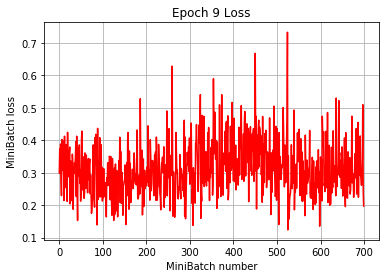

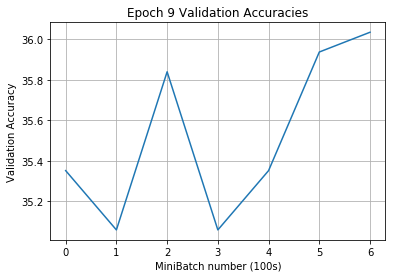

[Epoch 10]
iter:     0, loss min|avg|max: 0.000|0.272| 2.640, val acc: 35.35 %
iter:   100, loss min|avg|max: 0.000|0.268| 3.642, val acc: 35.16 %
iter:   200, loss min|avg|max: 0.000|0.195| 2.878, val acc: 35.25 %
iter:   300, loss min|avg|max: 0.000|0.353| 4.153, val acc: 35.64 %
iter:   400, loss min|avg|max: 0.000|0.302| 2.894, val acc: 35.06 %
iter:   500, loss min|avg|max: 0.000|0.277| 3.750, val acc: 35.64 %
iter:   600, loss min|avg|max: 0.000|0.288| 2.640, val acc: 35.64 %


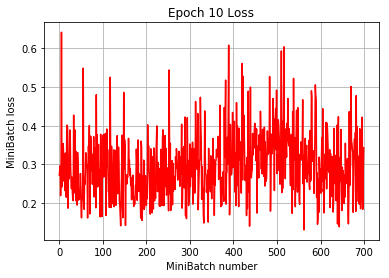

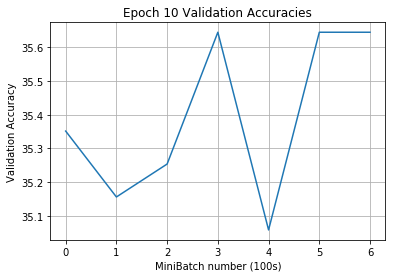

[Epoch 11]
iter:     0, loss min|avg|max: 0.000|0.304| 3.098, val acc: 35.74 %
iter:   100, loss min|avg|max: 0.000|0.210| 2.859, val acc: 35.06 %
iter:   200, loss min|avg|max: 0.000|0.189| 1.731, val acc: 35.74 %
iter:   300, loss min|avg|max: 0.000|0.275| 2.279, val acc: 35.45 %
iter:   400, loss min|avg|max: 0.000|0.303| 2.921, val acc: 35.45 %
iter:   500, loss min|avg|max: 0.000|0.393| 5.397, val acc: 35.45 %
iter:   600, loss min|avg|max: 0.000|0.296| 2.064, val acc: 35.16 %


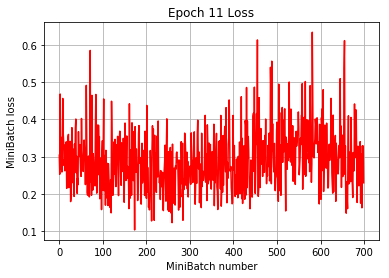

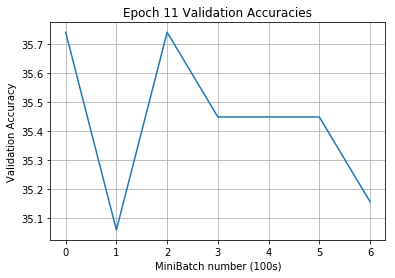

[Epoch 12]
iter:     0, loss min|avg|max: 0.000|0.234| 1.829, val acc: 35.25 %
iter:   100, loss min|avg|max: 0.002|0.250| 2.338, val acc: 35.45 %
iter:   200, loss min|avg|max: 0.000|0.374| 3.379, val acc: 35.55 %
iter:   300, loss min|avg|max: 0.000|0.224| 2.291, val acc: 35.55 %
iter:   400, loss min|avg|max: 0.000|0.346| 3.623, val acc: 35.64 %
iter:   500, loss min|avg|max: 0.000|0.410| 3.111, val acc: 35.45 %
iter:   600, loss min|avg|max: 0.000|0.258| 3.081, val acc: 35.25 %


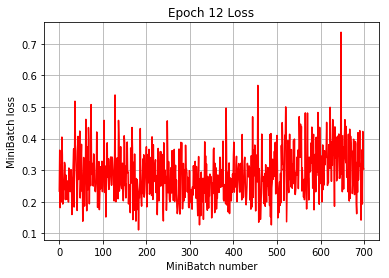

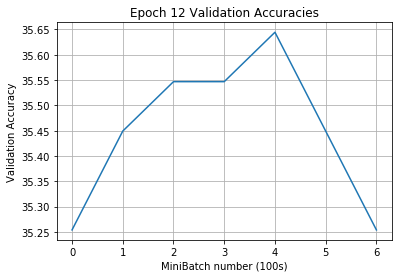

[Epoch 13]
iter:     0, loss min|avg|max: 0.000|0.286| 2.048, val acc: 35.45 %
iter:   100, loss min|avg|max: 0.000|0.227| 1.905, val acc: 35.74 %
iter:   200, loss min|avg|max: 0.000|0.231| 2.492, val acc: 35.16 %
iter:   300, loss min|avg|max: 0.000|0.370| 4.003, val acc: 35.45 %
iter:   400, loss min|avg|max: 0.000|0.383| 3.960, val acc: 35.06 %
iter:   500, loss min|avg|max: 0.001|0.315| 2.564, val acc: 35.16 %
iter:   600, loss min|avg|max: 0.000|0.272| 2.070, val acc: 35.25 %


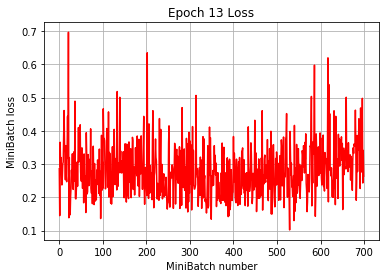

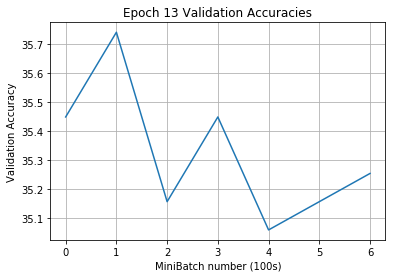

[Epoch 14]
iter:     0, loss min|avg|max: 0.000|0.440| 3.848, val acc: 35.55 %
iter:   100, loss min|avg|max: 0.000|0.359| 3.658, val acc: 35.35 %
iter:   200, loss min|avg|max: 0.000|0.225| 4.060, val acc: 35.55 %
iter:   300, loss min|avg|max: 0.000|0.147| 0.908, val acc: 35.25 %
iter:   400, loss min|avg|max: 0.000|0.230| 2.488, val acc: 35.25 %
iter:   500, loss min|avg|max: 0.000|0.379| 2.848, val acc: 35.25 %
iter:   600, loss min|avg|max: 0.000|0.199| 1.164, val acc: 35.84 %


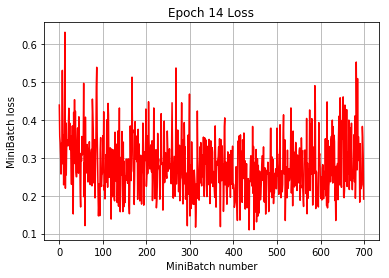

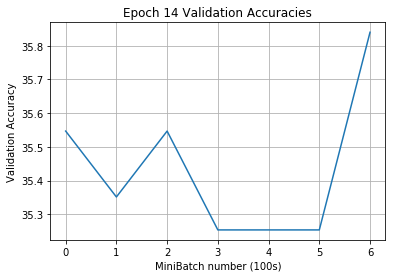

[Epoch 15]
iter:     0, loss min|avg|max: 0.000|0.248| 3.173, val acc: 35.45 %
iter:   100, loss min|avg|max: 0.001|0.351| 4.661, val acc: 35.84 %
iter:   200, loss min|avg|max: 0.000|0.288| 2.843, val acc: 35.55 %
iter:   300, loss min|avg|max: 0.000|0.437| 2.956, val acc: 35.25 %
iter:   400, loss min|avg|max: 0.000|0.370| 5.357, val acc: 35.25 %
iter:   500, loss min|avg|max: 0.000|0.216| 2.661, val acc: 35.64 %
iter:   600, loss min|avg|max: 0.000|0.287| 2.904, val acc: 35.64 %


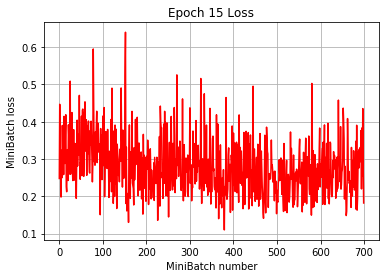

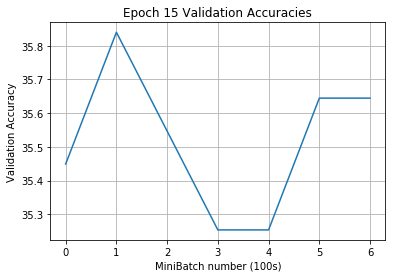

[Epoch 16]
iter:     0, loss min|avg|max: 0.000|0.208| 3.003, val acc: 35.74 %
iter:   100, loss min|avg|max: 0.001|0.240| 4.462, val acc: 35.06 %
iter:   200, loss min|avg|max: 0.000|0.298| 2.637, val acc: 35.55 %
iter:   300, loss min|avg|max: 0.000|0.361| 2.772, val acc: 35.45 %
iter:   400, loss min|avg|max: 0.000|0.211| 2.788, val acc: 35.35 %
iter:   500, loss min|avg|max: 0.000|0.272| 3.247, val acc: 35.45 %
iter:   600, loss min|avg|max: 0.000|0.293| 3.650, val acc: 35.64 %


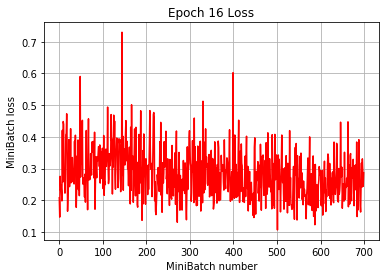

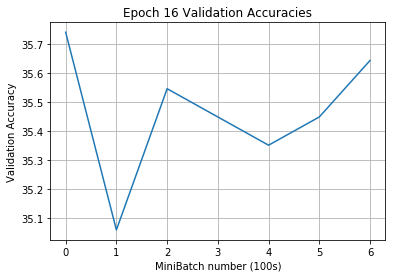

[Epoch 17]
iter:     0, loss min|avg|max: 0.000|0.283| 6.124, val acc: 35.35 %
iter:   100, loss min|avg|max: 0.000|0.334| 4.244, val acc: 35.55 %
iter:   200, loss min|avg|max: 0.000|0.308| 3.734, val acc: 36.04 %
iter:   300, loss min|avg|max: 0.000|0.245| 1.907, val acc: 35.35 %
iter:   400, loss min|avg|max: 0.000|0.230| 1.254, val acc: 35.64 %
iter:   500, loss min|avg|max: 0.000|0.189| 1.146, val acc: 35.55 %
iter:   600, loss min|avg|max: 0.000|0.175| 2.199, val acc: 35.16 %


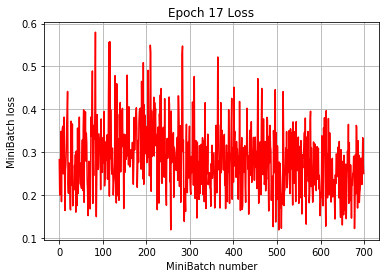

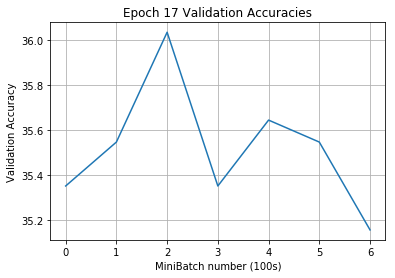

[Epoch 18]
iter:     0, loss min|avg|max: 0.000|0.240| 2.265, val acc: 35.25 %
iter:   100, loss min|avg|max: 0.000|0.229| 1.986, val acc: 35.55 %
iter:   200, loss min|avg|max: 0.000|0.250| 3.095, val acc: 35.74 %
iter:   300, loss min|avg|max: 0.000|0.388| 5.810, val acc: 35.84 %
iter:   400, loss min|avg|max: 0.000|0.409| 4.193, val acc: 35.35 %
iter:   500, loss min|avg|max: 0.000|0.275| 4.752, val acc: 36.04 %
iter:   600, loss min|avg|max: 0.000|0.306| 3.015, val acc: 35.35 %


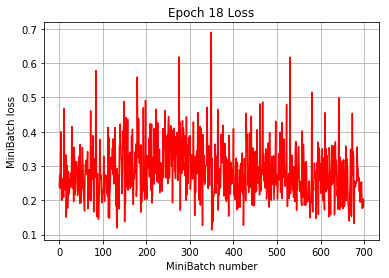

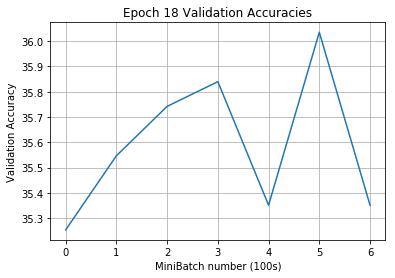

[Epoch 19]
iter:     0, loss min|avg|max: 0.000|0.226| 2.156, val acc: 35.64 %
iter:   100, loss min|avg|max: 0.000|0.315| 2.327, val acc: 35.64 %
iter:   200, loss min|avg|max: 0.000|0.236| 2.836, val acc: 35.16 %
iter:   300, loss min|avg|max: 0.000|0.240| 1.972, val acc: 35.45 %
iter:   400, loss min|avg|max: 0.000|0.219| 1.534, val acc: 35.25 %
iter:   500, loss min|avg|max: 0.000|0.172| 1.908, val acc: 35.35 %
iter:   600, loss min|avg|max: 0.000|0.447| 4.885, val acc: 35.55 %


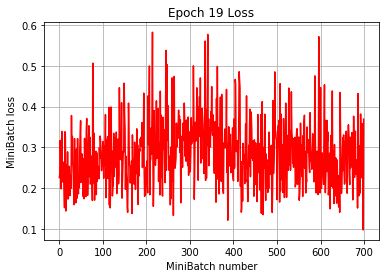

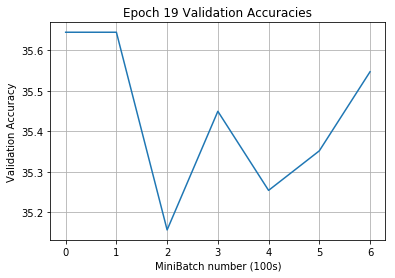

[Epoch 20]
iter:     0, loss min|avg|max: 0.000|0.294| 4.423, val acc: 35.35 %
iter:   100, loss min|avg|max: 0.000|0.226| 2.438, val acc: 35.45 %
iter:   200, loss min|avg|max: 0.000|0.198| 3.205, val acc: 35.35 %
iter:   300, loss min|avg|max: 0.000|0.260| 1.733, val acc: 35.45 %
iter:   400, loss min|avg|max: 0.000|0.253| 1.965, val acc: 35.25 %
iter:   500, loss min|avg|max: 0.000|0.302| 3.051, val acc: 35.45 %
iter:   600, loss min|avg|max: 0.000|0.315| 2.359, val acc: 35.84 %


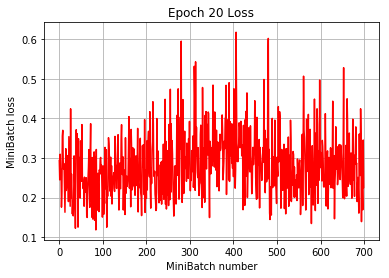

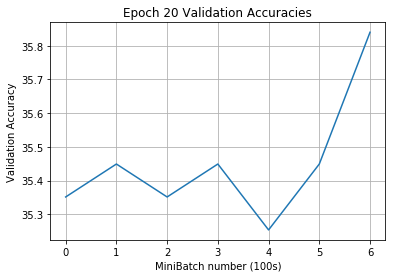

[Epoch 21]
iter:     0, loss min|avg|max: 0.000|0.249| 4.581, val acc: 35.45 %
iter:   100, loss min|avg|max: 0.001|0.359| 2.428, val acc: 35.94 %
iter:   200, loss min|avg|max: 0.000|0.310| 3.858, val acc: 35.35 %
iter:   300, loss min|avg|max: 0.000|0.239| 5.444, val acc: 35.35 %
iter:   400, loss min|avg|max: 0.000|0.332| 3.397, val acc: 35.35 %
iter:   500, loss min|avg|max: 0.000|0.340| 3.466, val acc: 35.64 %
iter:   600, loss min|avg|max: 0.000|0.275| 2.418, val acc: 35.55 %


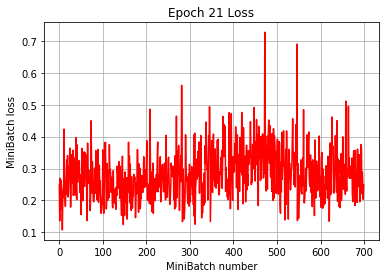

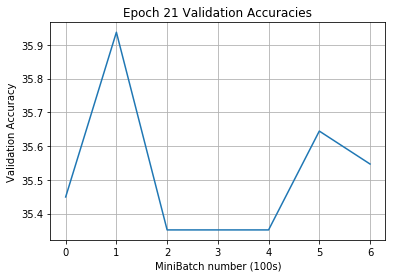

[Epoch 22]
iter:     0, loss min|avg|max: 0.000|0.345| 4.709, val acc: 35.84 %
iter:   100, loss min|avg|max: 0.000|0.247| 2.912, val acc: 35.25 %
iter:   200, loss min|avg|max: 0.000|0.254| 3.564, val acc: 35.35 %
iter:   300, loss min|avg|max: 0.000|0.295| 4.727, val acc: 35.45 %
iter:   400, loss min|avg|max: 0.000|0.254| 3.464, val acc: 35.35 %
iter:   500, loss min|avg|max: 0.000|0.347| 5.475, val acc: 35.55 %
iter:   600, loss min|avg|max: 0.000|0.224| 2.063, val acc: 35.64 %


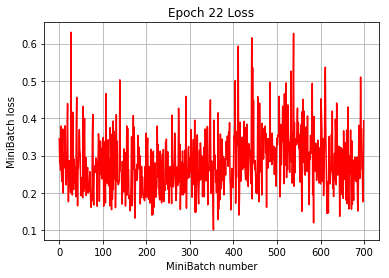

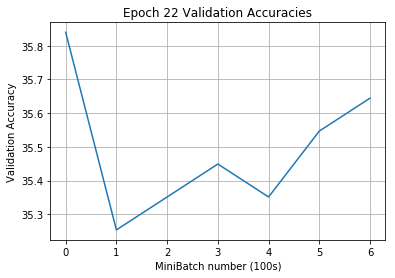

[Epoch 23]
iter:     0, loss min|avg|max: 0.001|0.295| 2.163, val acc: 35.25 %
iter:   100, loss min|avg|max: 0.000|0.251| 2.464, val acc: 35.74 %
iter:   200, loss min|avg|max: 0.000|0.265| 3.351, val acc: 35.84 %
iter:   300, loss min|avg|max: 0.000|0.182| 1.716, val acc: 35.55 %
iter:   400, loss min|avg|max: 0.000|0.426| 7.837, val acc: 35.55 %
iter:   500, loss min|avg|max: 0.000|0.246| 3.366, val acc: 35.55 %
iter:   600, loss min|avg|max: 0.000|0.302| 3.161, val acc: 34.96 %


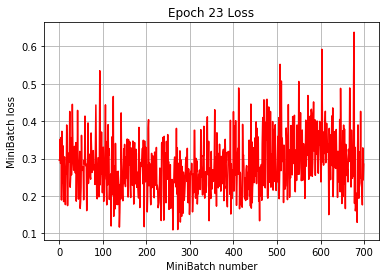

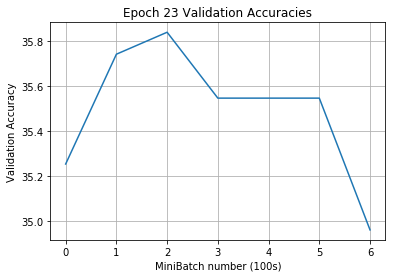

[Epoch 24]
iter:     0, loss min|avg|max: 0.000|0.405| 3.709, val acc: 35.55 %
iter:   100, loss min|avg|max: 0.000|0.295| 3.886, val acc: 35.55 %
iter:   200, loss min|avg|max: 0.000|0.201| 2.627, val acc: 35.55 %
iter:   300, loss min|avg|max: 0.000|0.192| 2.041, val acc: 35.94 %
iter:   400, loss min|avg|max: 0.000|0.204| 1.768, val acc: 35.55 %
iter:   500, loss min|avg|max: 0.000|0.224| 2.029, val acc: 35.74 %
iter:   600, loss min|avg|max: 0.000|0.383| 3.135, val acc: 35.25 %


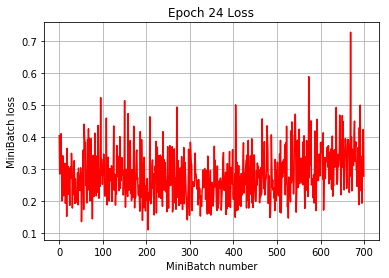

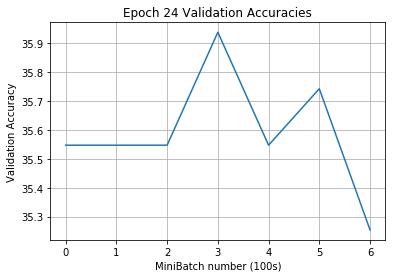

[Epoch 25]
iter:     0, loss min|avg|max: 0.000|0.213| 3.169, val acc: 35.94 %
iter:   100, loss min|avg|max: 0.000|0.350| 4.582, val acc: 35.25 %
iter:   200, loss min|avg|max: 0.000|0.298| 2.689, val acc: 35.55 %
iter:   300, loss min|avg|max: 0.000|0.381| 4.195, val acc: 35.25 %
iter:   400, loss min|avg|max: 0.000|0.399| 3.303, val acc: 35.45 %
iter:   500, loss min|avg|max: 0.000|0.329| 5.542, val acc: 35.16 %
iter:   600, loss min|avg|max: 0.000|0.379| 7.209, val acc: 35.64 %


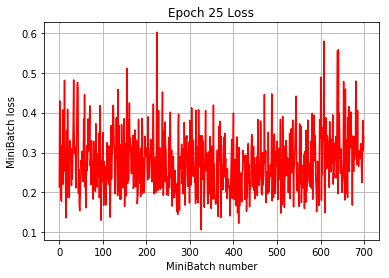

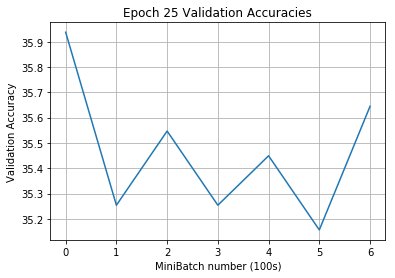

[Epoch 26]
iter:     0, loss min|avg|max: 0.000|0.366| 2.276, val acc: 35.35 %
iter:   100, loss min|avg|max: 0.000|0.372| 2.541, val acc: 35.45 %
iter:   200, loss min|avg|max: 0.000|0.309| 3.496, val acc: 35.35 %
iter:   300, loss min|avg|max: 0.000|0.243| 2.730, val acc: 35.45 %
iter:   400, loss min|avg|max: 0.000|0.206| 2.651, val acc: 35.35 %
iter:   500, loss min|avg|max: 0.000|0.248| 4.485, val acc: 35.64 %
iter:   600, loss min|avg|max: 0.000|0.282| 3.939, val acc: 35.55 %


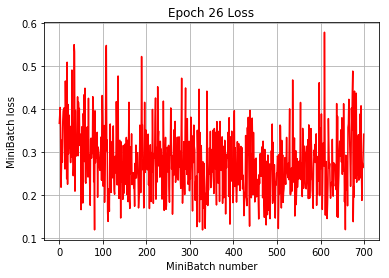

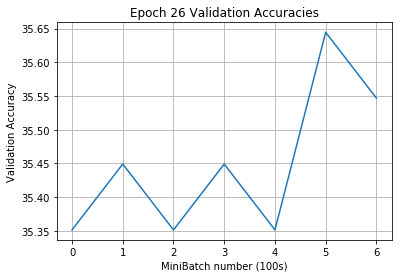

[Epoch 27]
iter:     0, loss min|avg|max: 0.000|0.279| 4.971, val acc: 35.55 %
iter:   100, loss min|avg|max: 0.000|0.618| 7.111, val acc: 35.84 %
iter:   200, loss min|avg|max: 0.000|0.387| 5.329, val acc: 35.45 %
iter:   300, loss min|avg|max: 0.000|0.319| 3.358, val acc: 35.16 %
iter:   400, loss min|avg|max: 0.000|0.182| 1.772, val acc: 35.45 %
iter:   500, loss min|avg|max: 0.000|0.341| 3.458, val acc: 35.94 %
iter:   600, loss min|avg|max: 0.000|0.222| 2.153, val acc: 35.35 %


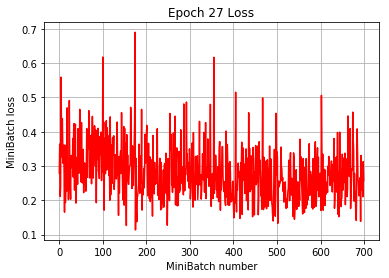

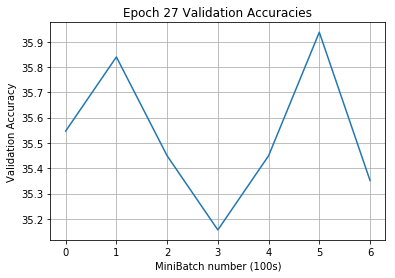

[Epoch 28]
iter:     0, loss min|avg|max: 0.000|0.197| 1.931, val acc: 35.55 %
iter:   100, loss min|avg|max: 0.000|0.347| 3.755, val acc: 35.35 %
iter:   200, loss min|avg|max: 0.000|0.303| 4.170, val acc: 35.55 %
iter:   300, loss min|avg|max: 0.000|0.284| 3.592, val acc: 35.25 %
iter:   400, loss min|avg|max: 0.001|0.239| 2.572, val acc: 35.55 %
iter:   500, loss min|avg|max: 0.000|0.289| 3.695, val acc: 35.45 %
iter:   600, loss min|avg|max: 0.000|0.150| 2.167, val acc: 35.64 %


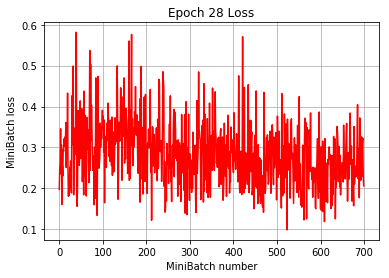

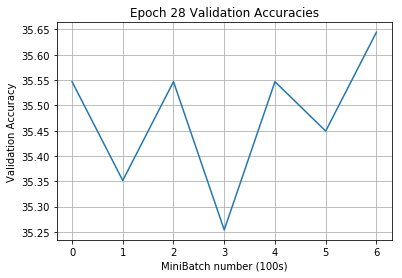

[Epoch 29]
iter:     0, loss min|avg|max: 0.000|0.289| 2.163, val acc: 35.06 %
iter:   100, loss min|avg|max: 0.000|0.196| 2.067, val acc: 36.04 %
iter:   200, loss min|avg|max: 0.000|0.370| 5.109, val acc: 35.64 %
iter:   300, loss min|avg|max: 0.000|0.348| 2.871, val acc: 35.64 %
iter:   400, loss min|avg|max: 0.000|0.322| 4.061, val acc: 35.64 %
iter:   500, loss min|avg|max: 0.000|0.380| 4.960, val acc: 35.25 %
iter:   600, loss min|avg|max: 0.000|0.223| 3.199, val acc: 35.16 %


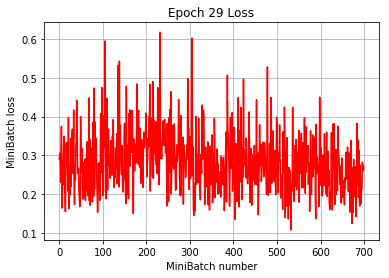

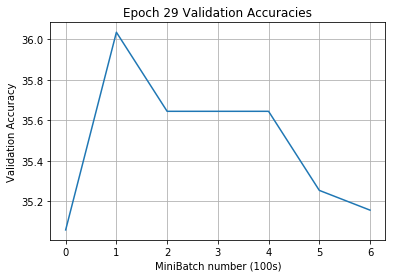

[Epoch 30]
iter:     0, loss min|avg|max: 0.000|0.146| 1.505, val acc: 35.55 %
iter:   100, loss min|avg|max: 0.000|0.250| 3.324, val acc: 35.55 %
iter:   200, loss min|avg|max: 0.000|0.313| 3.027, val acc: 35.74 %
iter:   300, loss min|avg|max: 0.000|0.230| 3.109, val acc: 35.84 %
iter:   400, loss min|avg|max: 0.000|0.249| 2.928, val acc: 35.74 %
iter:   500, loss min|avg|max: 0.000|0.299| 2.470, val acc: 35.35 %
iter:   600, loss min|avg|max: 0.000|0.180| 1.961, val acc: 35.45 %


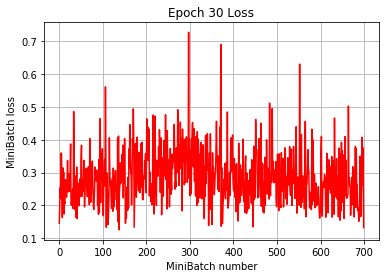

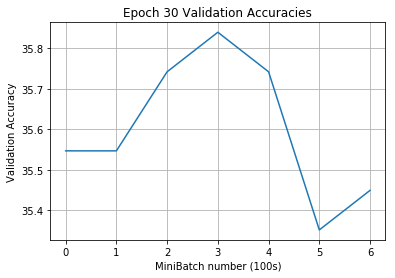

Execution Time: 13297832 ms


In [20]:
cnn3_model = CNN3(NUM_CLASSES)
train(cnn3_model, num_epochs = 30)

In [21]:
test_acc3 = get_accuracy(cnn3_model, X_test, y_test, X_test_iter, y_test_iter)
print ("CNN3 - Test Accuracy: {:.2f} %".format(test_acc3), end="\n\n")

cnn3_model.summary()

CNN3 - Test Accuracy: 34.76 %

Model: "cn_n3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1 (Conv2D)               multiple                  2432      
_________________________________________________________________
conv2 (Conv2D)               multiple                  51264     
_________________________________________________________________
flatten_2 (Flatten)          multiple                  0         
_________________________________________________________________
fc1 (Dense)                  multiple                  33554944  
_________________________________________________________________
fc2 (Dense)                  multiple                  51300     
Total params: 33,659,940
Trainable params: 33,659,940
Non-trainable params: 0
_________________________________________________________________


### Experiment #4 - CNN4

[Epoch 1]
iter:     0, loss min|avg|max: 3.198|4.693| 5.751, val acc: 1.66 %
iter:   100, loss min|avg|max: 0.119|4.039| 6.535, val acc: 11.43 %
iter:   200, loss min|avg|max: 0.471|3.381| 7.538, val acc: 17.48 %
iter:   300, loss min|avg|max: 0.203|3.167| 5.992, val acc: 20.12 %
iter:   400, loss min|avg|max: 0.104|3.329| 7.788, val acc: 22.66 %
iter:   500, loss min|avg|max: 0.293|2.925| 8.343, val acc: 24.80 %
iter:   600, loss min|avg|max: 0.225|2.925| 5.973, val acc: 26.46 %


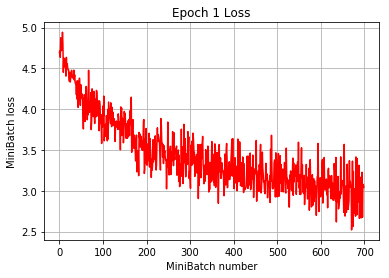

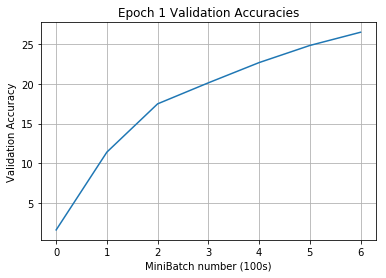

[Epoch 2]
iter:     0, loss min|avg|max: 0.075|3.409| 7.655, val acc: 28.22 %
iter:   100, loss min|avg|max: 0.042|2.966| 6.723, val acc: 27.73 %
iter:   200, loss min|avg|max: 0.204|2.606| 6.447, val acc: 30.86 %
iter:   300, loss min|avg|max: 0.018|2.816| 7.614, val acc: 30.96 %
iter:   400, loss min|avg|max: 0.090|2.499| 5.165, val acc: 31.74 %
iter:   500, loss min|avg|max: 0.030|2.550| 5.937, val acc: 31.93 %
iter:   600, loss min|avg|max: 0.013|2.709| 7.040, val acc: 32.42 %


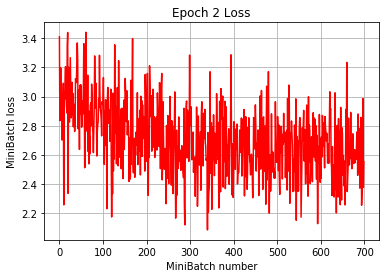

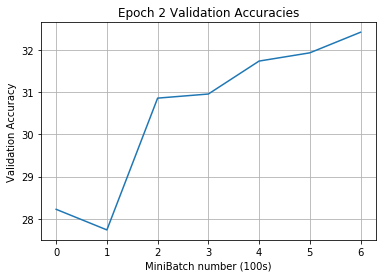

[Epoch 3]
iter:     0, loss min|avg|max: 0.042|2.585| 6.958, val acc: 33.01 %
iter:   100, loss min|avg|max: 0.003|2.480| 6.642, val acc: 34.28 %
iter:   200, loss min|avg|max: 0.006|2.419| 7.150, val acc: 34.38 %
iter:   300, loss min|avg|max: 0.056|2.605| 6.663, val acc: 35.16 %
iter:   400, loss min|avg|max: 0.070|2.678| 7.547, val acc: 35.94 %
iter:   500, loss min|avg|max: 0.126|2.363| 8.500, val acc: 36.04 %
iter:   600, loss min|avg|max: 0.026|2.501| 6.198, val acc: 36.23 %


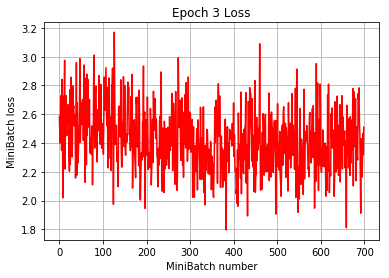

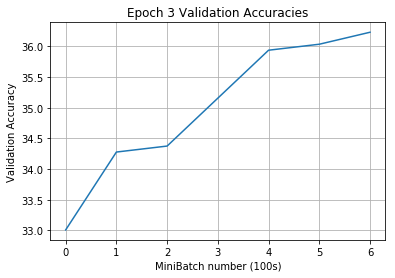

[Epoch 4]
iter:     0, loss min|avg|max: 0.010|2.282| 8.179, val acc: 35.06 %
iter:   100, loss min|avg|max: 0.001|2.321| 5.930, val acc: 36.13 %
iter:   200, loss min|avg|max: 0.083|2.144| 6.477, val acc: 36.82 %
iter:   300, loss min|avg|max: 0.014|2.164| 6.565, val acc: 35.25 %
iter:   400, loss min|avg|max: 0.011|2.343| 6.832, val acc: 35.94 %
iter:   500, loss min|avg|max: 0.008|2.414| 6.684, val acc: 35.55 %
iter:   600, loss min|avg|max: 0.023|2.500| 7.969, val acc: 36.72 %


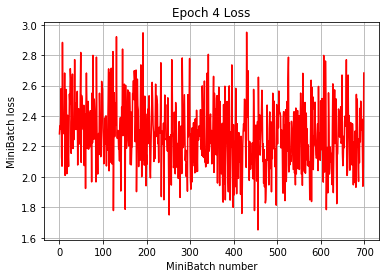

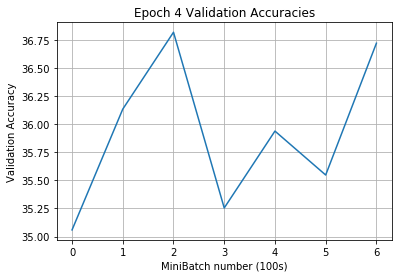

[Epoch 5]
iter:     0, loss min|avg|max: 0.001|2.258| 5.690, val acc: 36.33 %
iter:   100, loss min|avg|max: 0.028|2.508| 7.804, val acc: 37.89 %
iter:   200, loss min|avg|max: 0.019|2.153| 5.162, val acc: 36.72 %
iter:   300, loss min|avg|max: 0.017|1.994| 6.077, val acc: 37.11 %
iter:   400, loss min|avg|max: 0.019|1.969| 6.353, val acc: 36.72 %
iter:   500, loss min|avg|max: 0.021|2.279| 8.658, val acc: 36.62 %
iter:   600, loss min|avg|max: 0.003|2.274| 8.835, val acc: 36.43 %


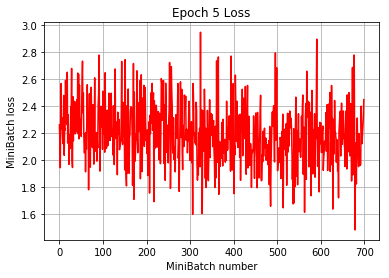

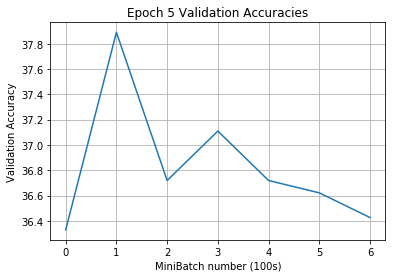

[Epoch 6]
iter:     0, loss min|avg|max: 0.076|2.029| 6.747, val acc: 36.91 %
iter:   100, loss min|avg|max: 0.015|2.175| 8.197, val acc: 37.70 %
iter:   200, loss min|avg|max: 0.028|2.262| 5.916, val acc: 36.62 %
iter:   300, loss min|avg|max: 0.000|2.558| 7.998, val acc: 37.50 %
iter:   400, loss min|avg|max: 0.009|2.169| 5.881, val acc: 37.60 %
iter:   500, loss min|avg|max: 0.022|2.156| 6.305, val acc: 37.01 %
iter:   600, loss min|avg|max: 0.014|1.851| 5.732, val acc: 36.62 %


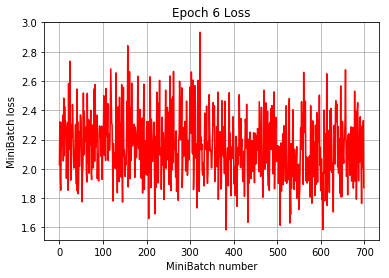

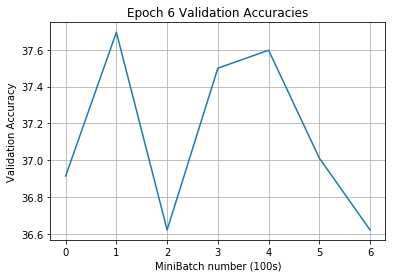

[Epoch 7]
iter:     0, loss min|avg|max: 0.005|2.310| 6.418, val acc: 37.21 %
iter:   100, loss min|avg|max: 0.036|2.183|10.582, val acc: 37.70 %
iter:   200, loss min|avg|max: 0.000|2.184| 7.505, val acc: 36.72 %
iter:   300, loss min|avg|max: 0.008|1.851| 5.953, val acc: 37.11 %
iter:   400, loss min|avg|max: 0.022|2.235| 7.600, val acc: 37.50 %
iter:   500, loss min|avg|max: 0.017|1.981| 7.185, val acc: 37.40 %
iter:   600, loss min|avg|max: 0.000|2.054| 6.677, val acc: 37.30 %


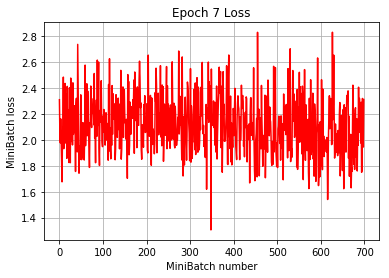

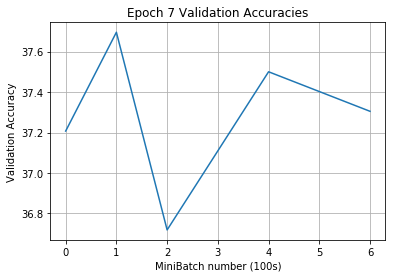

[Epoch 8]
iter:     0, loss min|avg|max: 0.063|2.268| 7.579, val acc: 37.40 %
iter:   100, loss min|avg|max: 0.019|2.424| 6.641, val acc: 37.11 %
iter:   200, loss min|avg|max: 0.018|2.194| 7.346, val acc: 37.60 %
iter:   300, loss min|avg|max: 0.100|2.170| 8.718, val acc: 37.11 %
iter:   400, loss min|avg|max: 0.018|1.904|10.457, val acc: 37.50 %
iter:   500, loss min|avg|max: 0.020|2.056| 7.686, val acc: 37.79 %
iter:   600, loss min|avg|max: 0.000|1.878| 7.133, val acc: 37.60 %


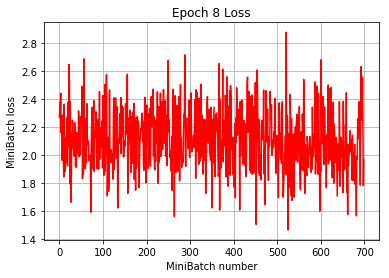

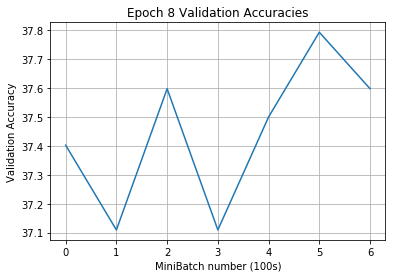

[Epoch 9]
iter:     0, loss min|avg|max: 0.044|2.035| 6.731, val acc: 37.89 %
iter:   100, loss min|avg|max: 0.012|2.190| 7.226, val acc: 37.79 %
iter:   200, loss min|avg|max: 0.010|1.934| 8.210, val acc: 37.79 %
iter:   300, loss min|avg|max: 0.110|1.926| 5.929, val acc: 37.89 %
iter:   400, loss min|avg|max: 0.026|2.195| 7.012, val acc: 37.89 %
iter:   500, loss min|avg|max: 0.002|2.447| 7.126, val acc: 38.57 %
iter:   600, loss min|avg|max: 0.037|2.030| 7.985, val acc: 38.18 %


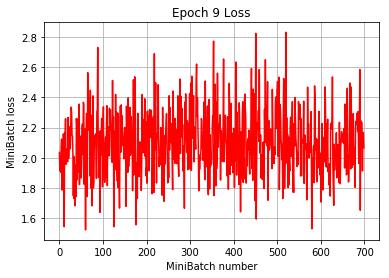

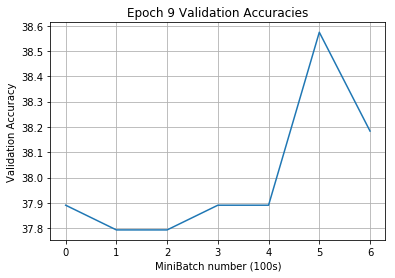

[Epoch 10]
iter:     0, loss min|avg|max: 0.001|1.933| 8.178, val acc: 37.79 %
iter:   100, loss min|avg|max: 0.010|1.863| 6.698, val acc: 37.89 %
iter:   200, loss min|avg|max: 0.018|1.980| 7.257, val acc: 37.99 %
iter:   300, loss min|avg|max: 0.014|2.024| 7.564, val acc: 37.70 %
iter:   400, loss min|avg|max: 0.006|1.993| 7.161, val acc: 37.79 %
iter:   500, loss min|avg|max: 0.001|2.426| 7.223, val acc: 37.89 %
iter:   600, loss min|avg|max: 0.026|2.434| 7.872, val acc: 37.50 %


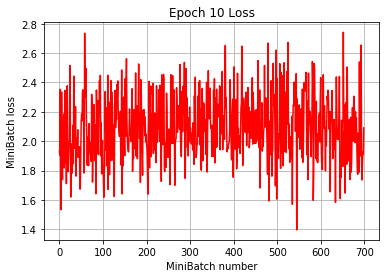

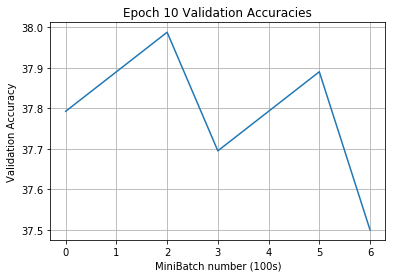

[Epoch 11]
iter:     0, loss min|avg|max: 0.040|1.997| 7.315, val acc: 38.48 %
iter:   100, loss min|avg|max: 0.047|2.054| 5.986, val acc: 38.28 %
iter:   200, loss min|avg|max: 0.024|2.440| 9.957, val acc: 38.28 %
iter:   300, loss min|avg|max: 0.025|2.125| 5.988, val acc: 38.18 %
iter:   400, loss min|avg|max: 0.009|2.295| 9.187, val acc: 37.50 %
iter:   500, loss min|avg|max: 0.032|2.146| 6.299, val acc: 37.30 %
iter:   600, loss min|avg|max: 0.024|2.077| 7.811, val acc: 38.18 %


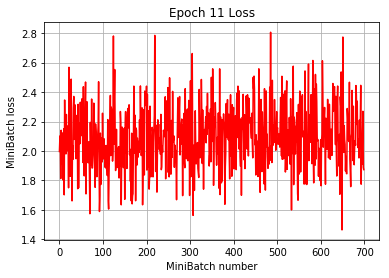

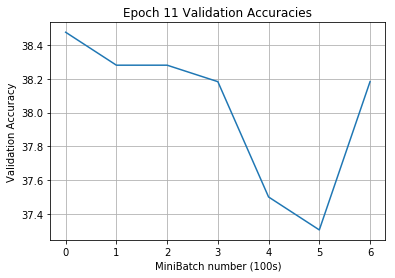

[Epoch 12]
iter:     0, loss min|avg|max: 0.005|1.798| 6.458, val acc: 37.99 %
iter:   100, loss min|avg|max: 0.008|2.063| 7.405, val acc: 38.18 %
iter:   200, loss min|avg|max: 0.016|1.744| 4.864, val acc: 38.28 %
iter:   300, loss min|avg|max: 0.006|2.011| 7.009, val acc: 37.89 %
iter:   400, loss min|avg|max: 0.108|2.233|10.529, val acc: 37.99 %
iter:   500, loss min|avg|max: 0.022|1.831| 7.651, val acc: 37.79 %
iter:   600, loss min|avg|max: 0.054|2.246| 6.487, val acc: 37.79 %


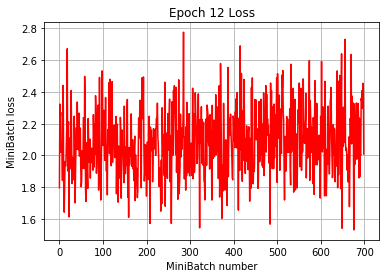

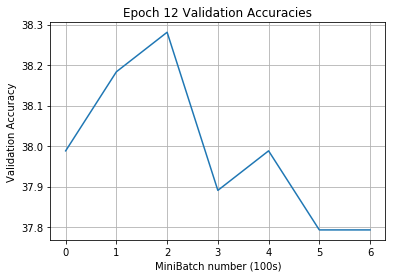

[Epoch 13]
iter:     0, loss min|avg|max: 0.067|2.124| 6.668, val acc: 38.09 %
iter:   100, loss min|avg|max: 0.024|2.142| 6.858, val acc: 38.09 %
iter:   200, loss min|avg|max: 0.004|1.728| 5.203, val acc: 37.89 %
iter:   300, loss min|avg|max: 0.031|1.751| 5.888, val acc: 37.89 %
iter:   400, loss min|avg|max: 0.002|1.683| 5.954, val acc: 37.79 %
iter:   500, loss min|avg|max: 0.008|1.857| 9.672, val acc: 37.89 %
iter:   600, loss min|avg|max: 0.001|1.972| 4.816, val acc: 37.70 %


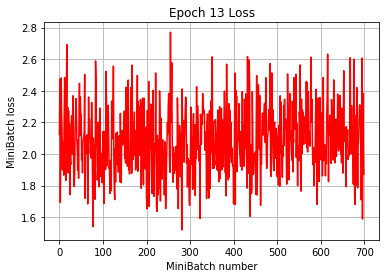

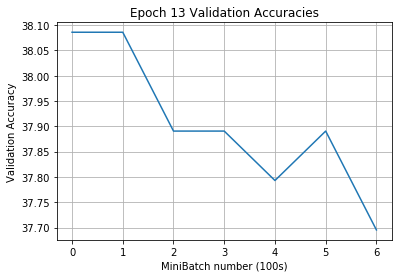

[Epoch 14]
iter:     0, loss min|avg|max: 0.124|1.916| 5.902, val acc: 37.79 %
iter:   100, loss min|avg|max: 0.001|1.621| 6.979, val acc: 37.99 %
iter:   200, loss min|avg|max: 0.105|1.832| 6.585, val acc: 38.09 %
iter:   300, loss min|avg|max: 0.003|1.895| 8.317, val acc: 37.50 %
iter:   400, loss min|avg|max: 0.042|2.079| 7.653, val acc: 38.28 %
iter:   500, loss min|avg|max: 0.028|2.075| 7.567, val acc: 37.89 %
iter:   600, loss min|avg|max: 0.041|2.207| 8.568, val acc: 38.18 %


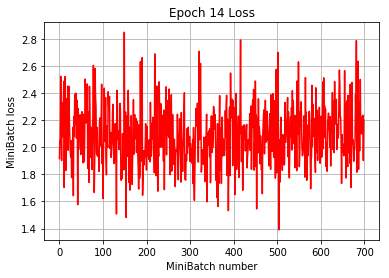

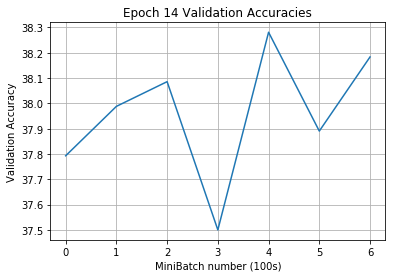

[Epoch 15]
iter:     0, loss min|avg|max: 0.000|2.172| 7.014, val acc: 38.18 %
iter:   100, loss min|avg|max: 0.020|2.174|13.113, val acc: 38.28 %
iter:   200, loss min|avg|max: 0.001|2.231| 6.582, val acc: 37.99 %
iter:   300, loss min|avg|max: 0.028|2.052| 8.984, val acc: 37.89 %
iter:   400, loss min|avg|max: 0.003|1.934| 6.089, val acc: 38.38 %
iter:   500, loss min|avg|max: 0.000|1.828| 6.867, val acc: 38.28 %
iter:   600, loss min|avg|max: 0.000|2.208| 6.855, val acc: 38.09 %


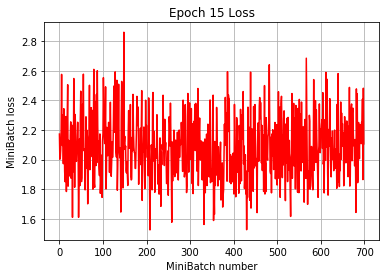

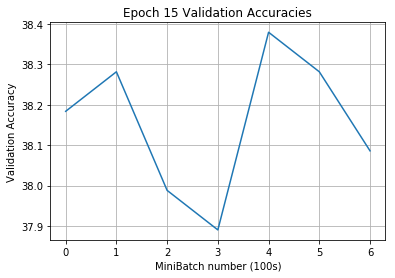

[Epoch 16]
iter:     0, loss min|avg|max: 0.033|2.339| 6.328, val acc: 37.70 %
iter:   100, loss min|avg|max: 0.018|1.999| 7.704, val acc: 38.09 %
iter:   200, loss min|avg|max: 0.012|2.015|11.094, val acc: 37.99 %
iter:   300, loss min|avg|max: 0.010|1.997| 6.798, val acc: 37.79 %
iter:   400, loss min|avg|max: 0.016|1.891| 8.143, val acc: 38.09 %
iter:   500, loss min|avg|max: 0.000|2.083| 8.271, val acc: 37.99 %
iter:   600, loss min|avg|max: 0.001|2.305| 5.634, val acc: 37.60 %


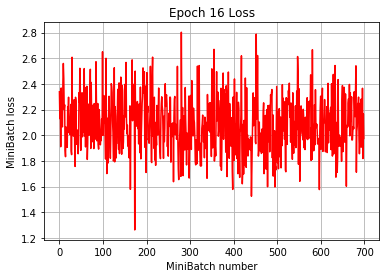

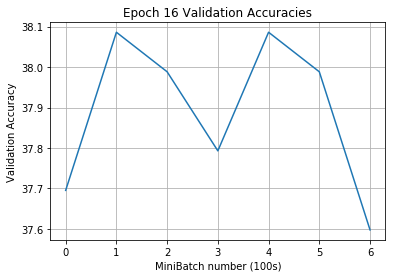

[Epoch 17]
iter:     0, loss min|avg|max: 0.009|1.724| 7.257, val acc: 38.48 %
iter:   100, loss min|avg|max: 0.029|2.049| 8.688, val acc: 37.99 %
iter:   200, loss min|avg|max: 0.075|2.602|10.117, val acc: 38.38 %
iter:   300, loss min|avg|max: 0.037|2.438| 7.612, val acc: 38.18 %
iter:   400, loss min|avg|max: 0.073|2.112| 5.713, val acc: 37.50 %
iter:   500, loss min|avg|max: 0.024|1.991| 5.177, val acc: 37.79 %
iter:   600, loss min|avg|max: 0.004|1.671| 5.424, val acc: 38.18 %


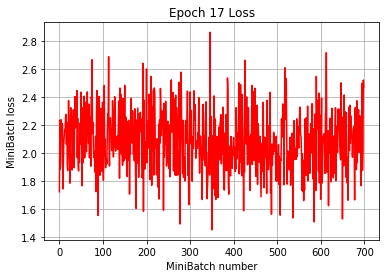

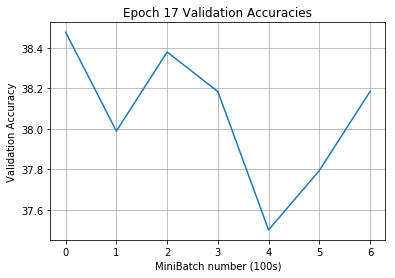

[Epoch 18]
iter:     0, loss min|avg|max: 0.027|1.971| 7.411, val acc: 37.99 %
iter:   100, loss min|avg|max: 0.023|2.082| 6.981, val acc: 38.18 %
iter:   200, loss min|avg|max: 0.032|2.120| 9.185, val acc: 38.38 %
iter:   300, loss min|avg|max: 0.087|2.339| 6.236, val acc: 37.79 %
iter:   400, loss min|avg|max: 0.139|2.080|11.235, val acc: 37.99 %
iter:   500, loss min|avg|max: 0.028|2.280| 6.848, val acc: 37.79 %
iter:   600, loss min|avg|max: 0.003|2.237| 6.558, val acc: 38.18 %


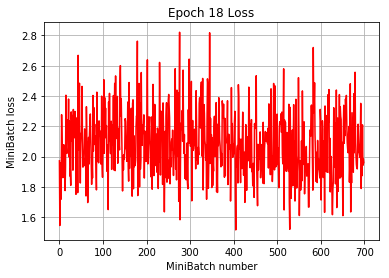

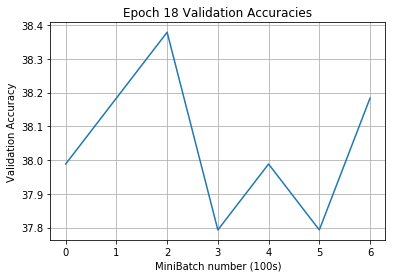

[Epoch 19]
iter:     0, loss min|avg|max: 0.014|2.456| 7.248, val acc: 37.99 %
iter:   100, loss min|avg|max: 0.028|2.138| 5.236, val acc: 38.09 %
iter:   200, loss min|avg|max: 0.044|1.934| 8.423, val acc: 37.79 %
iter:   300, loss min|avg|max: 0.046|2.139| 5.902, val acc: 37.79 %
iter:   400, loss min|avg|max: 0.025|2.197| 7.332, val acc: 37.79 %
iter:   500, loss min|avg|max: 0.008|2.089| 8.238, val acc: 37.89 %
iter:   600, loss min|avg|max: 0.002|1.880| 6.745, val acc: 37.89 %


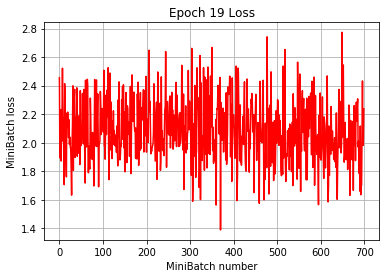

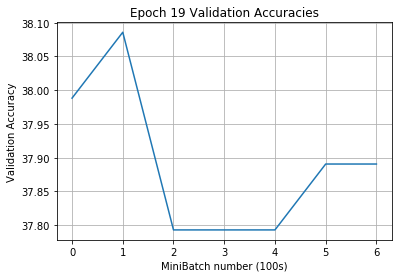

[Epoch 20]
iter:     0, loss min|avg|max: 0.001|1.654| 5.714, val acc: 37.89 %
iter:   100, loss min|avg|max: 0.035|2.266| 8.790, val acc: 37.89 %
iter:   200, loss min|avg|max: 0.004|2.086| 8.223, val acc: 37.79 %
iter:   300, loss min|avg|max: 0.010|2.404| 9.245, val acc: 37.70 %
iter:   400, loss min|avg|max: 0.018|2.160| 8.024, val acc: 38.28 %
iter:   500, loss min|avg|max: 0.022|2.302| 6.323, val acc: 38.09 %
iter:   600, loss min|avg|max: 0.014|1.972| 7.596, val acc: 38.18 %


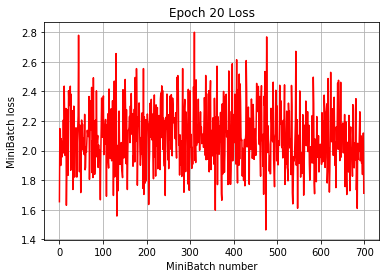

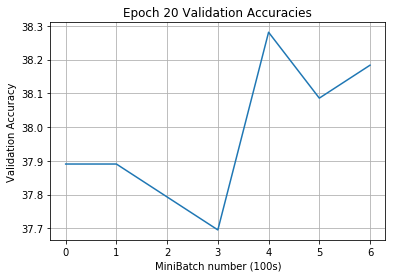

[Epoch 21]
iter:     0, loss min|avg|max: 0.000|2.000| 5.909, val acc: 38.18 %
iter:   100, loss min|avg|max: 0.064|1.758| 6.823, val acc: 37.99 %
iter:   200, loss min|avg|max: 0.030|1.853| 5.296, val acc: 37.99 %
iter:   300, loss min|avg|max: 0.055|2.021| 7.910, val acc: 37.99 %
iter:   400, loss min|avg|max: 0.005|1.841| 6.704, val acc: 38.57 %
iter:   500, loss min|avg|max: 0.070|2.290| 7.575, val acc: 38.38 %
iter:   600, loss min|avg|max: 0.006|2.114| 7.176, val acc: 37.60 %


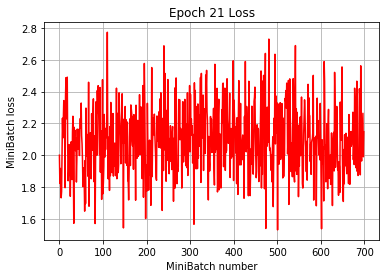

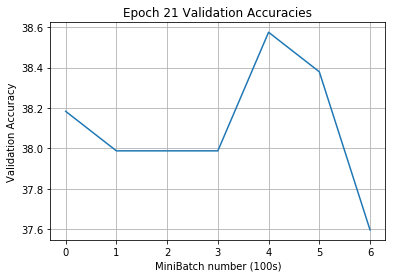

[Epoch 22]
iter:     0, loss min|avg|max: 0.007|1.897| 7.581, val acc: 37.99 %
iter:   100, loss min|avg|max: 0.027|2.005| 6.688, val acc: 37.99 %
iter:   200, loss min|avg|max: 0.028|2.199| 8.222, val acc: 37.89 %
iter:   300, loss min|avg|max: 0.030|2.016| 6.907, val acc: 37.99 %
iter:   400, loss min|avg|max: 0.007|2.048| 8.149, val acc: 38.18 %
iter:   500, loss min|avg|max: 0.004|1.809| 6.211, val acc: 37.60 %
iter:   600, loss min|avg|max: 0.013|1.835| 8.401, val acc: 37.99 %


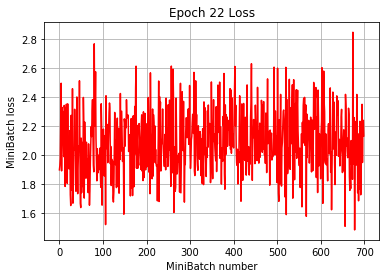

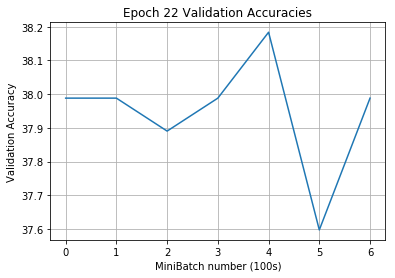

[Epoch 23]
iter:     0, loss min|avg|max: 0.011|2.061| 5.067, val acc: 38.48 %
iter:   100, loss min|avg|max: 0.002|2.049| 5.685, val acc: 37.89 %
iter:   200, loss min|avg|max: 0.026|1.934| 5.518, val acc: 38.28 %
iter:   300, loss min|avg|max: 0.045|2.085| 8.788, val acc: 38.09 %
iter:   400, loss min|avg|max: 0.078|2.208|10.296, val acc: 37.70 %
iter:   500, loss min|avg|max: 0.018|2.001| 6.381, val acc: 37.70 %
iter:   600, loss min|avg|max: 0.006|2.315| 7.181, val acc: 37.99 %


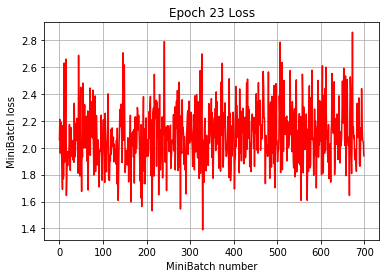

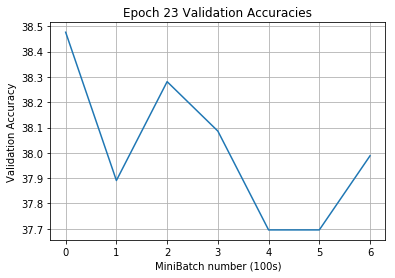

[Epoch 24]
iter:     0, loss min|avg|max: 0.161|1.939| 4.354, val acc: 38.38 %
iter:   100, loss min|avg|max: 0.028|2.200| 6.571, val acc: 38.09 %
iter:   200, loss min|avg|max: 0.004|1.678| 5.212, val acc: 38.09 %
iter:   300, loss min|avg|max: 0.021|2.282| 6.614, val acc: 38.09 %
iter:   400, loss min|avg|max: 0.006|2.259| 8.078, val acc: 37.89 %
iter:   500, loss min|avg|max: 0.008|2.172| 6.246, val acc: 37.79 %
iter:   600, loss min|avg|max: 0.000|2.234| 7.307, val acc: 38.38 %


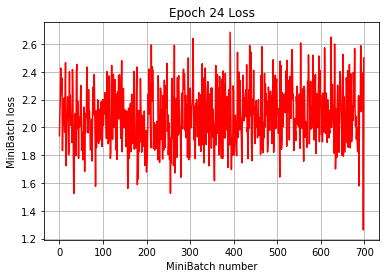

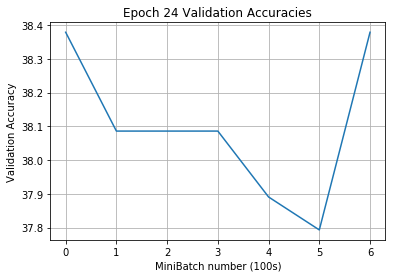

[Epoch 25]
iter:     0, loss min|avg|max: 0.000|2.091| 6.136, val acc: 37.70 %
iter:   100, loss min|avg|max: 0.042|1.915| 7.148, val acc: 38.18 %
iter:   200, loss min|avg|max: 0.001|1.995| 8.126, val acc: 37.70 %
iter:   300, loss min|avg|max: 0.001|1.735| 6.584, val acc: 37.70 %
iter:   400, loss min|avg|max: 0.007|2.233| 7.868, val acc: 38.09 %
iter:   500, loss min|avg|max: 0.006|2.067| 7.661, val acc: 37.60 %
iter:   600, loss min|avg|max: 0.024|2.668| 7.305, val acc: 37.99 %


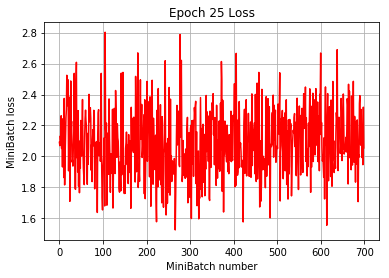

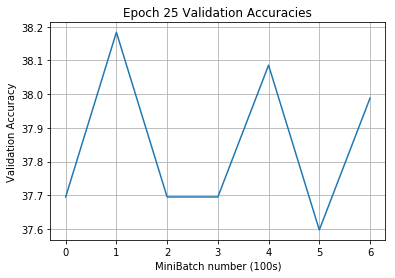

[Epoch 26]
iter:     0, loss min|avg|max: 0.038|1.799| 6.023, val acc: 37.79 %
iter:   100, loss min|avg|max: 0.121|2.507| 6.629, val acc: 38.18 %
iter:   200, loss min|avg|max: 0.033|2.071| 8.856, val acc: 37.60 %
iter:   300, loss min|avg|max: 0.028|1.975| 8.106, val acc: 37.89 %
iter:   400, loss min|avg|max: 0.008|1.857| 5.858, val acc: 38.18 %
iter:   500, loss min|avg|max: 0.013|2.180| 8.627, val acc: 38.09 %
iter:   600, loss min|avg|max: 0.003|1.972| 6.556, val acc: 38.18 %


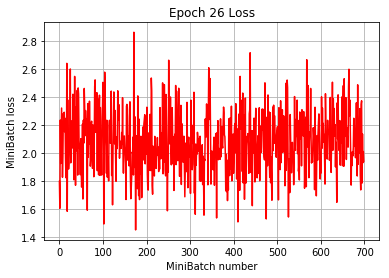

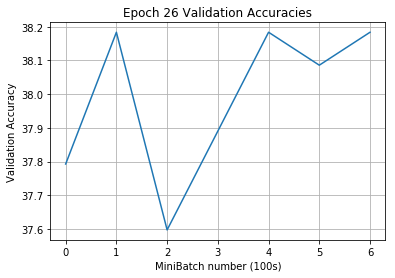

[Epoch 27]
iter:     0, loss min|avg|max: 0.008|1.979| 6.392, val acc: 38.09 %
iter:   100, loss min|avg|max: 0.006|2.228| 8.218, val acc: 38.09 %
iter:   200, loss min|avg|max: 0.089|2.327| 8.345, val acc: 38.09 %
iter:   300, loss min|avg|max: 0.003|2.122| 7.015, val acc: 37.89 %
iter:   400, loss min|avg|max: 0.018|2.122| 8.210, val acc: 38.57 %
iter:   500, loss min|avg|max: 0.039|1.895| 6.503, val acc: 38.38 %
iter:   600, loss min|avg|max: 0.002|1.947| 6.938, val acc: 37.50 %


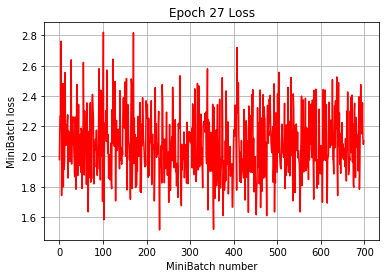

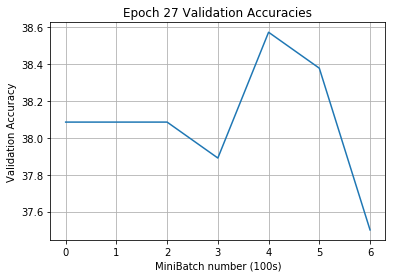

[Epoch 28]
iter:     0, loss min|avg|max: 0.078|1.890| 5.245, val acc: 37.99 %
iter:   100, loss min|avg|max: 0.024|2.077| 5.897, val acc: 38.09 %
iter:   200, loss min|avg|max: 0.016|2.240| 6.772, val acc: 37.89 %
iter:   300, loss min|avg|max: 0.020|2.063| 7.432, val acc: 38.09 %
iter:   400, loss min|avg|max: 0.021|2.305| 7.034, val acc: 37.99 %
iter:   500, loss min|avg|max: 0.011|1.667| 5.676, val acc: 37.50 %
iter:   600, loss min|avg|max: 0.009|1.850| 5.286, val acc: 38.38 %


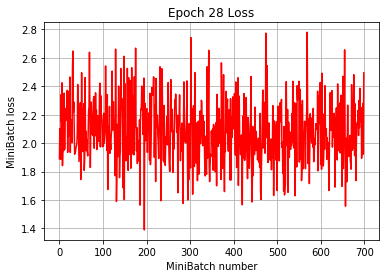

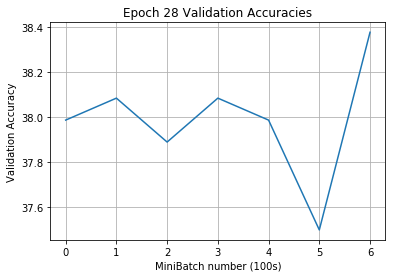

[Epoch 29]
iter:     0, loss min|avg|max: 0.004|2.060|10.222, val acc: 38.09 %
iter:   100, loss min|avg|max: 0.018|2.071| 8.267, val acc: 38.28 %
iter:   200, loss min|avg|max: 0.000|1.840| 8.295, val acc: 38.28 %
iter:   300, loss min|avg|max: 0.008|2.154| 7.699, val acc: 37.79 %
iter:   400, loss min|avg|max: 0.029|1.799| 5.457, val acc: 37.50 %
iter:   500, loss min|avg|max: 0.002|1.956| 6.419, val acc: 38.18 %
iter:   600, loss min|avg|max: 0.004|2.031| 7.487, val acc: 37.99 %


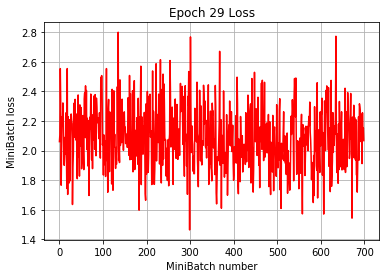

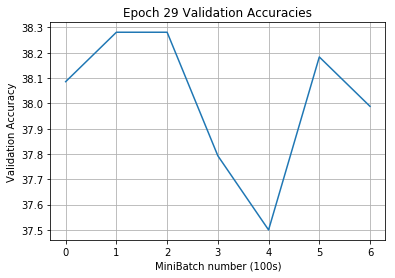

[Epoch 30]
iter:     0, loss min|avg|max: 0.002|1.717| 4.893, val acc: 37.99 %
iter:   100, loss min|avg|max: 0.013|2.124| 7.304, val acc: 38.28 %
iter:   200, loss min|avg|max: 0.006|2.448| 8.901, val acc: 37.89 %
iter:   300, loss min|avg|max: 0.003|2.034| 5.964, val acc: 38.18 %
iter:   400, loss min|avg|max: 0.072|2.248| 6.535, val acc: 37.89 %
iter:   500, loss min|avg|max: 0.003|1.971| 9.712, val acc: 37.99 %
iter:   600, loss min|avg|max: 0.057|2.303| 9.062, val acc: 38.09 %


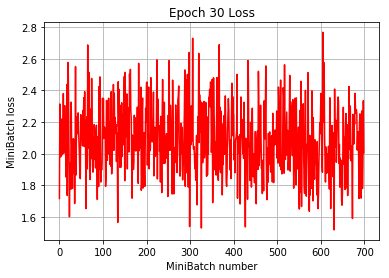

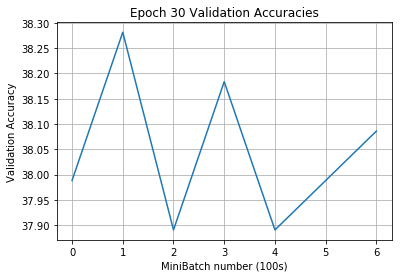

Execution Time: 1743388 ms


In [22]:
cnn4_model = CNN4(NUM_CLASSES)
train(cnn4_model, num_epochs = 30)

In [23]:
test_acc4 = get_accuracy(cnn4_model, X_test, y_test, X_test_iter, y_test_iter)
print ("CNN4 - Test Accuracy: {:.2f} %".format(test_acc4), end="\n\n")

cnn4_model.summary()

CNN4 - Test Accuracy: 38.15 %

Model: "cn_n4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1 (Conv2D)               multiple                  896       
_________________________________________________________________
max_pool1 (MaxPooling2D)     multiple                  0         
_________________________________________________________________
conv2 (Conv2D)               multiple                  18496     
_________________________________________________________________
max_pool2 (MaxPooling2D)     multiple                  0         
_________________________________________________________________
flatten_3 (Flatten)          multiple                  0         
_________________________________________________________________
fc1 (Dense)                  multiple                  2097664   
_________________________________________________________________
bnorm1 (BatchNormalization)  m

### Experiment #5 - CNN5

[Epoch 1]
iter:     0, loss min|avg|max: 3.016|5.400|10.658, val acc: 1.07 %
iter:   100, loss min|avg|max: 0.621|3.567| 7.223, val acc: 16.21 %
iter:   200, loss min|avg|max: 0.099|3.138| 7.553, val acc: 21.97 %
iter:   300, loss min|avg|max: 0.073|3.064| 8.064, val acc: 23.73 %
iter:   400, loss min|avg|max: 0.032|3.005| 7.588, val acc: 26.46 %
iter:   500, loss min|avg|max: 0.078|2.818| 7.992, val acc: 29.10 %
iter:   600, loss min|avg|max: 0.236|3.063| 6.367, val acc: 32.03 %


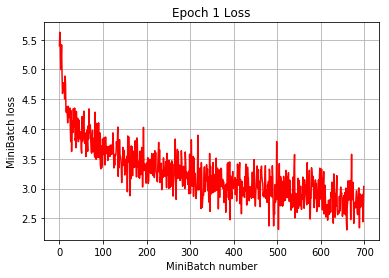

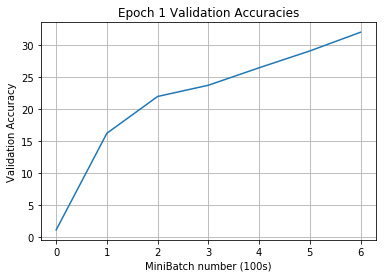

[Epoch 2]
iter:     0, loss min|avg|max: 0.065|2.653| 6.895, val acc: 33.30 %
iter:   100, loss min|avg|max: 0.044|2.837| 9.401, val acc: 33.98 %
iter:   200, loss min|avg|max: 0.004|2.400| 5.139, val acc: 34.57 %
iter:   300, loss min|avg|max: 0.010|2.220| 6.298, val acc: 34.86 %
iter:   400, loss min|avg|max: 0.006|2.106| 8.087, val acc: 34.18 %
iter:   500, loss min|avg|max: 0.027|2.148| 7.463, val acc: 36.04 %
iter:   600, loss min|avg|max: 0.005|1.814| 8.896, val acc: 35.45 %


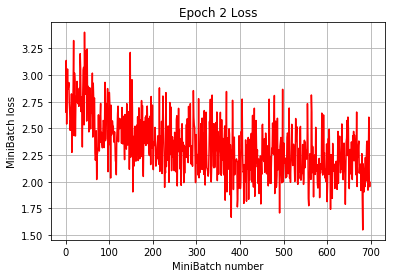

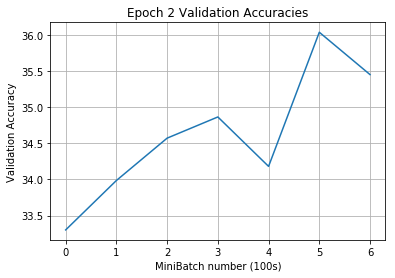

[Epoch 3]
iter:     0, loss min|avg|max: 0.002|2.026| 7.027, val acc: 36.52 %
iter:   100, loss min|avg|max: 0.006|2.459| 8.845, val acc: 38.48 %
iter:   200, loss min|avg|max: 0.029|1.558| 5.562, val acc: 37.99 %
iter:   300, loss min|avg|max: 0.007|1.864| 6.890, val acc: 38.77 %
iter:   400, loss min|avg|max: 0.059|1.642| 5.615, val acc: 38.18 %
iter:   500, loss min|avg|max: 0.003|1.911| 8.081, val acc: 38.28 %
iter:   600, loss min|avg|max: 0.002|1.453| 5.500, val acc: 37.60 %


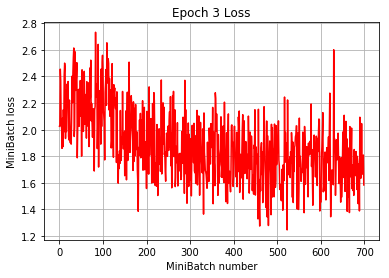

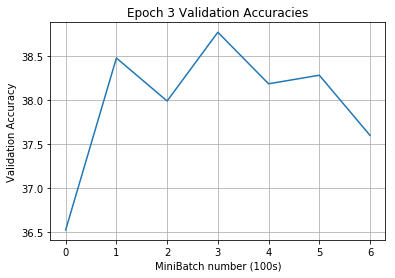

[Epoch 4]
iter:     0, loss min|avg|max: 0.004|2.197| 9.846, val acc: 36.91 %
iter:   100, loss min|avg|max: 0.015|1.574| 7.740, val acc: 38.38 %
iter:   200, loss min|avg|max: 0.001|1.764| 6.493, val acc: 39.26 %
iter:   300, loss min|avg|max: 0.006|1.680| 6.541, val acc: 39.16 %
iter:   400, loss min|avg|max: 0.000|1.542| 6.846, val acc: 38.48 %
iter:   500, loss min|avg|max: 0.043|1.785| 7.811, val acc: 38.18 %
iter:   600, loss min|avg|max: 0.003|1.523| 5.672, val acc: 38.57 %


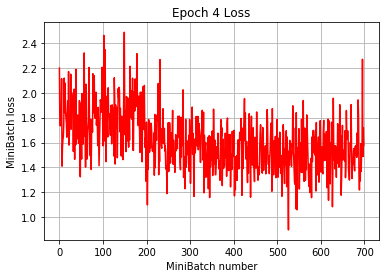

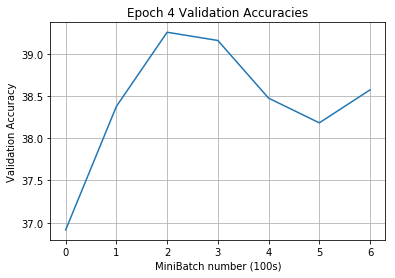

[Epoch 5]
iter:     0, loss min|avg|max: 0.002|1.128| 3.774, val acc: 38.48 %
iter:   100, loss min|avg|max: 0.001|1.466| 5.685, val acc: 38.28 %
iter:   200, loss min|avg|max: 0.003|1.531| 5.364, val acc: 39.06 %
iter:   300, loss min|avg|max: 0.006|1.219| 8.186, val acc: 38.87 %
iter:   400, loss min|avg|max: 0.006|1.231| 6.699, val acc: 38.87 %
iter:   500, loss min|avg|max: 0.001|1.365| 5.045, val acc: 37.99 %
iter:   600, loss min|avg|max: 0.005|1.498| 6.551, val acc: 38.38 %


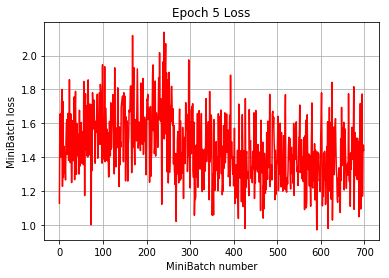

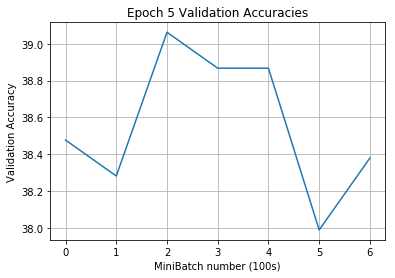

[Epoch 6]
iter:     0, loss min|avg|max: 0.002|1.235| 5.466, val acc: 38.18 %
iter:   100, loss min|avg|max: 0.004|1.673| 6.319, val acc: 38.87 %
iter:   200, loss min|avg|max: 0.021|1.691| 8.021, val acc: 37.70 %
iter:   300, loss min|avg|max: 0.005|1.417| 5.275, val acc: 39.36 %
iter:   400, loss min|avg|max: 0.000|1.380| 6.223, val acc: 38.87 %
iter:   500, loss min|avg|max: 0.001|1.052| 5.279, val acc: 39.55 %
iter:   600, loss min|avg|max: 0.001|1.260| 5.753, val acc: 38.38 %


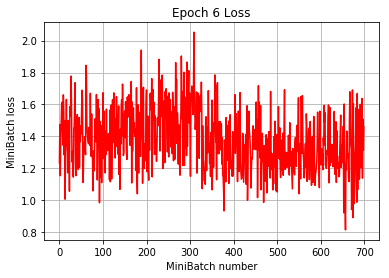

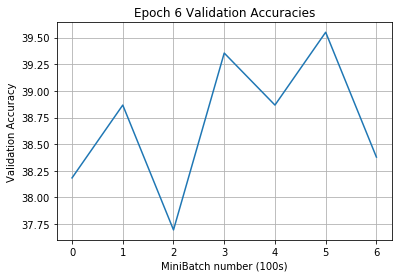

[Epoch 7]
iter:     0, loss min|avg|max: 0.002|1.622| 4.848, val acc: 38.38 %
iter:   100, loss min|avg|max: 0.015|1.546| 7.122, val acc: 37.70 %
iter:   200, loss min|avg|max: 0.004|1.287| 5.968, val acc: 39.45 %
iter:   300, loss min|avg|max: 0.019|1.072| 3.546, val acc: 38.57 %
iter:   400, loss min|avg|max: 0.003|1.004| 3.915, val acc: 39.26 %
iter:   500, loss min|avg|max: 0.002|1.226| 7.483, val acc: 38.48 %
iter:   600, loss min|avg|max: 0.006|1.271| 4.749, val acc: 38.57 %


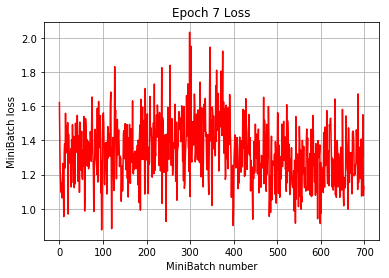

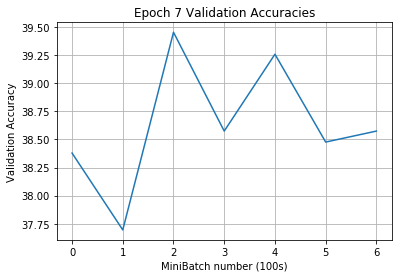

[Epoch 8]
iter:     0, loss min|avg|max: 0.001|1.409| 6.067, val acc: 39.06 %
iter:   100, loss min|avg|max: 0.002|1.282| 6.709, val acc: 38.77 %
iter:   200, loss min|avg|max: 0.002|1.402| 6.792, val acc: 38.77 %
iter:   300, loss min|avg|max: 0.019|1.329| 6.868, val acc: 39.55 %
iter:   400, loss min|avg|max: 0.007|1.624| 4.822, val acc: 38.77 %
iter:   500, loss min|avg|max: 0.012|1.454| 9.186, val acc: 39.45 %
iter:   600, loss min|avg|max: 0.005|1.109| 4.147, val acc: 39.06 %


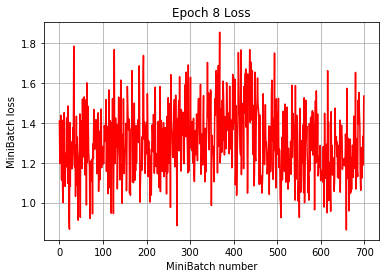

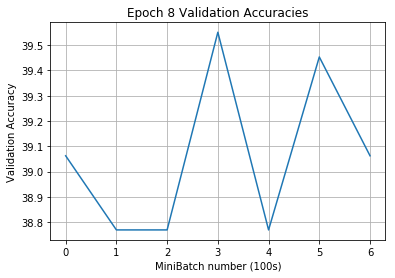

[Epoch 9]
iter:     0, loss min|avg|max: 0.000|1.054| 4.757, val acc: 38.48 %
iter:   100, loss min|avg|max: 0.001|1.241| 6.411, val acc: 38.57 %
iter:   200, loss min|avg|max: 0.001|1.368| 6.887, val acc: 37.89 %
iter:   300, loss min|avg|max: 0.001|1.134| 4.366, val acc: 39.06 %
iter:   400, loss min|avg|max: 0.013|1.461| 6.205, val acc: 38.67 %
iter:   500, loss min|avg|max: 0.000|1.514| 5.064, val acc: 38.77 %
iter:   600, loss min|avg|max: 0.005|1.613| 8.493, val acc: 38.96 %


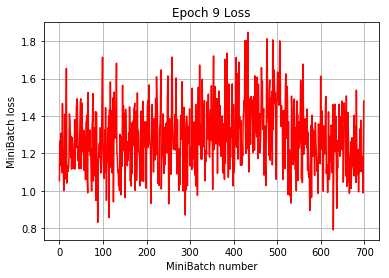

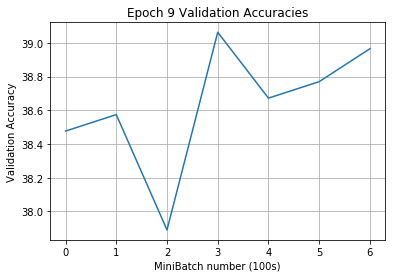

[Epoch 10]
iter:     0, loss min|avg|max: 0.000|1.304| 5.770, val acc: 39.16 %
iter:   100, loss min|avg|max: 0.001|1.139| 4.104, val acc: 38.57 %
iter:   200, loss min|avg|max: 0.012|1.056| 3.914, val acc: 38.77 %
iter:   300, loss min|avg|max: 0.006|1.059| 4.303, val acc: 38.09 %
iter:   400, loss min|avg|max: 0.012|1.053| 6.733, val acc: 39.16 %
iter:   500, loss min|avg|max: 0.003|1.249| 6.832, val acc: 37.99 %
iter:   600, loss min|avg|max: 0.002|1.338| 7.278, val acc: 39.26 %


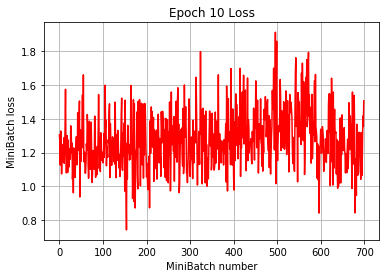

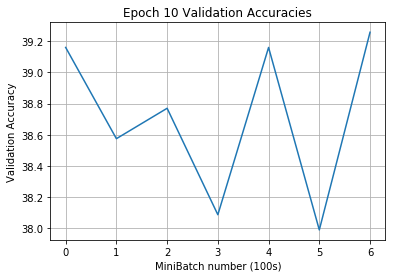

[Epoch 11]
iter:     0, loss min|avg|max: 0.003|1.049| 5.080, val acc: 38.77 %
iter:   100, loss min|avg|max: 0.001|1.125| 5.475, val acc: 38.77 %
iter:   200, loss min|avg|max: 0.004|1.334| 6.963, val acc: 39.45 %
iter:   300, loss min|avg|max: 0.000|1.417| 6.792, val acc: 37.89 %
iter:   400, loss min|avg|max: 0.003|1.292| 6.989, val acc: 38.38 %
iter:   500, loss min|avg|max: 0.017|1.296| 4.939, val acc: 38.67 %
iter:   600, loss min|avg|max: 0.007|1.426| 5.930, val acc: 39.26 %


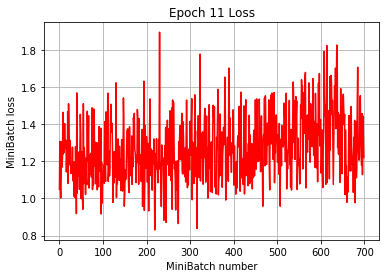

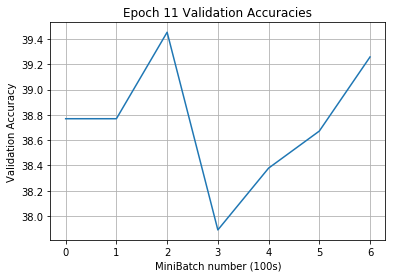

[Epoch 12]
iter:     0, loss min|avg|max: 0.001|1.518| 7.820, val acc: 38.57 %
iter:   100, loss min|avg|max: 0.001|1.169| 7.316, val acc: 39.36 %
iter:   200, loss min|avg|max: 0.001|1.217| 6.248, val acc: 39.06 %
iter:   300, loss min|avg|max: 0.003|0.977| 4.024, val acc: 38.67 %
iter:   400, loss min|avg|max: 0.004|1.408| 7.730, val acc: 38.38 %
iter:   500, loss min|avg|max: 0.003|1.125| 5.067, val acc: 38.57 %
iter:   600, loss min|avg|max: 0.000|1.314| 6.805, val acc: 38.28 %


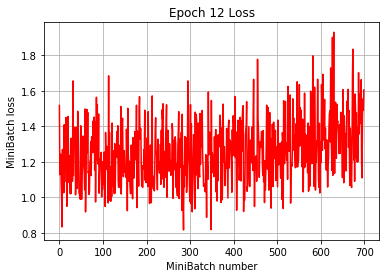

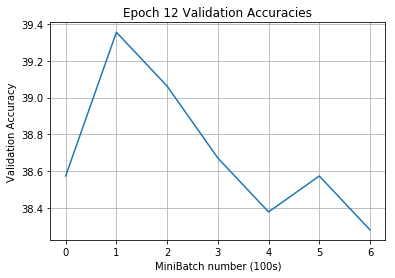

[Epoch 13]
iter:     0, loss min|avg|max: 0.002|1.458| 5.792, val acc: 38.96 %
iter:   100, loss min|avg|max: 0.001|1.420| 4.993, val acc: 39.16 %
iter:   200, loss min|avg|max: 0.003|1.301| 5.868, val acc: 38.67 %
iter:   300, loss min|avg|max: 0.015|1.141| 5.610, val acc: 38.48 %
iter:   400, loss min|avg|max: 0.002|0.987| 3.906, val acc: 37.79 %
iter:   500, loss min|avg|max: 0.016|1.277| 4.013, val acc: 38.18 %
iter:   600, loss min|avg|max: 0.000|1.074| 5.249, val acc: 38.28 %


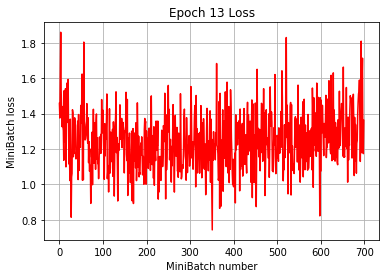

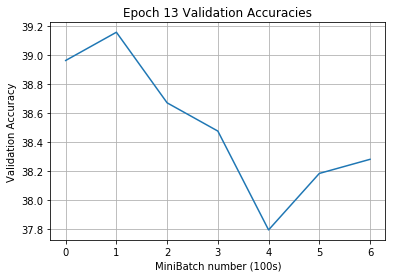

[Epoch 14]
iter:     0, loss min|avg|max: 0.002|1.371| 4.627, val acc: 38.28 %
iter:   100, loss min|avg|max: 0.001|1.323| 6.662, val acc: 38.48 %
iter:   200, loss min|avg|max: 0.013|1.070| 4.129, val acc: 38.48 %
iter:   300, loss min|avg|max: 0.016|1.047| 3.563, val acc: 39.26 %
iter:   400, loss min|avg|max: 0.011|1.262| 5.275, val acc: 39.16 %
iter:   500, loss min|avg|max: 0.006|1.335| 5.340, val acc: 38.67 %
iter:   600, loss min|avg|max: 0.017|1.162| 5.585, val acc: 38.87 %


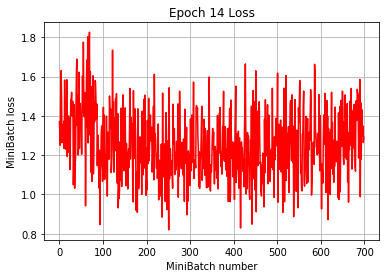

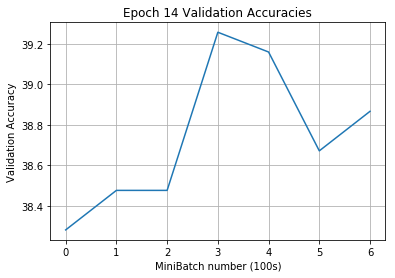

[Epoch 15]
iter:     0, loss min|avg|max: 0.000|1.267| 5.358, val acc: 38.96 %
iter:   100, loss min|avg|max: 0.000|1.338| 4.950, val acc: 38.96 %
iter:   200, loss min|avg|max: 0.001|1.068| 6.274, val acc: 38.09 %
iter:   300, loss min|avg|max: 0.002|1.327| 6.138, val acc: 39.06 %
iter:   400, loss min|avg|max: 0.008|1.189| 6.107, val acc: 38.96 %
iter:   500, loss min|avg|max: 0.000|1.500| 6.510, val acc: 38.38 %
iter:   600, loss min|avg|max: 0.005|1.555| 6.516, val acc: 38.38 %


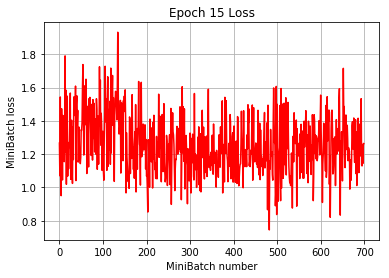

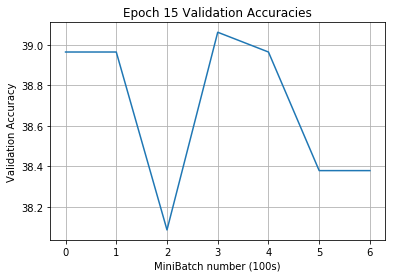

[Epoch 16]
iter:     0, loss min|avg|max: 0.017|1.212| 5.433, val acc: 37.79 %
iter:   100, loss min|avg|max: 0.016|1.496| 6.629, val acc: 38.87 %
iter:   200, loss min|avg|max: 0.011|1.854| 7.434, val acc: 39.36 %
iter:   300, loss min|avg|max: 0.005|1.045| 3.841, val acc: 39.06 %
iter:   400, loss min|avg|max: 0.029|1.280| 8.274, val acc: 38.96 %
iter:   500, loss min|avg|max: 0.019|1.395| 7.261, val acc: 38.38 %
iter:   600, loss min|avg|max: 0.021|1.179| 5.227, val acc: 38.87 %


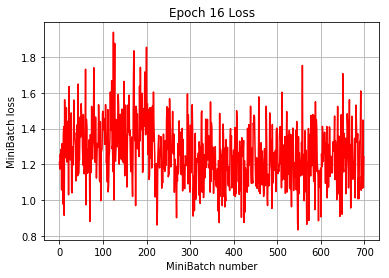

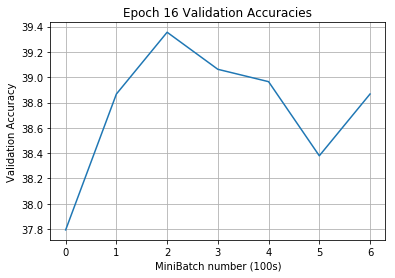

[Epoch 17]
iter:     0, loss min|avg|max: 0.003|1.119| 5.034, val acc: 37.99 %
iter:   100, loss min|avg|max: 0.006|1.217| 3.958, val acc: 38.67 %
iter:   200, loss min|avg|max: 0.005|1.279| 5.252, val acc: 38.57 %
iter:   300, loss min|avg|max: 0.005|1.277| 5.432, val acc: 38.57 %
iter:   400, loss min|avg|max: 0.004|1.133| 4.977, val acc: 38.67 %
iter:   500, loss min|avg|max: 0.002|1.102| 6.560, val acc: 38.57 %
iter:   600, loss min|avg|max: 0.015|1.317| 8.517, val acc: 38.87 %


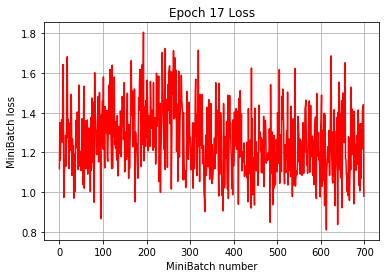

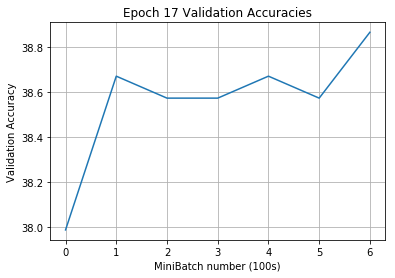

[Epoch 18]
iter:     0, loss min|avg|max: 0.018|1.362| 7.902, val acc: 39.06 %
iter:   100, loss min|avg|max: 0.004|1.144| 4.070, val acc: 38.28 %
iter:   200, loss min|avg|max: 0.003|1.090| 4.953, val acc: 38.96 %
iter:   300, loss min|avg|max: 0.014|1.268| 5.084, val acc: 38.18 %
iter:   400, loss min|avg|max: 0.000|0.879| 4.872, val acc: 38.96 %
iter:   500, loss min|avg|max: 0.031|1.220| 9.979, val acc: 38.77 %
iter:   600, loss min|avg|max: 0.003|1.012| 4.461, val acc: 38.57 %


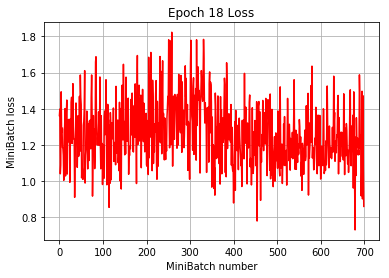

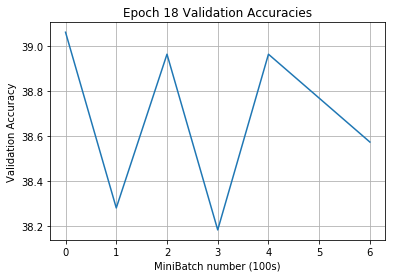

[Epoch 19]
iter:     0, loss min|avg|max: 0.017|1.142| 5.046, val acc: 38.96 %
iter:   100, loss min|avg|max: 0.000|0.951| 5.768, val acc: 38.96 %
iter:   200, loss min|avg|max: 0.004|1.197| 4.489, val acc: 38.09 %
iter:   300, loss min|avg|max: 0.006|1.283| 8.691, val acc: 37.70 %
iter:   400, loss min|avg|max: 0.014|1.303| 7.341, val acc: 39.06 %
iter:   500, loss min|avg|max: 0.004|1.331| 5.569, val acc: 38.77 %
iter:   600, loss min|avg|max: 0.005|1.480| 5.146, val acc: 39.26 %


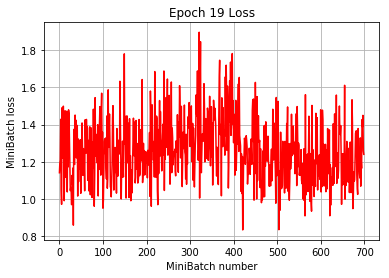

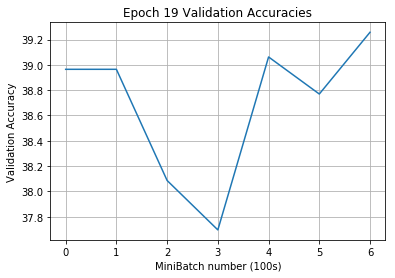

[Epoch 20]
iter:     0, loss min|avg|max: 0.000|1.200| 6.556, val acc: 38.48 %
iter:   100, loss min|avg|max: 0.004|1.203| 6.522, val acc: 38.67 %
iter:   200, loss min|avg|max: 0.011|1.230| 4.193, val acc: 39.06 %
iter:   300, loss min|avg|max: 0.002|1.183| 5.189, val acc: 38.87 %
iter:   400, loss min|avg|max: 0.002|1.342| 6.366, val acc: 38.77 %
iter:   500, loss min|avg|max: 0.000|1.028| 4.814, val acc: 39.16 %
iter:   600, loss min|avg|max: 0.000|1.319| 4.912, val acc: 38.57 %


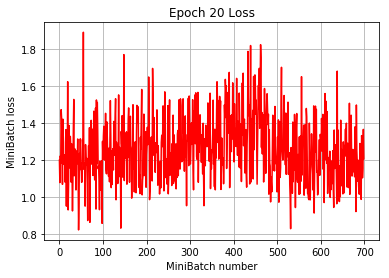

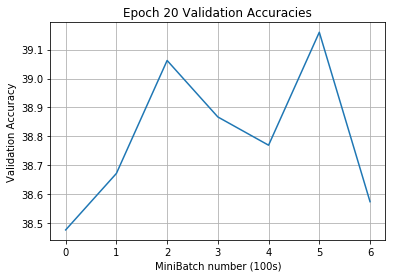

[Epoch 21]
iter:     0, loss min|avg|max: 0.002|1.322| 4.818, val acc: 38.57 %
iter:   100, loss min|avg|max: 0.008|0.991| 4.298, val acc: 38.96 %
iter:   200, loss min|avg|max: 0.006|1.131| 4.934, val acc: 38.77 %
iter:   300, loss min|avg|max: 0.003|1.297| 5.718, val acc: 38.96 %
iter:   400, loss min|avg|max: 0.004|1.270| 4.624, val acc: 38.87 %
iter:   500, loss min|avg|max: 0.000|1.513| 6.565, val acc: 38.38 %
iter:   600, loss min|avg|max: 0.000|1.292| 4.088, val acc: 38.18 %


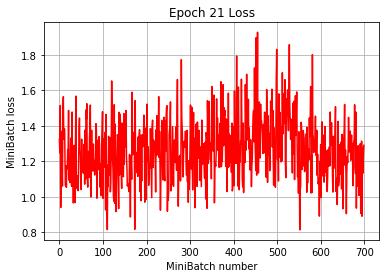

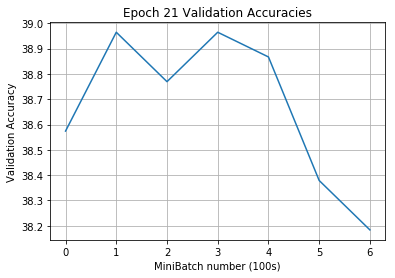

[Epoch 22]
iter:     0, loss min|avg|max: 0.059|1.092| 7.526, val acc: 38.38 %
iter:   100, loss min|avg|max: 0.005|1.178| 5.734, val acc: 39.16 %
iter:   200, loss min|avg|max: 0.004|1.419| 6.532, val acc: 39.36 %
iter:   300, loss min|avg|max: 0.017|1.419| 5.653, val acc: 38.77 %
iter:   400, loss min|avg|max: 0.006|1.300| 6.261, val acc: 37.79 %
iter:   500, loss min|avg|max: 0.002|1.508| 5.588, val acc: 37.89 %
iter:   600, loss min|avg|max: 0.011|1.065| 4.331, val acc: 39.06 %


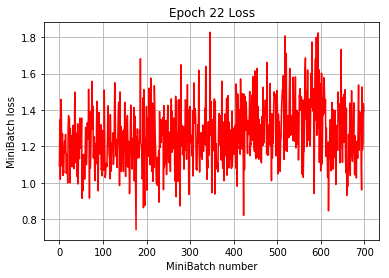

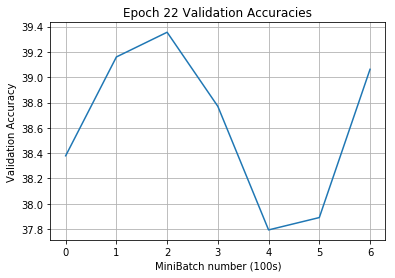

[Epoch 23]
iter:     0, loss min|avg|max: 0.010|1.281| 4.380, val acc: 38.18 %
iter:   100, loss min|avg|max: 0.016|1.093| 3.595, val acc: 38.77 %
iter:   200, loss min|avg|max: 0.001|1.343| 7.893, val acc: 37.79 %
iter:   300, loss min|avg|max: 0.054|1.374| 6.263, val acc: 38.38 %
iter:   400, loss min|avg|max: 0.022|1.273| 5.873, val acc: 38.67 %
iter:   500, loss min|avg|max: 0.003|1.428| 5.840, val acc: 38.48 %
iter:   600, loss min|avg|max: 0.001|1.430| 5.073, val acc: 38.28 %


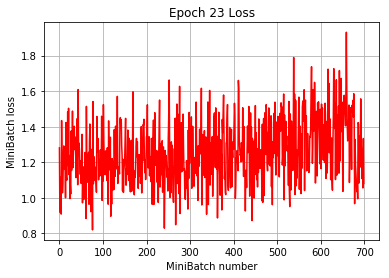

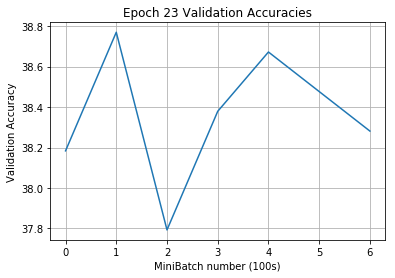

[Epoch 24]
iter:     0, loss min|avg|max: 0.006|1.497| 5.817, val acc: 39.45 %
iter:   100, loss min|avg|max: 0.001|1.305| 5.214, val acc: 38.87 %
iter:   200, loss min|avg|max: 0.019|0.966| 4.596, val acc: 38.48 %
iter:   300, loss min|avg|max: 0.014|1.160| 5.834, val acc: 38.48 %
iter:   400, loss min|avg|max: 0.008|1.257| 6.792, val acc: 38.48 %
iter:   500, loss min|avg|max: 0.008|1.229| 4.902, val acc: 38.28 %
iter:   600, loss min|avg|max: 0.003|1.309| 6.148, val acc: 38.67 %


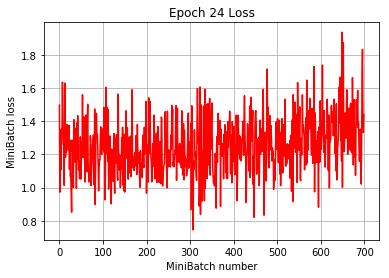

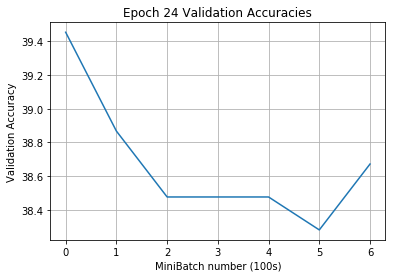

[Epoch 25]
iter:     0, loss min|avg|max: 0.004|0.970| 4.049, val acc: 38.67 %
iter:   100, loss min|avg|max: 0.015|1.443| 9.129, val acc: 38.87 %
iter:   200, loss min|avg|max: 0.000|1.224| 5.392, val acc: 38.57 %
iter:   300, loss min|avg|max: 0.015|1.524| 7.969, val acc: 38.57 %
iter:   400, loss min|avg|max: 0.024|1.249| 7.073, val acc: 38.77 %
iter:   500, loss min|avg|max: 0.016|1.212| 5.810, val acc: 38.09 %
iter:   600, loss min|avg|max: 0.006|1.474| 5.032, val acc: 38.18 %


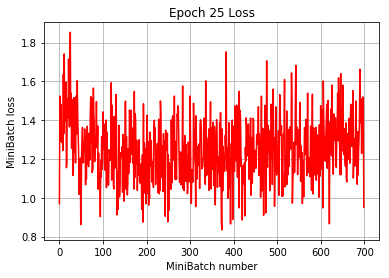

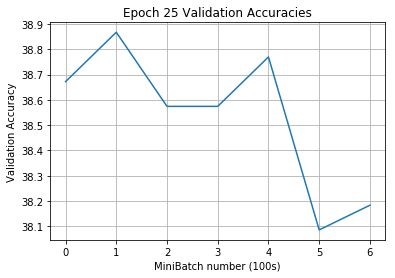

[Epoch 26]
iter:     0, loss min|avg|max: 0.000|1.302| 5.618, val acc: 38.18 %
iter:   100, loss min|avg|max: 0.041|1.189| 5.183, val acc: 39.36 %
iter:   200, loss min|avg|max: 0.010|1.070| 5.332, val acc: 39.36 %
iter:   300, loss min|avg|max: 0.008|1.146| 6.255, val acc: 38.38 %
iter:   400, loss min|avg|max: 0.010|1.100| 5.694, val acc: 38.77 %
iter:   500, loss min|avg|max: 0.004|1.392| 5.552, val acc: 38.77 %
iter:   600, loss min|avg|max: 0.001|1.367| 5.656, val acc: 38.28 %


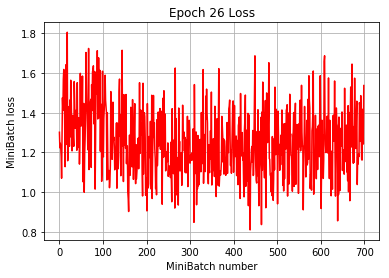

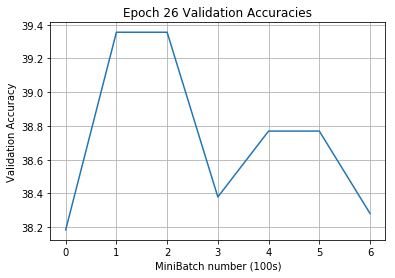

[Epoch 27]
iter:     0, loss min|avg|max: 0.006|1.276| 6.028, val acc: 38.67 %
iter:   100, loss min|avg|max: 0.004|1.347| 7.023, val acc: 37.99 %
iter:   200, loss min|avg|max: 0.003|1.349| 5.376, val acc: 39.45 %
iter:   300, loss min|avg|max: 0.002|1.328| 5.725, val acc: 39.06 %
iter:   400, loss min|avg|max: 0.002|1.179| 5.072, val acc: 38.18 %
iter:   500, loss min|avg|max: 0.001|0.962| 4.616, val acc: 38.48 %
iter:   600, loss min|avg|max: 0.002|1.009| 6.300, val acc: 38.18 %


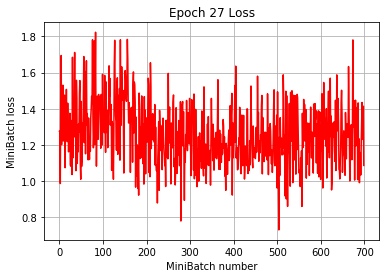

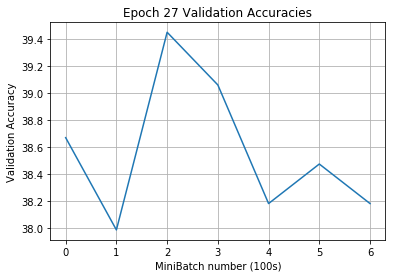

[Epoch 28]
iter:     0, loss min|avg|max: 0.010|1.116| 4.515, val acc: 38.77 %
iter:   100, loss min|avg|max: 0.003|1.334| 8.105, val acc: 38.67 %
iter:   200, loss min|avg|max: 0.012|1.282| 4.981, val acc: 37.99 %
iter:   300, loss min|avg|max: 0.006|1.232| 5.855, val acc: 38.48 %
iter:   400, loss min|avg|max: 0.004|0.989| 5.186, val acc: 37.99 %
iter:   500, loss min|avg|max: 0.002|1.016| 5.546, val acc: 38.96 %
iter:   600, loss min|avg|max: 0.006|1.368| 6.796, val acc: 38.67 %


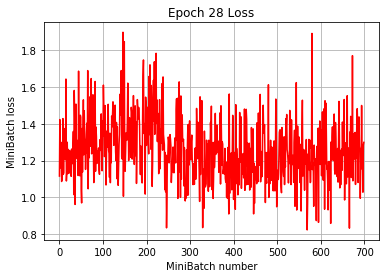

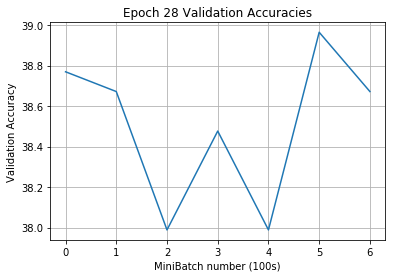

[Epoch 29]
iter:     0, loss min|avg|max: 0.028|1.216| 4.344, val acc: 38.57 %
iter:   100, loss min|avg|max: 0.006|1.526| 6.702, val acc: 38.48 %
iter:   200, loss min|avg|max: 0.008|1.172| 4.488, val acc: 38.09 %
iter:   300, loss min|avg|max: 0.008|1.450| 5.032, val acc: 38.87 %
iter:   400, loss min|avg|max: 0.001|1.238| 8.026, val acc: 38.77 %
iter:   500, loss min|avg|max: 0.000|1.137| 5.487, val acc: 38.87 %
iter:   600, loss min|avg|max: 0.000|1.246| 6.696, val acc: 38.87 %


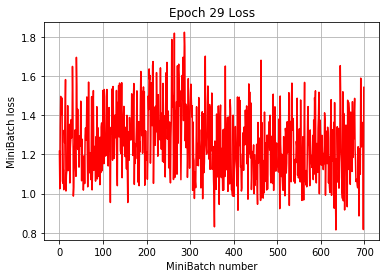

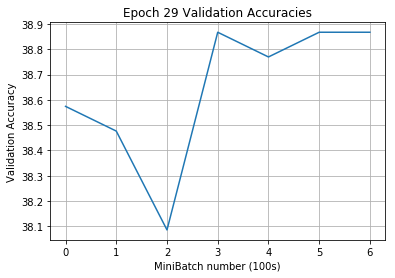

[Epoch 30]
iter:     0, loss min|avg|max: 0.005|1.162| 6.106, val acc: 38.38 %
iter:   100, loss min|avg|max: 0.012|1.225| 7.893, val acc: 38.67 %
iter:   200, loss min|avg|max: 0.000|1.329| 6.588, val acc: 38.87 %
iter:   300, loss min|avg|max: 0.005|1.109| 3.720, val acc: 38.67 %
iter:   400, loss min|avg|max: 0.037|1.343| 5.478, val acc: 38.67 %
iter:   500, loss min|avg|max: 0.037|1.286| 6.633, val acc: 38.28 %
iter:   600, loss min|avg|max: 0.005|1.557| 6.357, val acc: 38.67 %


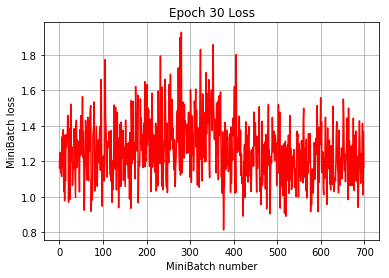

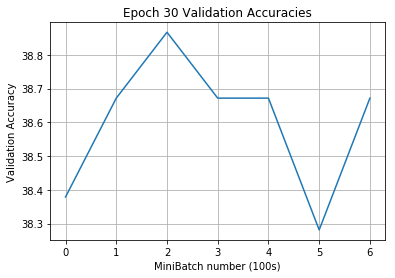

Execution Time: 1794665 ms


In [24]:
cnn5_model = CNN5(NUM_CLASSES)
train(cnn5_model, num_epochs = 30)

In [25]:
test_acc5 = get_accuracy(cnn5_model, X_test, y_test, X_test_iter, y_test_iter)
print ("CNN5 - Test Accuracy: {:.2f} %".format(test_acc5), end="\n\n")

cnn5_model.summary()

CNN5 - Test Accuracy: 39.25 %

Model: "cn_n5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1 (Conv2D)               multiple                  896       
_________________________________________________________________
max_pool1 (MaxPooling2D)     multiple                  0         
_________________________________________________________________
conv2 (Conv2D)               multiple                  18496     
_________________________________________________________________
max_pool2 (MaxPooling2D)     multiple                  0         
_________________________________________________________________
flatten_4 (Flatten)          multiple                  0         
_________________________________________________________________
fc1 (Dense)                  multiple                  2097664   
_________________________________________________________________
bnorm1 (BatchNormalization)  m

### Experiment #6 - CNN6

[Epoch 1]
iter:     0, loss min|avg|max: 1.889|5.408| 9.023, val acc: 1.07 %
iter:   100, loss min|avg|max: 0.408|3.797| 7.040, val acc: 16.31 %
iter:   200, loss min|avg|max: 0.317|3.044| 7.348, val acc: 20.31 %
iter:   300, loss min|avg|max: 0.449|3.295| 6.888, val acc: 25.88 %
iter:   400, loss min|avg|max: 0.230|2.986| 8.735, val acc: 29.79 %
iter:   500, loss min|avg|max: 0.031|2.911| 7.947, val acc: 30.47 %
iter:   600, loss min|avg|max: 0.016|2.694| 7.204, val acc: 30.27 %


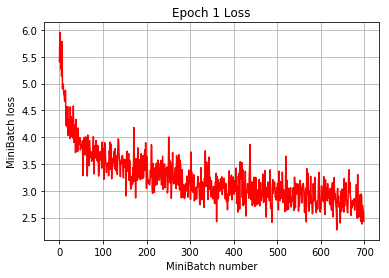

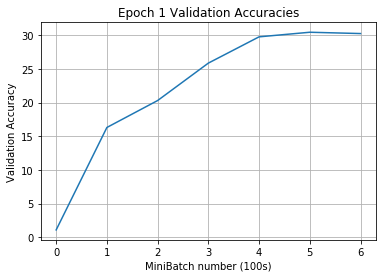

[Epoch 2]
iter:     0, loss min|avg|max: 0.014|2.795| 9.778, val acc: 32.81 %
iter:   100, loss min|avg|max: 0.013|2.535| 8.064, val acc: 33.40 %
iter:   200, loss min|avg|max: 0.021|2.127| 6.492, val acc: 34.47 %
iter:   300, loss min|avg|max: 0.003|1.820| 6.131, val acc: 33.98 %
iter:   400, loss min|avg|max: 0.006|2.121| 8.089, val acc: 36.52 %
iter:   500, loss min|avg|max: 0.041|1.794| 7.848, val acc: 34.86 %
iter:   600, loss min|avg|max: 0.002|1.681| 6.774, val acc: 36.23 %


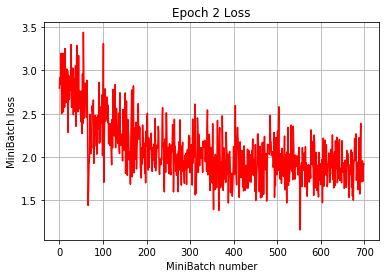

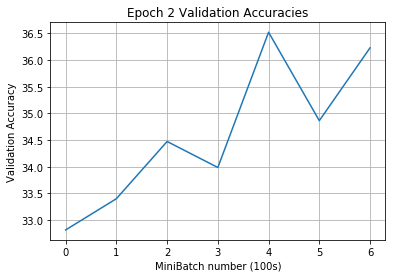

[Epoch 3]
iter:     0, loss min|avg|max: 0.030|1.854| 8.013, val acc: 35.25 %
iter:   100, loss min|avg|max: 0.024|1.900| 6.222, val acc: 37.89 %
iter:   200, loss min|avg|max: 0.005|1.500| 6.858, val acc: 38.09 %
iter:   300, loss min|avg|max: 0.005|1.008| 4.000, val acc: 37.11 %
iter:   400, loss min|avg|max: 0.004|0.968| 4.713, val acc: 36.62 %
iter:   500, loss min|avg|max: 0.000|0.827| 4.255, val acc: 37.70 %
iter:   600, loss min|avg|max: 0.001|1.067| 5.557, val acc: 36.82 %


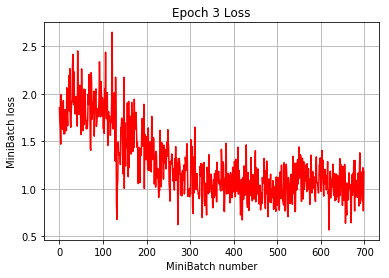

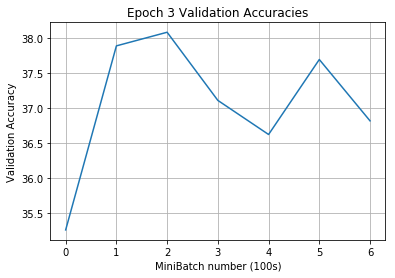

[Epoch 4]
iter:     0, loss min|avg|max: 0.000|1.054| 5.265, val acc: 36.23 %
iter:   100, loss min|avg|max: 0.006|1.097| 5.091, val acc: 36.04 %
iter:   200, loss min|avg|max: 0.000|0.646| 4.839, val acc: 36.82 %
iter:   300, loss min|avg|max: 0.003|0.594| 2.906, val acc: 36.62 %
iter:   400, loss min|avg|max: 0.000|0.437| 2.755, val acc: 37.40 %
iter:   500, loss min|avg|max: 0.000|0.497| 3.690, val acc: 36.62 %
iter:   600, loss min|avg|max: 0.001|0.620| 4.376, val acc: 36.72 %


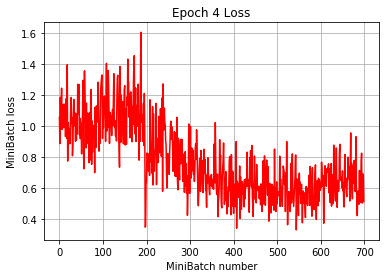

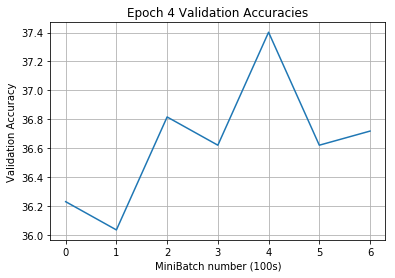

[Epoch 5]
iter:     0, loss min|avg|max: 0.001|0.462| 3.020, val acc: 36.52 %
iter:   100, loss min|avg|max: 0.010|0.751| 6.108, val acc: 36.23 %
iter:   200, loss min|avg|max: 0.000|0.810| 5.158, val acc: 35.25 %
iter:   300, loss min|avg|max: 0.000|0.640| 3.571, val acc: 35.94 %
iter:   400, loss min|avg|max: 0.000|0.697| 5.005, val acc: 36.62 %
iter:   500, loss min|avg|max: 0.000|0.381| 3.246, val acc: 37.11 %
iter:   600, loss min|avg|max: 0.002|0.462| 5.402, val acc: 37.30 %


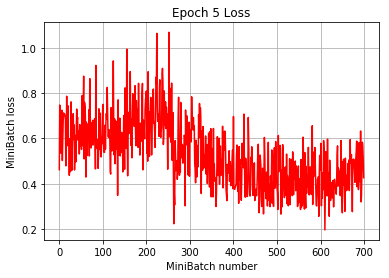

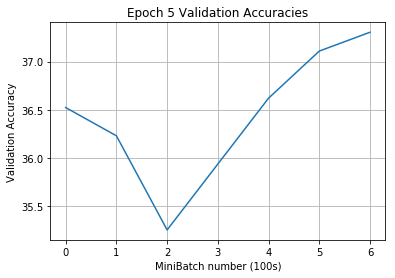

[Epoch 6]
iter:     0, loss min|avg|max: 0.000|0.411| 2.773, val acc: 36.82 %
iter:   100, loss min|avg|max: 0.002|0.530| 2.990, val acc: 36.33 %
iter:   200, loss min|avg|max: 0.000|0.353| 3.127, val acc: 35.55 %
iter:   300, loss min|avg|max: 0.009|0.485| 3.951, val acc: 36.72 %
iter:   400, loss min|avg|max: 0.000|0.327| 2.846, val acc: 36.62 %
iter:   500, loss min|avg|max: 0.002|0.419| 2.788, val acc: 36.72 %
iter:   600, loss min|avg|max: 0.000|0.316| 3.634, val acc: 36.13 %


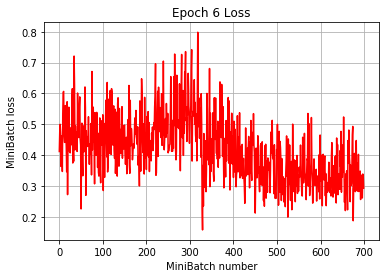

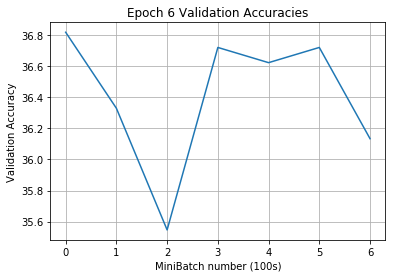

[Epoch 7]
iter:     0, loss min|avg|max: 0.001|0.296| 2.766, val acc: 36.52 %
iter:   100, loss min|avg|max: 0.001|0.609| 6.712, val acc: 35.74 %
iter:   200, loss min|avg|max: 0.000|0.387| 3.391, val acc: 35.45 %
iter:   300, loss min|avg|max: 0.001|0.508| 4.681, val acc: 35.45 %
iter:   400, loss min|avg|max: 0.000|0.332| 3.777, val acc: 36.33 %
iter:   500, loss min|avg|max: 0.001|0.353| 2.573, val acc: 36.04 %
iter:   600, loss min|avg|max: 0.000|0.178| 0.972, val acc: 35.94 %


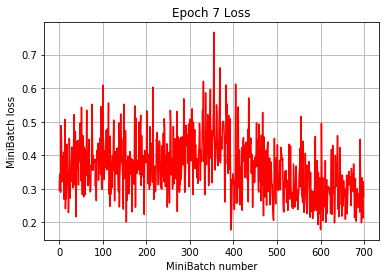

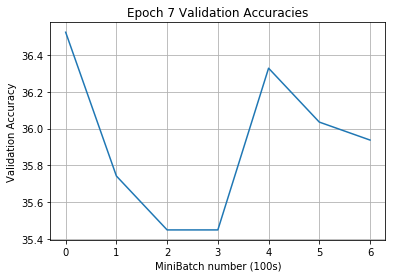

[Epoch 8]
iter:     0, loss min|avg|max: 0.000|0.297| 2.852, val acc: 36.33 %
iter:   100, loss min|avg|max: 0.001|0.358| 2.675, val acc: 37.11 %
iter:   200, loss min|avg|max: 0.006|0.332| 3.171, val acc: 36.13 %
iter:   300, loss min|avg|max: 0.000|0.349| 4.217, val acc: 35.64 %
iter:   400, loss min|avg|max: 0.003|0.256| 1.404, val acc: 36.23 %
iter:   500, loss min|avg|max: 0.007|0.442| 4.240, val acc: 36.13 %
iter:   600, loss min|avg|max: 0.001|0.181| 1.659, val acc: 36.13 %


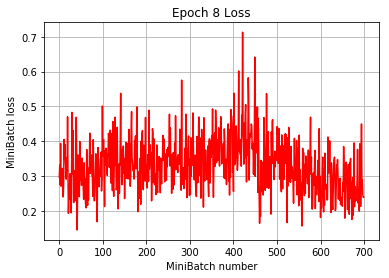

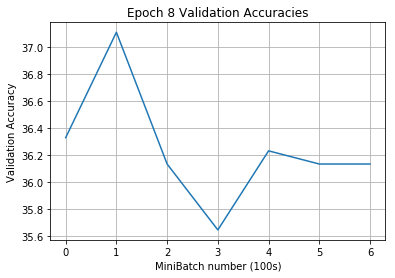

[Epoch 9]
iter:     0, loss min|avg|max: 0.000|0.326| 1.681, val acc: 36.33 %
iter:   100, loss min|avg|max: 0.000|0.278| 3.836, val acc: 36.91 %
iter:   200, loss min|avg|max: 0.000|0.343| 2.662, val acc: 36.52 %
iter:   300, loss min|avg|max: 0.001|0.295| 3.876, val acc: 36.04 %
iter:   400, loss min|avg|max: 0.000|0.320| 2.181, val acc: 36.04 %
iter:   500, loss min|avg|max: 0.007|0.517| 5.620, val acc: 35.74 %
iter:   600, loss min|avg|max: 0.000|0.229| 4.387, val acc: 36.72 %


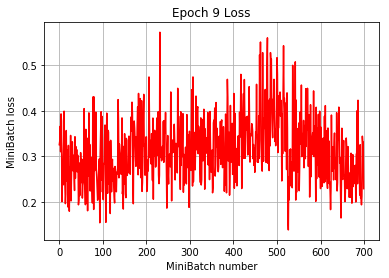

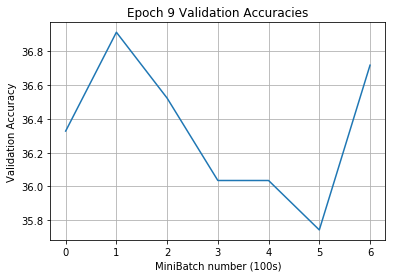

[Epoch 10]
iter:     0, loss min|avg|max: 0.001|0.193| 1.455, val acc: 36.52 %
iter:   100, loss min|avg|max: 0.000|0.310| 2.221, val acc: 35.94 %
iter:   200, loss min|avg|max: 0.000|0.289| 2.692, val acc: 36.43 %
iter:   300, loss min|avg|max: 0.000|0.321| 2.750, val acc: 35.74 %
iter:   400, loss min|avg|max: 0.001|0.326| 3.420, val acc: 36.52 %
iter:   500, loss min|avg|max: 0.000|0.345| 2.430, val acc: 35.74 %
iter:   600, loss min|avg|max: 0.000|0.265| 2.807, val acc: 36.52 %


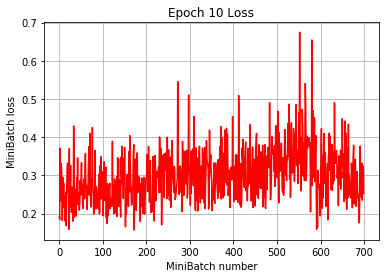

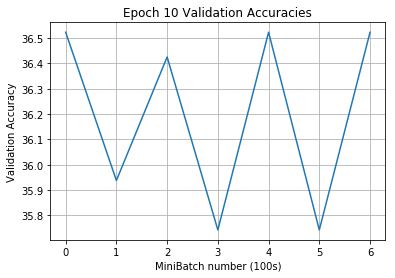

[Epoch 11]
iter:     0, loss min|avg|max: 0.001|0.246| 2.582, val acc: 36.62 %
iter:   100, loss min|avg|max: 0.000|0.322| 3.062, val acc: 35.84 %
iter:   200, loss min|avg|max: 0.000|0.328| 2.603, val acc: 36.04 %
iter:   300, loss min|avg|max: 0.001|0.288| 3.594, val acc: 36.23 %
iter:   400, loss min|avg|max: 0.001|0.287| 2.895, val acc: 35.74 %
iter:   500, loss min|avg|max: 0.001|0.278| 2.304, val acc: 35.74 %
iter:   600, loss min|avg|max: 0.001|0.267| 2.092, val acc: 36.91 %


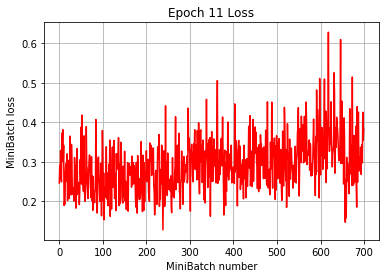

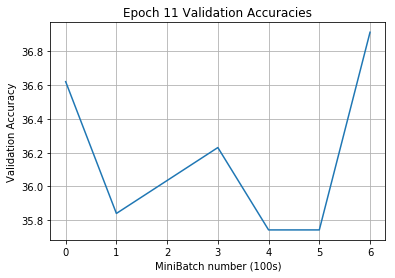

[Epoch 12]
iter:     0, loss min|avg|max: 0.000|0.282| 2.631, val acc: 36.62 %
iter:   100, loss min|avg|max: 0.000|0.290| 2.155, val acc: 35.35 %
iter:   200, loss min|avg|max: 0.001|0.302| 4.510, val acc: 36.43 %
iter:   300, loss min|avg|max: 0.001|0.259| 1.993, val acc: 36.33 %
iter:   400, loss min|avg|max: 0.004|0.226| 1.620, val acc: 35.94 %
iter:   500, loss min|avg|max: 0.001|0.234| 2.422, val acc: 36.52 %
iter:   600, loss min|avg|max: 0.000|0.357| 3.550, val acc: 35.84 %


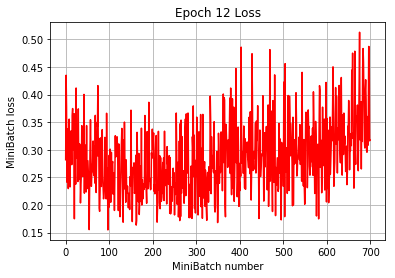

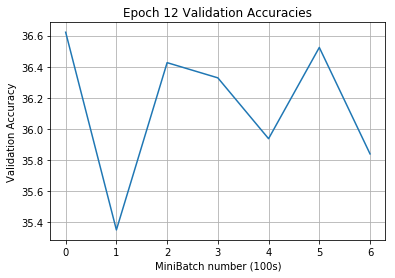

[Epoch 13]
iter:     0, loss min|avg|max: 0.000|0.363| 2.750, val acc: 36.43 %
iter:   100, loss min|avg|max: 0.000|0.197| 1.532, val acc: 36.13 %
iter:   200, loss min|avg|max: 0.001|0.287| 3.024, val acc: 36.43 %
iter:   300, loss min|avg|max: 0.002|0.271| 3.424, val acc: 36.23 %
iter:   400, loss min|avg|max: 0.001|0.232| 1.651, val acc: 36.33 %
iter:   500, loss min|avg|max: 0.001|0.260| 2.078, val acc: 35.94 %
iter:   600, loss min|avg|max: 0.003|0.291| 3.919, val acc: 36.33 %


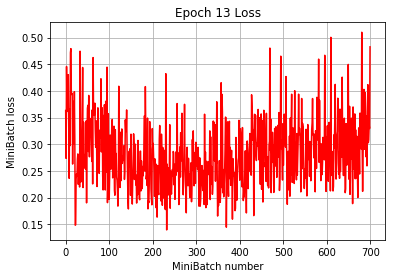

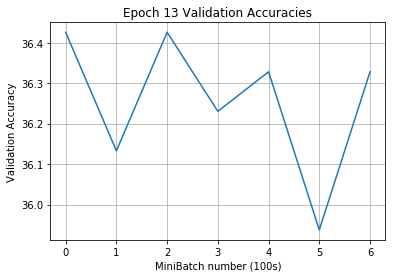

[Epoch 14]
iter:     0, loss min|avg|max: 0.000|0.302| 4.530, val acc: 36.04 %
iter:   100, loss min|avg|max: 0.000|0.342| 4.187, val acc: 36.72 %
iter:   200, loss min|avg|max: 0.000|0.321| 3.824, val acc: 36.23 %
iter:   300, loss min|avg|max: 0.000|0.162| 1.274, val acc: 35.84 %
iter:   400, loss min|avg|max: 0.001|0.252| 2.047, val acc: 36.04 %
iter:   500, loss min|avg|max: 0.000|0.314| 2.904, val acc: 35.74 %
iter:   600, loss min|avg|max: 0.000|0.455| 4.898, val acc: 36.23 %


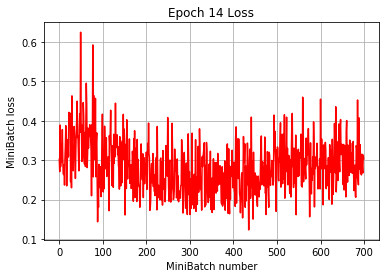

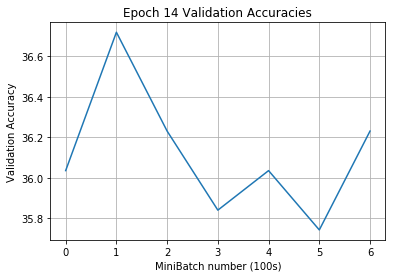

[Epoch 15]
iter:     0, loss min|avg|max: 0.000|0.294| 2.889, val acc: 36.43 %
iter:   100, loss min|avg|max: 0.001|0.329| 2.203, val acc: 36.62 %
iter:   200, loss min|avg|max: 0.000|0.245| 1.824, val acc: 36.43 %
iter:   300, loss min|avg|max: 0.000|0.181| 1.327, val acc: 35.45 %
iter:   400, loss min|avg|max: 0.001|0.221| 2.507, val acc: 35.84 %
iter:   500, loss min|avg|max: 0.002|0.143| 0.655, val acc: 35.74 %
iter:   600, loss min|avg|max: 0.001|0.453| 4.421, val acc: 35.84 %


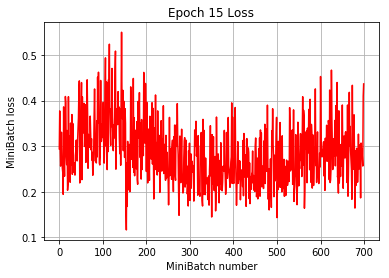

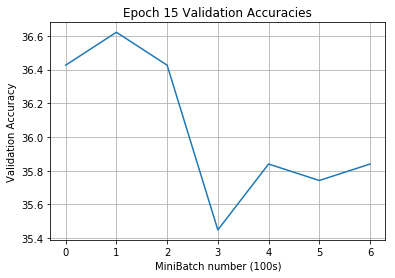

[Epoch 16]
iter:     0, loss min|avg|max: 0.001|0.186| 1.250, val acc: 36.23 %
iter:   100, loss min|avg|max: 0.001|0.342| 2.874, val acc: 36.43 %
iter:   200, loss min|avg|max: 0.004|0.386| 3.144, val acc: 36.23 %
iter:   300, loss min|avg|max: 0.000|0.327| 3.478, val acc: 36.23 %
iter:   400, loss min|avg|max: 0.001|0.238| 1.693, val acc: 36.43 %
iter:   500, loss min|avg|max: 0.000|0.242| 2.415, val acc: 35.94 %
iter:   600, loss min|avg|max: 0.000|0.263| 2.275, val acc: 36.33 %


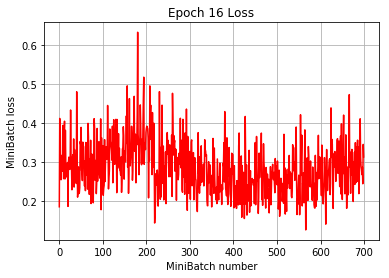

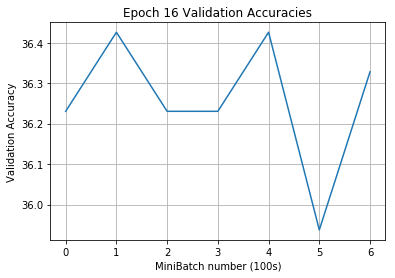

[Epoch 17]
iter:     0, loss min|avg|max: 0.000|0.353| 5.420, val acc: 35.84 %
iter:   100, loss min|avg|max: 0.002|0.295| 4.312, val acc: 35.45 %
iter:   200, loss min|avg|max: 0.000|0.298| 1.830, val acc: 35.74 %
iter:   300, loss min|avg|max: 0.001|0.248| 1.774, val acc: 36.13 %
iter:   400, loss min|avg|max: 0.000|0.323| 2.658, val acc: 36.62 %
iter:   500, loss min|avg|max: 0.001|0.170| 1.713, val acc: 36.13 %
iter:   600, loss min|avg|max: 0.000|0.211| 1.394, val acc: 36.13 %


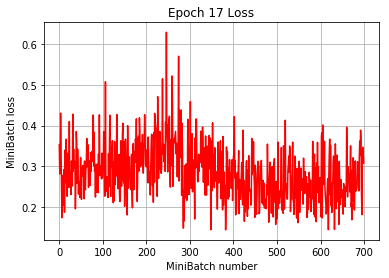

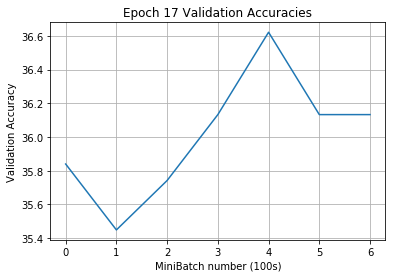

[Epoch 18]
iter:     0, loss min|avg|max: 0.001|0.260| 1.665, val acc: 36.04 %
iter:   100, loss min|avg|max: 0.001|0.326| 2.621, val acc: 36.33 %
iter:   200, loss min|avg|max: 0.001|0.248| 2.020, val acc: 36.13 %
iter:   300, loss min|avg|max: 0.000|0.268| 2.626, val acc: 36.52 %
iter:   400, loss min|avg|max: 0.000|0.199| 1.649, val acc: 35.84 %
iter:   500, loss min|avg|max: 0.001|0.222| 1.612, val acc: 35.84 %
iter:   600, loss min|avg|max: 0.000|0.260| 3.733, val acc: 36.04 %


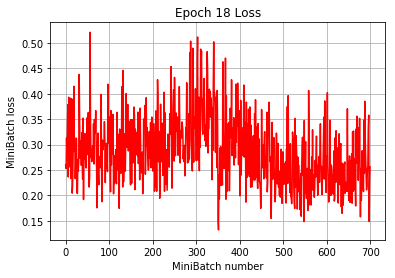

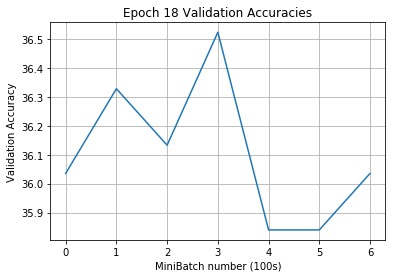

[Epoch 19]
iter:     0, loss min|avg|max: 0.000|0.327| 4.292, val acc: 35.55 %
iter:   100, loss min|avg|max: 0.000|0.232| 1.917, val acc: 35.64 %
iter:   200, loss min|avg|max: 0.001|0.313| 2.303, val acc: 36.04 %
iter:   300, loss min|avg|max: 0.002|0.277| 2.056, val acc: 36.13 %
iter:   400, loss min|avg|max: 0.001|0.357| 2.762, val acc: 36.33 %
iter:   500, loss min|avg|max: 0.001|0.337| 3.158, val acc: 36.13 %
iter:   600, loss min|avg|max: 0.000|0.193| 1.328, val acc: 36.13 %


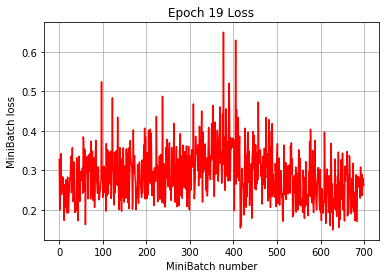

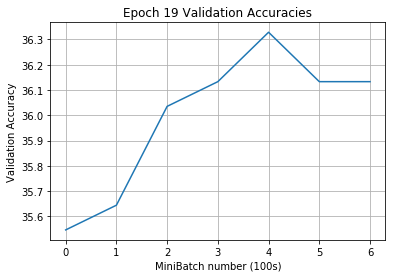

[Epoch 20]
iter:     0, loss min|avg|max: 0.000|0.199| 1.457, val acc: 36.13 %
iter:   100, loss min|avg|max: 0.001|0.361| 3.148, val acc: 36.72 %
iter:   200, loss min|avg|max: 0.000|0.404| 5.447, val acc: 35.64 %
iter:   300, loss min|avg|max: 0.000|0.326| 1.730, val acc: 36.23 %
iter:   400, loss min|avg|max: 0.000|0.272| 2.784, val acc: 36.23 %
iter:   500, loss min|avg|max: 0.000|0.343| 1.852, val acc: 36.23 %
iter:   600, loss min|avg|max: 0.000|0.282| 2.147, val acc: 36.43 %


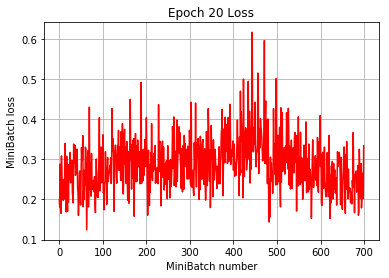

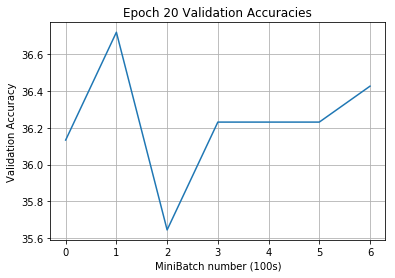

[Epoch 21]
iter:     0, loss min|avg|max: 0.003|0.197| 1.420, val acc: 36.82 %
iter:   100, loss min|avg|max: 0.003|0.350| 3.903, val acc: 36.33 %
iter:   200, loss min|avg|max: 0.001|0.290| 1.704, val acc: 35.94 %
iter:   300, loss min|avg|max: 0.003|0.185| 1.223, val acc: 36.13 %
iter:   400, loss min|avg|max: 0.001|0.320| 2.848, val acc: 35.74 %
iter:   500, loss min|avg|max: 0.000|0.505| 4.211, val acc: 36.62 %
iter:   600, loss min|avg|max: 0.003|0.269| 2.783, val acc: 36.13 %


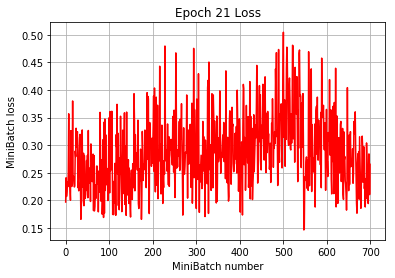

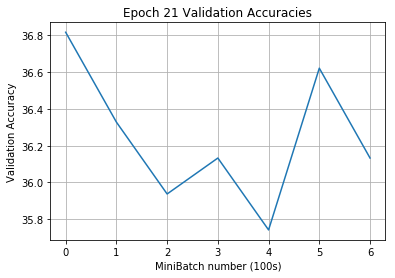

[Epoch 22]
iter:     0, loss min|avg|max: 0.000|0.214| 1.129, val acc: 35.84 %
iter:   100, loss min|avg|max: 0.001|0.225| 1.475, val acc: 36.52 %
iter:   200, loss min|avg|max: 0.000|0.319| 3.581, val acc: 35.16 %
iter:   300, loss min|avg|max: 0.001|0.320| 3.269, val acc: 36.13 %
iter:   400, loss min|avg|max: 0.004|0.314| 3.433, val acc: 36.72 %
iter:   500, loss min|avg|max: 0.000|0.242| 1.802, val acc: 36.04 %
iter:   600, loss min|avg|max: 0.001|0.388| 2.843, val acc: 36.43 %


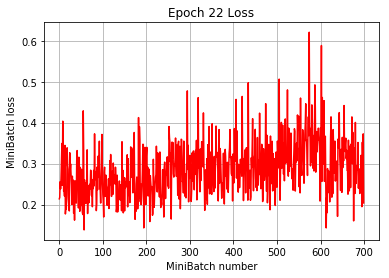

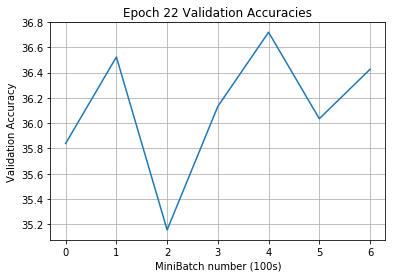

[Epoch 23]
iter:     0, loss min|avg|max: 0.004|0.328| 4.011, val acc: 36.33 %
iter:   100, loss min|avg|max: 0.001|0.219| 1.456, val acc: 35.74 %
iter:   200, loss min|avg|max: 0.000|0.183| 1.407, val acc: 36.52 %
iter:   300, loss min|avg|max: 0.002|0.161| 1.108, val acc: 35.94 %
iter:   400, loss min|avg|max: 0.001|0.156| 1.038, val acc: 35.94 %
iter:   500, loss min|avg|max: 0.001|0.346| 2.938, val acc: 35.84 %
iter:   600, loss min|avg|max: 0.001|0.269| 1.781, val acc: 36.52 %


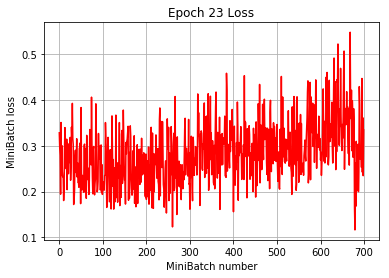

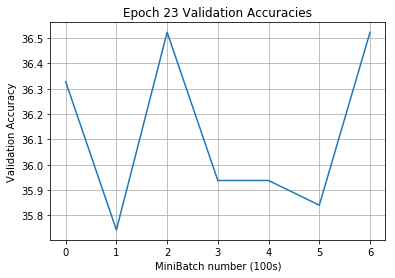

[Epoch 24]
iter:     0, loss min|avg|max: 0.001|0.281| 3.100, val acc: 36.33 %
iter:   100, loss min|avg|max: 0.000|0.148| 0.768, val acc: 36.33 %
iter:   200, loss min|avg|max: 0.000|0.220| 3.514, val acc: 36.33 %
iter:   300, loss min|avg|max: 0.000|0.270| 2.334, val acc: 36.23 %
iter:   400, loss min|avg|max: 0.000|0.248| 2.414, val acc: 36.52 %
iter:   500, loss min|avg|max: 0.001|0.334| 2.608, val acc: 36.04 %
iter:   600, loss min|avg|max: 0.000|0.320| 3.809, val acc: 36.04 %


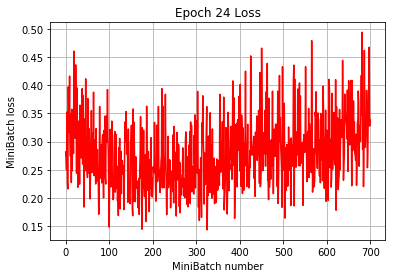

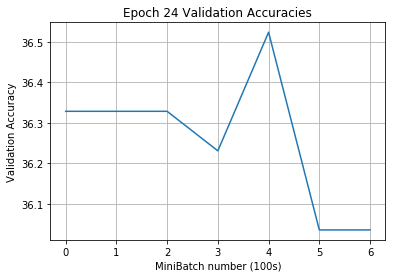

[Epoch 25]
iter:     0, loss min|avg|max: 0.000|0.371| 3.315, val acc: 36.13 %
iter:   100, loss min|avg|max: 0.004|0.322| 3.911, val acc: 35.84 %
iter:   200, loss min|avg|max: 0.000|0.230| 2.774, val acc: 35.94 %
iter:   300, loss min|avg|max: 0.001|0.286| 3.115, val acc: 36.72 %
iter:   400, loss min|avg|max: 0.000|0.277| 3.120, val acc: 35.55 %
iter:   500, loss min|avg|max: 0.001|0.199| 1.804, val acc: 36.23 %
iter:   600, loss min|avg|max: 0.001|0.336| 3.726, val acc: 36.23 %


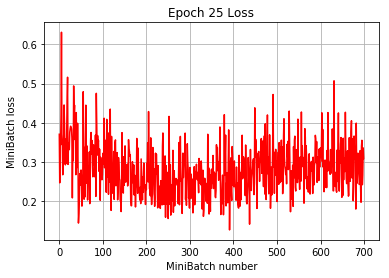

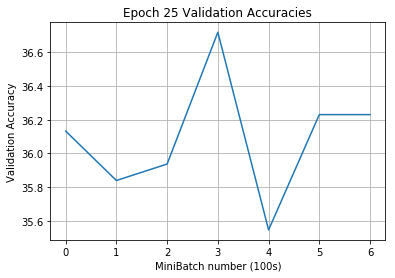

[Epoch 26]
iter:     0, loss min|avg|max: 0.003|0.367| 3.588, val acc: 36.82 %
iter:   100, loss min|avg|max: 0.001|0.263| 2.302, val acc: 36.23 %
iter:   200, loss min|avg|max: 0.000|0.193| 1.289, val acc: 36.23 %
iter:   300, loss min|avg|max: 0.000|0.195| 1.777, val acc: 36.43 %
iter:   400, loss min|avg|max: 0.001|0.253| 3.519, val acc: 36.23 %
iter:   500, loss min|avg|max: 0.000|0.321| 4.329, val acc: 35.94 %
iter:   600, loss min|avg|max: 0.000|0.243| 1.502, val acc: 35.64 %


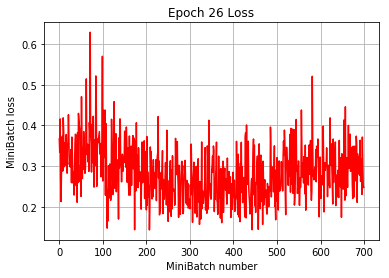

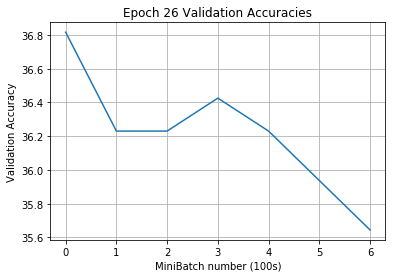

[Epoch 27]
iter:     0, loss min|avg|max: 0.004|0.244| 1.691, val acc: 36.52 %
iter:   100, loss min|avg|max: 0.001|0.285| 2.197, val acc: 36.52 %
iter:   200, loss min|avg|max: 0.002|0.343| 2.248, val acc: 36.13 %
iter:   300, loss min|avg|max: 0.000|0.237| 1.735, val acc: 36.04 %
iter:   400, loss min|avg|max: 0.002|0.273| 3.804, val acc: 36.13 %
iter:   500, loss min|avg|max: 0.001|0.351| 2.187, val acc: 35.74 %
iter:   600, loss min|avg|max: 0.000|0.237| 1.470, val acc: 36.13 %


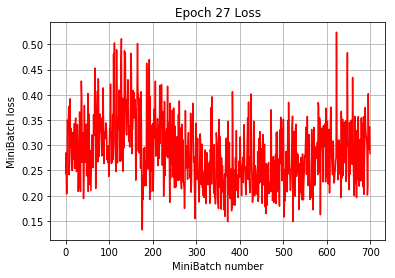

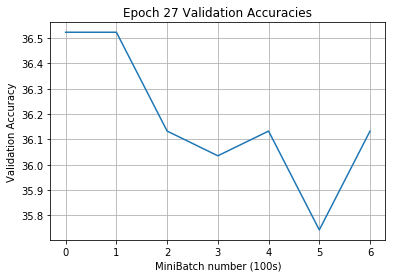

[Epoch 28]
iter:     0, loss min|avg|max: 0.005|0.271| 1.748, val acc: 36.04 %
iter:   100, loss min|avg|max: 0.001|0.210| 1.484, val acc: 36.52 %
iter:   200, loss min|avg|max: 0.000|0.442| 4.104, val acc: 35.64 %
iter:   300, loss min|avg|max: 0.006|0.434| 6.119, val acc: 36.23 %
iter:   400, loss min|avg|max: 0.000|0.373| 4.282, val acc: 35.84 %
iter:   500, loss min|avg|max: 0.000|0.318| 2.647, val acc: 36.43 %
iter:   600, loss min|avg|max: 0.001|0.246| 2.225, val acc: 36.04 %


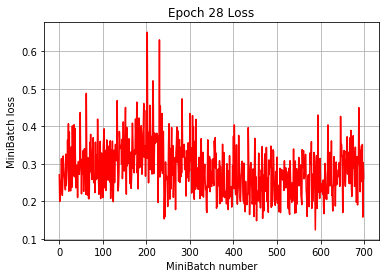

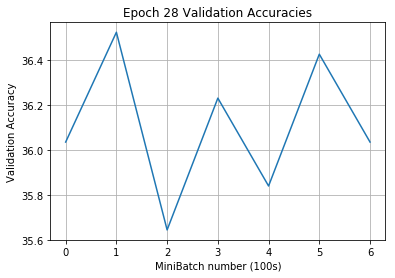

[Epoch 29]
iter:     0, loss min|avg|max: 0.002|0.364| 3.766, val acc: 36.33 %
iter:   100, loss min|avg|max: 0.003|0.381| 4.051, val acc: 35.74 %
iter:   200, loss min|avg|max: 0.003|0.270| 1.957, val acc: 36.33 %
iter:   300, loss min|avg|max: 0.003|0.289| 2.667, val acc: 36.52 %
iter:   400, loss min|avg|max: 0.000|0.247| 2.718, val acc: 36.52 %
iter:   500, loss min|avg|max: 0.001|0.367| 2.966, val acc: 36.43 %
iter:   600, loss min|avg|max: 0.000|0.179| 1.282, val acc: 36.04 %


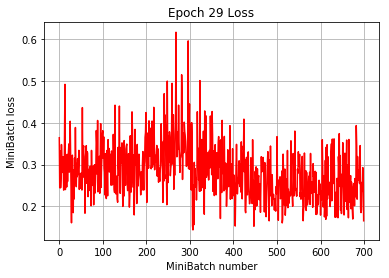

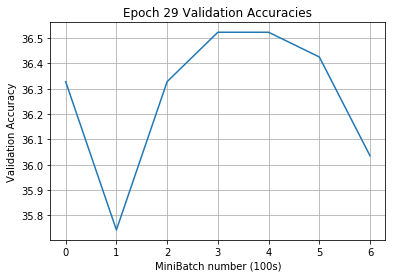

[Epoch 30]
iter:     0, loss min|avg|max: 0.000|0.210| 3.007, val acc: 36.33 %
iter:   100, loss min|avg|max: 0.002|0.287| 2.968, val acc: 35.84 %
iter:   200, loss min|avg|max: 0.000|0.207| 1.314, val acc: 36.13 %
iter:   300, loss min|avg|max: 0.001|0.384| 5.094, val acc: 36.13 %
iter:   400, loss min|avg|max: 0.001|0.363| 4.448, val acc: 36.04 %
iter:   500, loss min|avg|max: 0.001|0.315| 5.269, val acc: 35.74 %
iter:   600, loss min|avg|max: 0.000|0.256| 1.483, val acc: 36.43 %


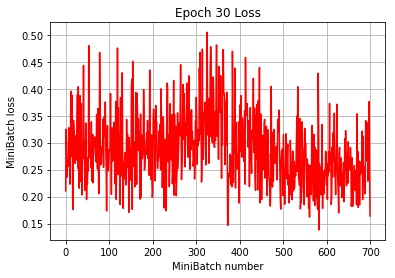

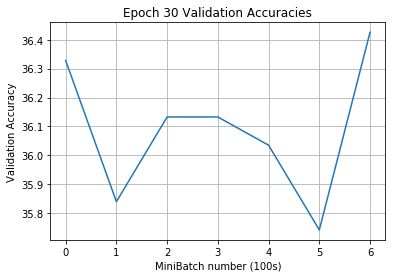

Execution Time: 6470321 ms


In [26]:
cnn6_model = CNN6(NUM_CLASSES)
train(cnn6_model, num_epochs = 30)

In [27]:
test_acc6 = get_accuracy(cnn6_model, X_test, y_test, X_test_iter, y_test_iter)
print ("CNN6 - Test Accuracy: {:.2f} %".format(test_acc6), end="\n\n")

cnn6_model.summary()

CNN6 - Test Accuracy: 35.04 %

Model: "cn_n6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1 (Conv2D)               multiple                  896       
_________________________________________________________________
bnorm1 (BatchNormalization)  multiple                  128       
_________________________________________________________________
conv2 (Conv2D)               multiple                  18496     
_________________________________________________________________
bnorm2 (BatchNormalization)  multiple                  128       
_________________________________________________________________
max_pool1 (MaxPooling2D)     multiple                  0         
_________________________________________________________________
flatten_5 (Flatten)          multiple                  0         
_________________________________________________________________
fc1 (Dense)                  m

### Experiment #7 - CNN7

[Epoch 1]
iter:     0, loss min|avg|max: 2.853|5.394|10.614, val acc: 0.88 %
iter:   100, loss min|avg|max: 1.142|3.650| 6.607, val acc: 8.40 %
iter:   200, loss min|avg|max: 1.310|3.671| 6.252, val acc: 10.64 %
iter:   300, loss min|avg|max: 0.232|3.069| 5.512, val acc: 15.04 %
iter:   400, loss min|avg|max: 0.178|3.055| 7.202, val acc: 16.41 %
iter:   500, loss min|avg|max: 0.619|3.381|12.105, val acc: 19.73 %
iter:   600, loss min|avg|max: 0.740|3.060| 7.201, val acc: 23.05 %


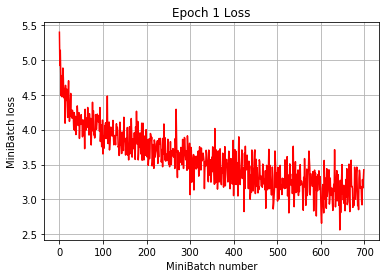

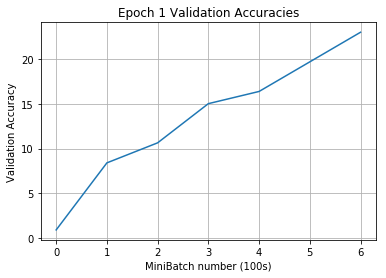

[Epoch 2]
iter:     0, loss min|avg|max: 0.182|2.641| 6.379, val acc: 24.90 %
iter:   100, loss min|avg|max: 0.318|3.047| 8.539, val acc: 24.80 %
iter:   200, loss min|avg|max: 0.340|2.755| 9.730, val acc: 27.73 %
iter:   300, loss min|avg|max: 0.385|2.887| 7.553, val acc: 29.88 %
iter:   400, loss min|avg|max: 0.116|2.934| 6.269, val acc: 29.59 %
iter:   500, loss min|avg|max: 0.101|2.325| 5.701, val acc: 31.64 %
iter:   600, loss min|avg|max: 0.052|2.432| 7.545, val acc: 31.05 %


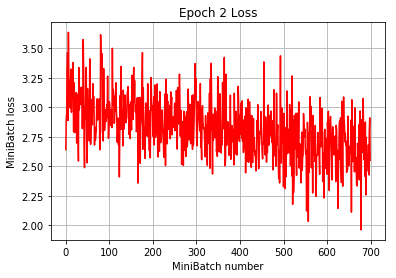

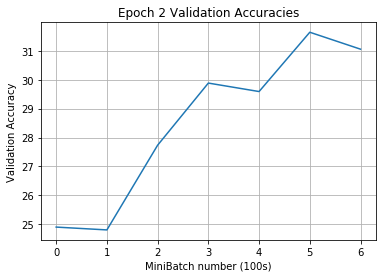

[Epoch 3]
iter:     0, loss min|avg|max: 0.069|2.455| 5.611, val acc: 33.79 %
iter:   100, loss min|avg|max: 0.436|2.442| 6.304, val acc: 35.74 %
iter:   200, loss min|avg|max: 0.037|2.595| 6.403, val acc: 33.98 %
iter:   300, loss min|avg|max: 0.170|2.554| 8.905, val acc: 34.28 %
iter:   400, loss min|avg|max: 0.093|2.909| 7.850, val acc: 33.30 %
iter:   500, loss min|avg|max: 0.052|2.121| 5.603, val acc: 38.18 %
iter:   600, loss min|avg|max: 0.040|2.436| 8.758, val acc: 37.11 %


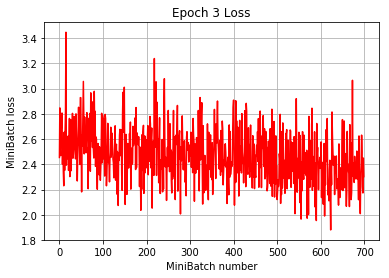

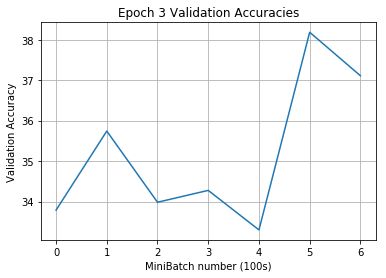

[Epoch 4]
iter:     0, loss min|avg|max: 0.094|2.557| 7.128, val acc: 36.62 %
iter:   100, loss min|avg|max: 0.113|2.428| 9.386, val acc: 37.11 %
iter:   200, loss min|avg|max: 0.071|2.107| 7.279, val acc: 40.14 %
iter:   300, loss min|avg|max: 0.013|2.424| 6.182, val acc: 38.96 %
iter:   400, loss min|avg|max: 0.040|2.309| 7.775, val acc: 37.99 %
iter:   500, loss min|avg|max: 0.029|2.188| 6.380, val acc: 38.67 %
iter:   600, loss min|avg|max: 0.022|2.461| 7.188, val acc: 39.75 %


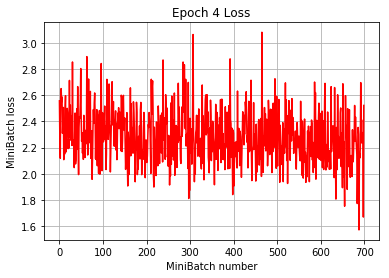

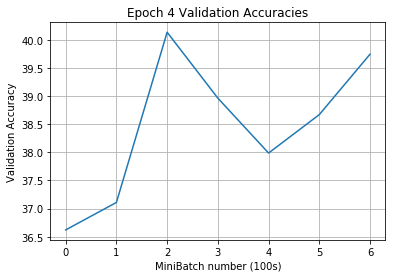

[Epoch 5]
iter:     0, loss min|avg|max: 0.066|2.131| 6.188, val acc: 39.45 %
iter:   100, loss min|avg|max: 0.096|1.895| 5.838, val acc: 38.67 %
iter:   200, loss min|avg|max: 0.029|2.160| 7.131, val acc: 39.06 %
iter:   300, loss min|avg|max: 0.018|2.032| 6.955, val acc: 40.23 %
iter:   400, loss min|avg|max: 0.023|2.188| 7.869, val acc: 39.65 %
iter:   500, loss min|avg|max: 0.038|2.172| 6.272, val acc: 39.45 %
iter:   600, loss min|avg|max: 0.024|2.388|10.220, val acc: 39.16 %


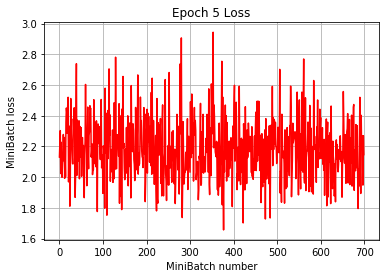

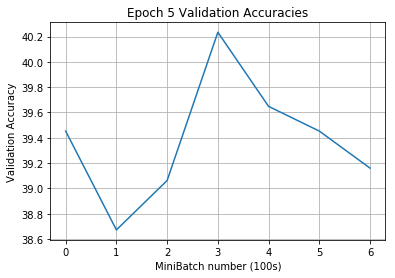

[Epoch 6]
iter:     0, loss min|avg|max: 0.076|1.953| 6.277, val acc: 39.26 %
iter:   100, loss min|avg|max: 0.020|2.342| 7.856, val acc: 40.33 %
iter:   200, loss min|avg|max: 0.057|1.984| 6.776, val acc: 39.45 %
iter:   300, loss min|avg|max: 0.124|1.990| 6.510, val acc: 40.23 %
iter:   400, loss min|avg|max: 0.033|2.094| 5.526, val acc: 39.06 %
iter:   500, loss min|avg|max: 0.071|2.016| 7.765, val acc: 40.72 %
iter:   600, loss min|avg|max: 0.059|1.971| 7.349, val acc: 40.23 %


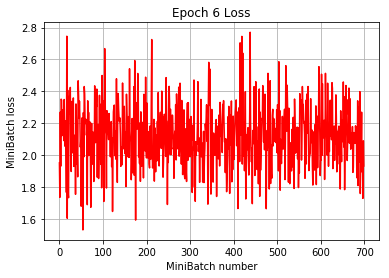

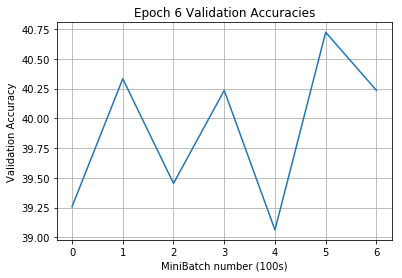

[Epoch 7]
iter:     0, loss min|avg|max: 0.095|2.038| 6.195, val acc: 40.33 %
iter:   100, loss min|avg|max: 0.009|1.914| 6.585, val acc: 40.92 %
iter:   200, loss min|avg|max: 0.254|2.289| 8.150, val acc: 41.21 %
iter:   300, loss min|avg|max: 0.012|2.312| 7.327, val acc: 41.02 %
iter:   400, loss min|avg|max: 0.074|2.053| 7.215, val acc: 41.60 %
iter:   500, loss min|avg|max: 0.073|1.944| 7.039, val acc: 40.23 %
iter:   600, loss min|avg|max: 0.041|1.969|11.027, val acc: 39.65 %


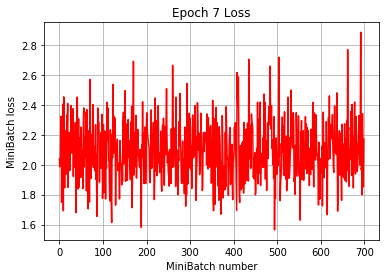

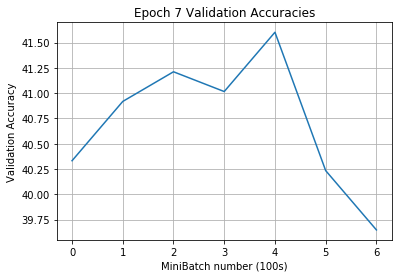

[Epoch 8]
iter:     0, loss min|avg|max: 0.042|2.169| 7.049, val acc: 41.50 %
iter:   100, loss min|avg|max: 0.109|2.232| 5.588, val acc: 40.23 %
iter:   200, loss min|avg|max: 0.042|1.951| 5.672, val acc: 41.21 %
iter:   300, loss min|avg|max: 0.048|1.931| 6.311, val acc: 41.02 %
iter:   400, loss min|avg|max: 0.050|2.190| 5.268, val acc: 41.50 %
iter:   500, loss min|avg|max: 0.029|2.067| 9.399, val acc: 40.92 %
iter:   600, loss min|avg|max: 0.045|1.997| 5.192, val acc: 40.82 %


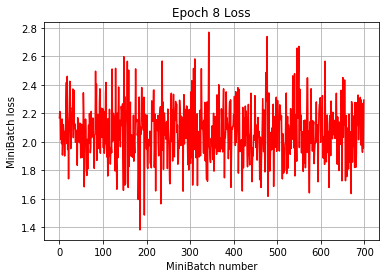

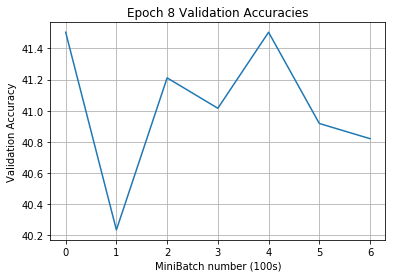

[Epoch 9]
iter:     0, loss min|avg|max: 0.004|2.109| 6.078, val acc: 40.92 %
iter:   100, loss min|avg|max: 0.101|2.091| 6.378, val acc: 40.72 %
iter:   200, loss min|avg|max: 0.109|1.732| 8.641, val acc: 39.45 %
iter:   300, loss min|avg|max: 0.024|2.071| 5.600, val acc: 40.62 %
iter:   400, loss min|avg|max: 0.027|1.902| 5.838, val acc: 41.21 %
iter:   500, loss min|avg|max: 0.001|2.124| 6.365, val acc: 41.60 %
iter:   600, loss min|avg|max: 0.020|2.050| 5.877, val acc: 40.72 %


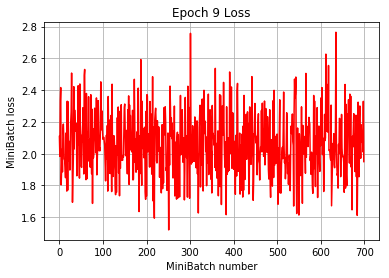

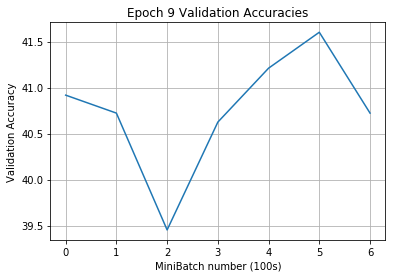

[Epoch 10]
iter:     0, loss min|avg|max: 0.016|2.000| 6.446, val acc: 41.11 %
iter:   100, loss min|avg|max: 0.007|2.108| 8.317, val acc: 40.33 %
iter:   200, loss min|avg|max: 0.017|2.184| 7.326, val acc: 41.02 %
iter:   300, loss min|avg|max: 0.038|1.905| 5.170, val acc: 41.60 %
iter:   400, loss min|avg|max: 0.119|2.262| 5.717, val acc: 40.82 %
iter:   500, loss min|avg|max: 0.009|1.970| 7.033, val acc: 41.11 %
iter:   600, loss min|avg|max: 0.098|2.070| 8.954, val acc: 41.21 %


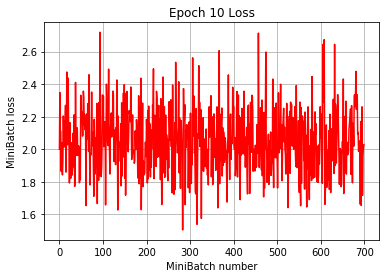

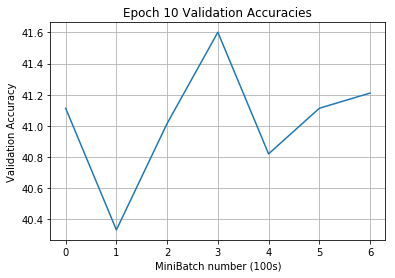

[Epoch 11]
iter:     0, loss min|avg|max: 0.081|2.224| 6.178, val acc: 40.62 %
iter:   100, loss min|avg|max: 0.061|2.115| 6.238, val acc: 41.31 %
iter:   200, loss min|avg|max: 0.075|1.940| 5.920, val acc: 40.53 %
iter:   300, loss min|avg|max: 0.030|1.935| 5.887, val acc: 41.21 %
iter:   400, loss min|avg|max: 0.018|1.641| 5.590, val acc: 41.80 %
iter:   500, loss min|avg|max: 0.024|1.845| 6.217, val acc: 41.21 %
iter:   600, loss min|avg|max: 0.219|2.151| 6.536, val acc: 41.31 %


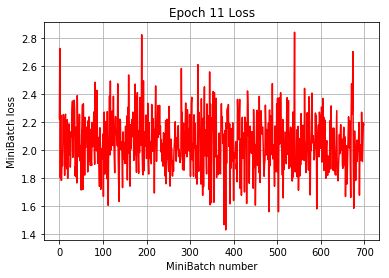

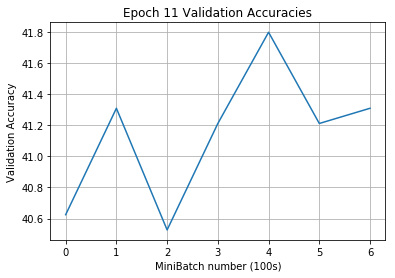

[Epoch 12]
iter:     0, loss min|avg|max: 0.026|2.015| 7.949, val acc: 40.82 %
iter:   100, loss min|avg|max: 0.019|2.242| 6.509, val acc: 40.92 %
iter:   200, loss min|avg|max: 0.015|2.269|10.995, val acc: 41.11 %
iter:   300, loss min|avg|max: 0.026|2.071| 5.405, val acc: 40.92 %
iter:   400, loss min|avg|max: 0.009|1.879| 7.150, val acc: 40.23 %
iter:   500, loss min|avg|max: 0.036|2.085| 6.706, val acc: 40.92 %
iter:   600, loss min|avg|max: 0.005|1.745| 7.748, val acc: 42.29 %


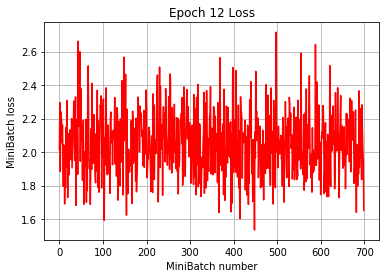

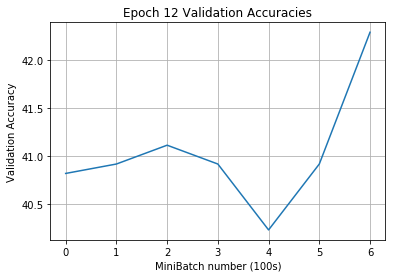

[Epoch 13]
iter:     0, loss min|avg|max: 0.036|1.914| 7.426, val acc: 41.02 %
iter:   100, loss min|avg|max: 0.067|2.237| 7.945, val acc: 40.92 %
iter:   200, loss min|avg|max: 0.036|1.923| 6.771, val acc: 41.02 %
iter:   300, loss min|avg|max: 0.008|2.200| 7.508, val acc: 40.72 %
iter:   400, loss min|avg|max: 0.007|2.143| 7.953, val acc: 41.21 %
iter:   500, loss min|avg|max: 0.038|1.925| 6.774, val acc: 41.31 %
iter:   600, loss min|avg|max: 0.004|2.027| 5.423, val acc: 41.31 %


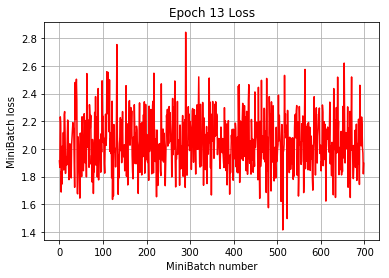

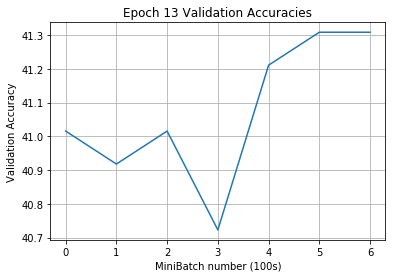

[Epoch 14]
iter:     0, loss min|avg|max: 0.130|2.289| 6.773, val acc: 41.31 %
iter:   100, loss min|avg|max: 0.007|1.757| 6.491, val acc: 41.41 %
iter:   200, loss min|avg|max: 0.047|2.364| 8.024, val acc: 40.43 %
iter:   300, loss min|avg|max: 0.025|2.159| 5.445, val acc: 41.11 %
iter:   400, loss min|avg|max: 0.010|2.386| 8.777, val acc: 41.21 %
iter:   500, loss min|avg|max: 0.041|2.325| 5.346, val acc: 40.72 %
iter:   600, loss min|avg|max: 0.015|1.835| 6.295, val acc: 41.50 %


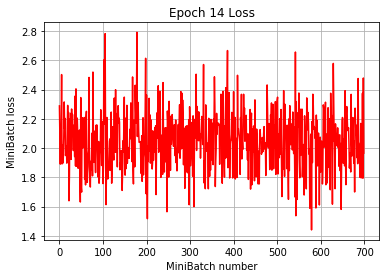

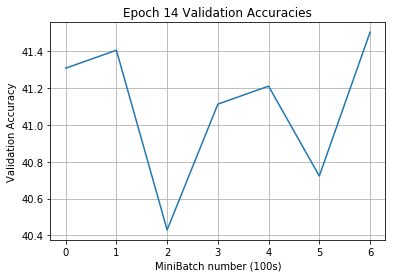

[Epoch 15]
iter:     0, loss min|avg|max: 0.001|1.547| 4.495, val acc: 41.02 %
iter:   100, loss min|avg|max: 0.007|1.911| 5.635, val acc: 40.33 %
iter:   200, loss min|avg|max: 0.022|2.232| 6.443, val acc: 40.72 %
iter:   300, loss min|avg|max: 0.002|1.613| 6.085, val acc: 40.62 %
iter:   400, loss min|avg|max: 0.046|1.922| 7.148, val acc: 40.82 %
iter:   500, loss min|avg|max: 0.004|1.877| 7.123, val acc: 41.02 %
iter:   600, loss min|avg|max: 0.060|2.131| 7.180, val acc: 40.72 %


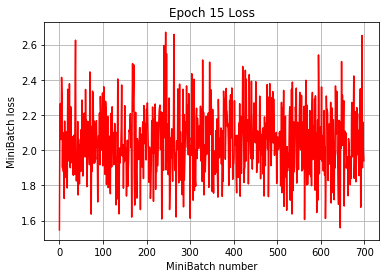

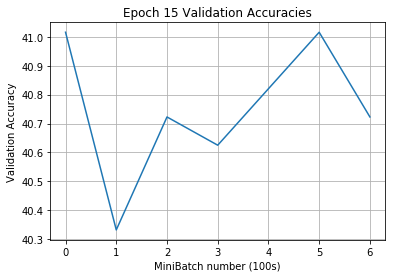

[Epoch 16]
iter:     0, loss min|avg|max: 0.023|2.084| 6.347, val acc: 41.02 %
iter:   100, loss min|avg|max: 0.026|2.226| 8.287, val acc: 41.21 %
iter:   200, loss min|avg|max: 0.018|2.129|11.767, val acc: 41.31 %
iter:   300, loss min|avg|max: 0.028|1.987| 7.112, val acc: 41.11 %
iter:   400, loss min|avg|max: 0.001|1.986| 7.505, val acc: 41.02 %
iter:   500, loss min|avg|max: 0.039|1.830| 6.981, val acc: 41.60 %
iter:   600, loss min|avg|max: 0.031|2.019| 7.409, val acc: 41.21 %


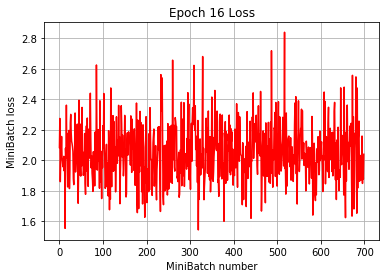

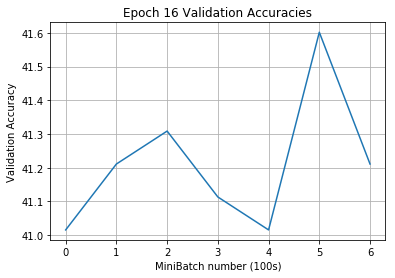

[Epoch 17]
iter:     0, loss min|avg|max: 0.007|2.481| 8.569, val acc: 41.31 %
iter:   100, loss min|avg|max: 0.043|1.932| 6.134, val acc: 41.02 %
iter:   200, loss min|avg|max: 0.025|1.908| 5.562, val acc: 41.21 %
iter:   300, loss min|avg|max: 0.030|2.324| 7.602, val acc: 42.09 %
iter:   400, loss min|avg|max: 0.013|1.935| 6.323, val acc: 41.31 %
iter:   500, loss min|avg|max: 0.022|1.949| 6.605, val acc: 41.21 %
iter:   600, loss min|avg|max: 0.012|2.267| 6.636, val acc: 40.82 %


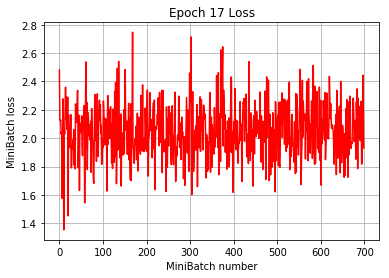

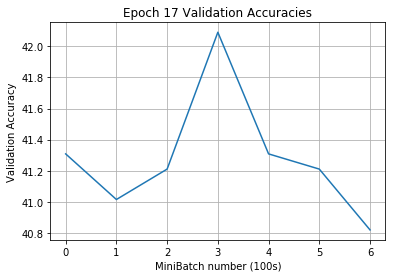

[Epoch 18]
iter:     0, loss min|avg|max: 0.038|2.078| 7.089, val acc: 40.62 %
iter:   100, loss min|avg|max: 0.017|1.997| 7.180, val acc: 40.82 %
iter:   200, loss min|avg|max: 0.047|2.102| 5.724, val acc: 41.11 %
iter:   300, loss min|avg|max: 0.035|2.197| 5.828, val acc: 40.23 %
iter:   400, loss min|avg|max: 0.011|2.178| 6.131, val acc: 41.02 %
iter:   500, loss min|avg|max: 0.109|2.148|10.209, val acc: 40.92 %
iter:   600, loss min|avg|max: 0.071|2.010| 5.672, val acc: 41.50 %


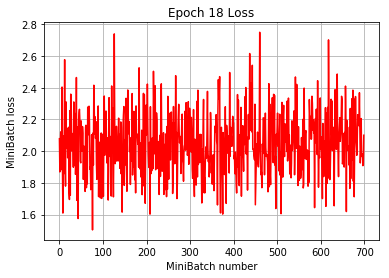

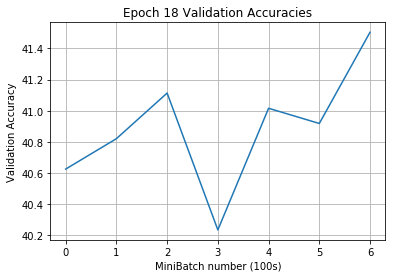

[Epoch 19]
iter:     0, loss min|avg|max: 0.030|2.013| 5.940, val acc: 40.72 %
iter:   100, loss min|avg|max: 0.033|1.849| 5.422, val acc: 40.92 %
iter:   200, loss min|avg|max: 0.046|2.123| 7.004, val acc: 40.72 %
iter:   300, loss min|avg|max: 0.034|2.002| 5.785, val acc: 41.80 %
iter:   400, loss min|avg|max: 0.053|2.016| 5.795, val acc: 40.43 %
iter:   500, loss min|avg|max: 0.051|2.128| 5.149, val acc: 40.82 %
iter:   600, loss min|avg|max: 0.067|2.193| 5.909, val acc: 41.60 %


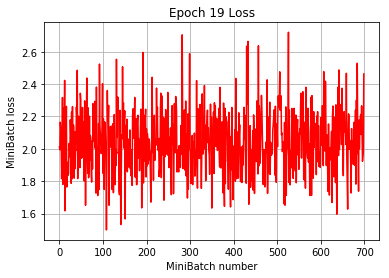

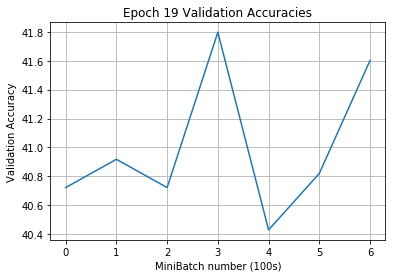

[Epoch 20]
iter:     0, loss min|avg|max: 0.012|2.153| 6.276, val acc: 41.02 %
iter:   100, loss min|avg|max: 0.016|1.997| 4.990, val acc: 41.02 %
iter:   200, loss min|avg|max: 0.094|2.045| 6.092, val acc: 41.11 %
iter:   300, loss min|avg|max: 0.052|1.961| 6.279, val acc: 40.72 %
iter:   400, loss min|avg|max: 0.020|2.014| 6.714, val acc: 41.41 %
iter:   500, loss min|avg|max: 0.021|1.894| 6.498, val acc: 41.89 %
iter:   600, loss min|avg|max: 0.061|2.408| 6.991, val acc: 41.31 %


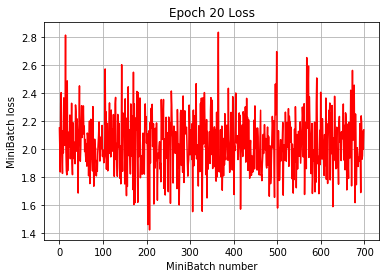

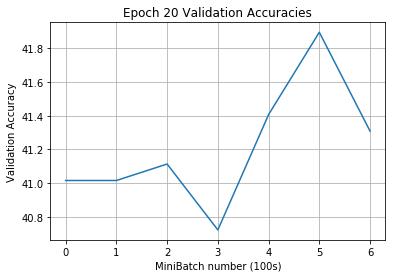

[Epoch 21]
iter:     0, loss min|avg|max: 0.054|1.825| 4.520, val acc: 41.21 %
iter:   100, loss min|avg|max: 0.033|1.911| 5.468, val acc: 41.02 %
iter:   200, loss min|avg|max: 0.057|2.165| 9.576, val acc: 40.82 %
iter:   300, loss min|avg|max: 0.002|2.400| 7.889, val acc: 40.92 %
iter:   400, loss min|avg|max: 0.079|2.129| 7.489, val acc: 40.92 %
iter:   500, loss min|avg|max: 0.064|2.236| 4.777, val acc: 40.92 %
iter:   600, loss min|avg|max: 0.009|1.758| 6.460, val acc: 41.89 %


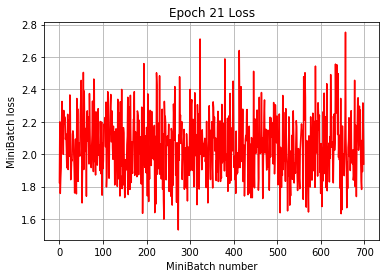

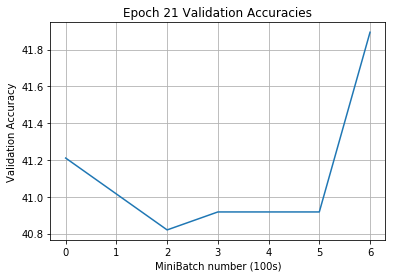

[Epoch 22]
iter:     0, loss min|avg|max: 0.012|2.116| 7.541, val acc: 41.41 %
iter:   100, loss min|avg|max: 0.130|2.007| 7.655, val acc: 41.02 %
iter:   200, loss min|avg|max: 0.001|2.073| 6.010, val acc: 40.92 %
iter:   300, loss min|avg|max: 0.016|1.683| 5.060, val acc: 40.92 %
iter:   400, loss min|avg|max: 0.028|2.156| 6.183, val acc: 41.41 %
iter:   500, loss min|avg|max: 0.013|1.784| 5.823, val acc: 41.11 %
iter:   600, loss min|avg|max: 0.006|2.102| 6.127, val acc: 39.94 %


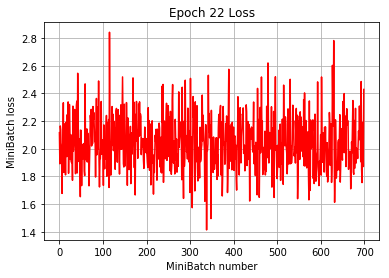

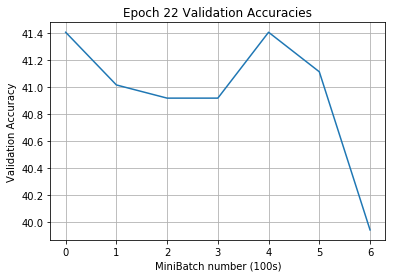

[Epoch 23]
iter:     0, loss min|avg|max: 0.035|2.269| 7.254, val acc: 41.11 %
iter:   100, loss min|avg|max: 0.066|2.169| 7.181, val acc: 41.21 %
iter:   200, loss min|avg|max: 0.062|2.261| 5.879, val acc: 41.89 %
iter:   300, loss min|avg|max: 0.052|1.975| 5.746, val acc: 41.11 %
iter:   400, loss min|avg|max: 0.011|1.589| 5.855, val acc: 41.21 %
iter:   500, loss min|avg|max: 0.068|2.008| 5.102, val acc: 41.02 %
iter:   600, loss min|avg|max: 0.028|1.878| 6.851, val acc: 41.02 %


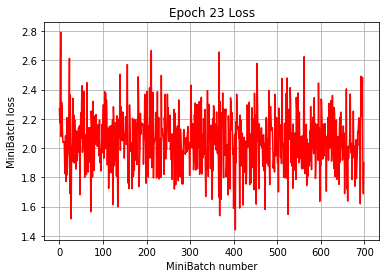

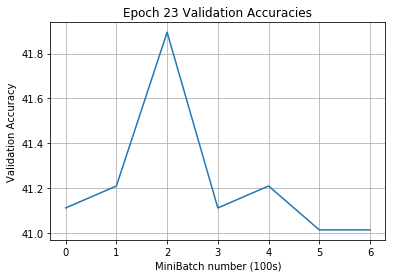

[Epoch 24]
iter:     0, loss min|avg|max: 0.020|2.215| 5.534, val acc: 41.31 %
iter:   100, loss min|avg|max: 0.027|1.980| 6.164, val acc: 40.72 %
iter:   200, loss min|avg|max: 0.002|1.915| 5.968, val acc: 41.11 %
iter:   300, loss min|avg|max: 0.190|2.147| 6.304, val acc: 41.41 %
iter:   400, loss min|avg|max: 0.027|2.225| 7.568, val acc: 40.53 %
iter:   500, loss min|avg|max: 0.009|2.149| 7.017, val acc: 41.50 %
iter:   600, loss min|avg|max: 0.075|1.915| 6.560, val acc: 41.11 %


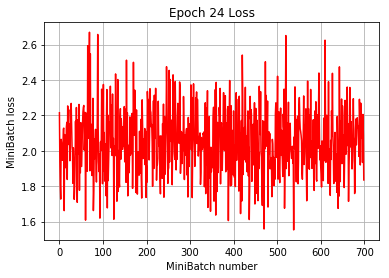

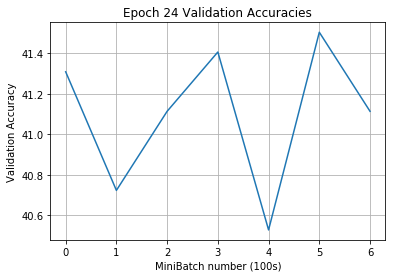

[Epoch 25]
iter:     0, loss min|avg|max: 0.027|1.971| 7.335, val acc: 40.53 %
iter:   100, loss min|avg|max: 0.069|1.757| 6.534, val acc: 41.41 %
iter:   200, loss min|avg|max: 0.057|1.915| 6.438, val acc: 40.92 %
iter:   300, loss min|avg|max: 0.026|1.937|11.044, val acc: 41.31 %
iter:   400, loss min|avg|max: 0.047|2.037| 6.159, val acc: 40.92 %
iter:   500, loss min|avg|max: 0.039|2.286| 7.262, val acc: 40.53 %
iter:   600, loss min|avg|max: 0.010|2.054| 8.242, val acc: 41.11 %


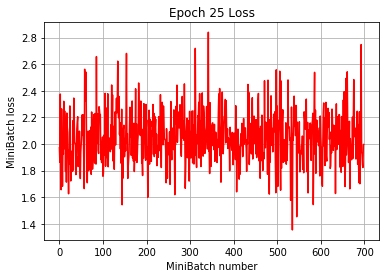

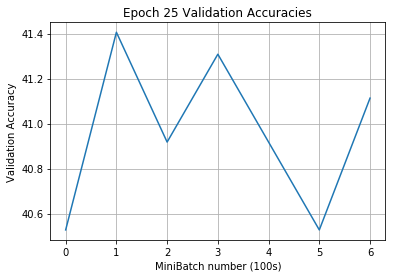

[Epoch 26]
iter:     0, loss min|avg|max: 0.038|1.950| 6.138, val acc: 41.11 %
iter:   100, loss min|avg|max: 0.069|2.170| 9.868, val acc: 40.53 %
iter:   200, loss min|avg|max: 0.041|2.644| 9.678, val acc: 41.21 %
iter:   300, loss min|avg|max: 0.212|2.170| 6.711, val acc: 41.31 %
iter:   400, loss min|avg|max: 0.005|1.910| 5.885, val acc: 41.41 %
iter:   500, loss min|avg|max: 0.132|2.283| 6.845, val acc: 41.31 %
iter:   600, loss min|avg|max: 0.011|1.950| 8.760, val acc: 41.11 %


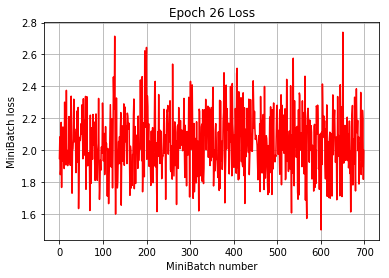

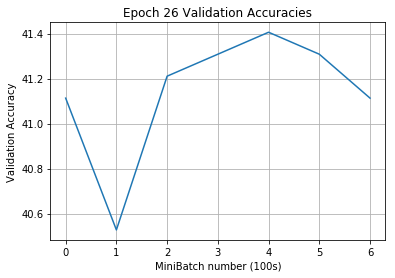

[Epoch 27]
iter:     0, loss min|avg|max: 0.016|1.737| 5.880, val acc: 41.50 %
iter:   100, loss min|avg|max: 0.082|2.126| 5.854, val acc: 40.53 %
iter:   200, loss min|avg|max: 0.003|1.603| 5.398, val acc: 40.62 %
iter:   300, loss min|avg|max: 0.012|1.967| 6.016, val acc: 40.72 %
iter:   400, loss min|avg|max: 0.138|2.228| 7.311, val acc: 41.31 %
iter:   500, loss min|avg|max: 0.001|1.810| 6.788, val acc: 41.70 %
iter:   600, loss min|avg|max: 0.140|2.048|10.040, val acc: 41.11 %


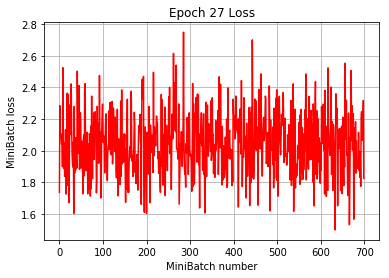

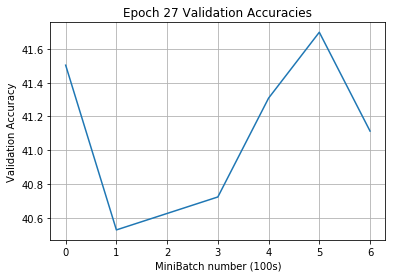

[Epoch 28]
iter:     0, loss min|avg|max: 0.053|2.067| 6.473, val acc: 40.62 %
iter:   100, loss min|avg|max: 0.064|2.020| 9.152, val acc: 41.31 %
iter:   200, loss min|avg|max: 0.045|1.823| 5.565, val acc: 40.62 %
iter:   300, loss min|avg|max: 0.021|2.043| 6.592, val acc: 41.89 %
iter:   400, loss min|avg|max: 0.006|1.711| 6.787, val acc: 41.50 %
iter:   500, loss min|avg|max: 0.012|1.904| 5.318, val acc: 41.21 %
iter:   600, loss min|avg|max: 0.019|1.913| 6.807, val acc: 40.72 %


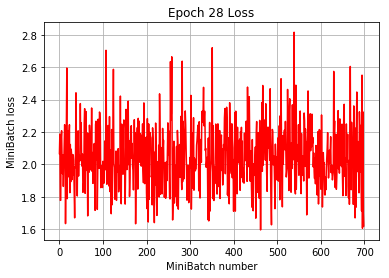

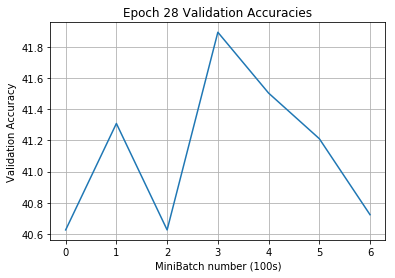

[Epoch 29]
iter:     0, loss min|avg|max: 0.019|2.174| 8.920, val acc: 40.92 %
iter:   100, loss min|avg|max: 0.003|1.603| 5.660, val acc: 40.92 %
iter:   200, loss min|avg|max: 0.033|1.940| 6.583, val acc: 41.41 %
iter:   300, loss min|avg|max: 0.028|1.889| 7.324, val acc: 41.21 %
iter:   400, loss min|avg|max: 0.018|2.234| 8.391, val acc: 41.60 %
iter:   500, loss min|avg|max: 0.053|2.206| 6.906, val acc: 41.21 %
iter:   600, loss min|avg|max: 0.030|2.118| 7.358, val acc: 40.92 %


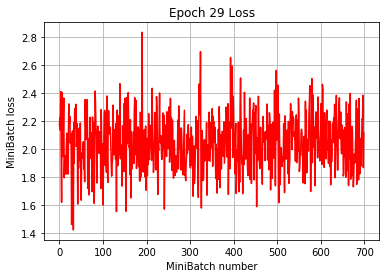

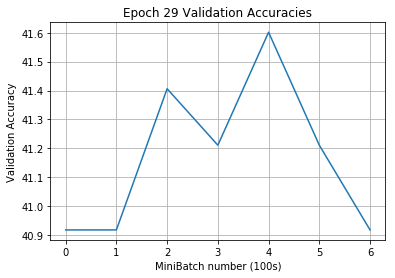

[Epoch 30]
iter:     0, loss min|avg|max: 0.028|2.138| 8.291, val acc: 40.92 %
iter:   100, loss min|avg|max: 0.054|1.963| 5.889, val acc: 41.02 %
iter:   200, loss min|avg|max: 0.076|2.193| 7.330, val acc: 40.62 %
iter:   300, loss min|avg|max: 0.083|2.008| 6.214, val acc: 40.43 %
iter:   400, loss min|avg|max: 0.087|2.031| 7.076, val acc: 40.82 %
iter:   500, loss min|avg|max: 0.025|1.840| 6.681, val acc: 41.50 %
iter:   600, loss min|avg|max: 0.000|2.208| 5.983, val acc: 40.53 %


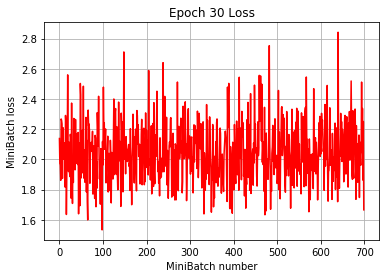

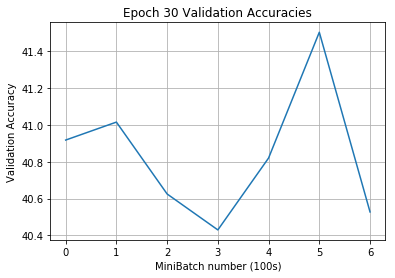

Execution Time: 5828510 ms


In [28]:
cnn7_model = CNN7(NUM_CLASSES)
train(cnn7_model, num_epochs = 30)

In [29]:
test_acc7 = get_accuracy(cnn7_model, X_test, y_test, X_test_iter, y_test_iter)
print ("CNN7 - Test Accuracy: {:.2f} %".format(test_acc7), end="\n\n")

cnn7_model.summary()

CNN7 - Test Accuracy: 42.85 %

Model: "cn_n7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1 (Conv2D)               multiple                  1792      
_________________________________________________________________
max_pool1 (MaxPooling2D)     multiple                  0         
_________________________________________________________________
conv2 (Conv2D)               multiple                  73856     
_________________________________________________________________
max_pool2 (MaxPooling2D)     multiple                  0         
_________________________________________________________________
conv3 (Conv2D)               multiple                  295168    
_________________________________________________________________
global_average_pooling2d (Gl multiple                  0         
_________________________________________________________________
fc1 (Dense)                  m

## Max. Test Accuracy = 41.67 %
CNN architecture - **CNN7** <br>
Epochs: **7** <br>
Iterations per epoch: **700** <br>
Learning Rate: **3e-4**